In [6]:
import os
from collections import defaultdict
from pathlib import Path
from typing import Any, List, Callable, Union

import numpy as np
import pandas as pd
import tensorflow as tf
from tqdm.notebook import tqdm
#from tqdm import tqdm
import pyfaidx

def one_hot_encode(
        sequence: str,
        alphabet: str = "ACGT",
        neutral_alphabet: str = "N",
        neutral_value: Any = 0,
        dtype=np.float32
    ) -> np.ndarray:
    """One-hot encode sequence."""

    def to_uint8(s):
        return np.frombuffer(s.encode("ascii"), dtype=np.uint8)

    lookup = np.zeros([np.iinfo(np.uint8).max, len(alphabet)], dtype=dtype)
    lookup[to_uint8(alphabet)] = np.eye(len(alphabet), dtype=dtype)
    lookup[to_uint8(neutral_alphabet)] = neutral_value
    lookup = lookup.astype(dtype)
    return lookup[to_uint8(sequence)]


class WindowedGenomeDataset:

    def __init__(
            self,
            target_path: str,
            fasta_path: str,
            window_size: int = None,
            chromosomes: List[str] = None,
            dtype: np.float32 = None
        ):
        self.target_path = target_path
        self.fasta_path = fasta_path
        self.chromosomes = chromosomes
        self.dtype = dtype

        df = pd.read_table(target_path, header=None, sep="\t")
        c = df[0].isin(chromosomes) if chromosomes else np.array(len(df)*[True])
        self.windows = df.loc[c, :2].values
        self.targets = df.loc[c, 3:].values.astype(self.dtype)

        _, start, stop = self.windows[0]
        self.window_size = window_size or (stop - start)

        self.input_shape = (self.window_size, 4)
        self.output_shape = (self.targets.shape[1],)

        self.genome = None

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, item: Union[int, slice]):
        if not self.genome:
            from pyfaidx import Fasta
            self.genome = Fasta(self.fasta_path)

        chrom = self.windows[item, 0]
        start = self.windows[item, 1]
        stop = self.windows[item, 2]

        labels = self.targets[item]

        if isinstance(item, slice):
            seq = ""
            for chr, i, j in zip(chrom, start, stop):
                seq += self.genome[chr][i:j].seq.upper()

            inputs = one_hot_encode(seq)
            inputs = inputs.reshape(len(chrom), self.window_size, 4)

            item = range(item.start or 0, item.stop or len(self), item.step or 1)
            item = np.array(list(item), dtype=np.int32)
        else:
            seq = self.genome[chrom][start:stop].seq.upper()
            inputs = one_hot_encode(seq)

            item = item if item >= 0 else len(self) + item

        output = {
            "inputs": inputs,
            "labels": labels,
            "meta": {
                "id": item,
                "chrom": chrom,
                "start": start,
                "stop": stop
            }
        }
        return output

    def to_each_record(self, indices: List[int] =  None):

        def serialize_example(id, inputs, labels, chrom, start, stop):

            inputs = tf.convert_to_tensor(inputs, dtype=tf.float32)
            inputs = tf.io.serialize_tensor(inputs).numpy()
            labels = tf.convert_to_tensor(labels, dtype=tf.float32)
            labels = tf.io.serialize_tensor(labels).numpy()

            chrom = chrom.encode("utf-8")

            feature = {
                "id": tf.train.Feature(int64_list=tf.train.Int64List(value=[id])),
                "inputs": tf.train.Feature(bytes_list=tf.train.BytesList(value=[inputs])),
                "labels": tf.train.Feature(bytes_list=tf.train.BytesList(value=[labels])),
                "chrom": tf.train.Feature(bytes_list=tf.train.BytesList(value=[chrom])),
                "start": tf.train.Feature(int64_list=tf.train.Int64List(value=[start])),
                "stop": tf.train.Feature(int64_list=tf.train.Int64List(value=[stop]))
            }

            example_proto = tf.train.Example(features=tf.train.Features(feature=feature))
            return example_proto.SerializeToString()

        def generator():
            for i in tqdm(indices or range(len(self))):
                output = self[i]
                yield serialize_example(
                    id=output["meta"]["id"],
                    inputs=output["inputs"],
                    labels=output["labels"],
                    chrom=output["meta"]["chrom"],
                    start=output["meta"]["start"],
                    stop=output["meta"]["stop"]
                )
        return generator
    
    def to_tfrecord(self, path: str = '', indices: List[int] = None):
        generator = self.to_each_record(indices)
        serialized_features_dataset = tf.data.Dataset.from_generator(
            generator,
            output_types=tf.string,
            output_shapes=()
        )
        if path != '':
            writer = tf.data.experimental.TFRecordWriter(path)
            writer.write(serialized_features_dataset)
        else:
            return serialized_features_dataset


In [7]:
DATA_DIR = "../data/"
SAVE_DIR = "../models/"

In [8]:
items = [
    ("train", [2, 4, 6, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, "X"]),
    ("valid", [7, 9]),
    ("test", [1, 3, 5]),
    ("debug",[19])
]

datasets = {}

In [11]:
for name, chroms in items:
    datasets[name] = WindowedGenomeDataset(
        target_path=f"{DATA_DIR}/targets.bed",
        fasta_path=f"{DATA_DIR}/GRCm38.fa",
        chromosomes=[f"chr{i}" for i in chroms],
        window_size=999,
        dtype=np.float32
    )

100%|████████████████████████████████████████████████████████████████████████████| 56988/56988 [01:13<00:00, 779.09it/s]


In [16]:
train_size = len(datasets['train'])
valid_size = len(datasets['valid'])
test_size = len(datasets['test'])

total = train_size + valid_size + test_size

print("Train: ", train_size, train_size / total)
print("Validation: ", valid_size, valid_size / total)
print("Validation: ", test_size,  test_size / total)

Train:  1733242 0.7026630169507466
Validation:  250622 0.10160312906924136
Validation:  482812 0.19573385398001197


In [15]:
# 1. experimental.TFRecordWriter (deprecated)

for name, chroms in items:
    datasets[name].to_tfrecord(f"../data/{name}.tfrec")


  0%|          | 0/1733242 [00:00<?, ?it/s]

  0%|          | 0/250622 [00:00<?, ?it/s]

  0%|          | 0/482812 [00:00<?, ?it/s]

  0%|          | 0/56988 [00:00<?, ?it/s]

In [15]:
# 2. save and load
for name, chroms in items:
    tf.data.experimental.save(datasets[name].to_tfrecord('', returnDataset=True),
                              f"../data/{name}")
    # datasets[name] = tf.data.experimental.load(f"../data/{name}")


Instructions for updating:
Use `tf.data.Dataset.load(...)` instead.


In [68]:
# 3.  io.TFRecordWriter
for name, chroms in items:
    dlist = datasets[name].to_tfrecord()
    with tf.io.TFRecordWriter(f"../data/{name}.tfrec.pyn") as file_writer:
        for d in dlist:
            file_writer.write(d.numpy())

  0%|          | 0/1733242 [00:00<?, ?it/s]

  0%|          | 0/250622 [00:00<?, ?it/s]

  0%|          | 0/482812 [00:00<?, ?it/s]

  0%|          | 0/56988 [00:00<?, ?it/s]

# Data

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf

In [9]:
AUTO = tf.data.experimental.AUTOTUNE
THRESHOLD = 0.0006867924257022952
BATCH_SIZE = 128


def parse_tfrecord(example):
    feature_description = {
        "id": tf.io.FixedLenFeature([], tf.int64),
        "inputs": tf.io.FixedLenFeature([], tf.string),
        "labels": tf.io.FixedLenFeature([], tf.string),
        "chrom": tf.io.FixedLenFeature([], tf.string),
        "start": tf.io.FixedLenFeature([], tf.int64),
        "stop": tf.io.FixedLenFeature([], tf.int64)
    }
    
    record = tf.io.parse_single_example(example, feature_description)
    record["inputs"] = tf.io.parse_tensor(record["inputs"], out_type=tf.float32)
    record["labels"] = tf.io.parse_tensor(record["labels"], out_type=tf.float32)

    inputs = tf.reshape(record["inputs"] , [999, 4])
    labels = tf.reshape(record["labels"], [33,])

    return inputs, labels

def load_dataset(filenames):

    records = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO)
    records = records.map(parse_tfrecord, num_parallel_calls=AUTO)

    def data_augment(inputs, labels):
        return inputs, tf.where(labels > THRESHOLD, 1.0, 0.0)


    return records.map(data_augment, num_parallel_calls=AUTO)


def get_dataset(batch_size: int, name: str):

    if name == "train":
        dataset = load_dataset([DATA_DIR + "/train.tfrec.pyn"])
        dataset = dataset.shuffle(10000)
        dataset = dataset.repeat()
    elif name == "valid":
        dataset = load_dataset([DATA_DIR + "/valid.tfrec.pyn"])
        dataset = dataset.repeat()
    elif name == "test":
        dataset = load_dataset([DATA_DIR + "/test.tfrec.pyn"])

    dataset = dataset.batch(batch_size).prefetch(AUTO) 

    return dataset

In [10]:
train_ds = get_dataset(BATCH_SIZE, name="train")
valid_ds = get_dataset(BATCH_SIZE, name="valid")
test_ds = get_dataset(BATCH_SIZE, name="test")

Metal device set to: Apple M1 Max


2022-12-05 15:12:47.735227: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-12-05 15:12:47.735783: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [14]:
train_size = 1733242
valid_size = 250622
test_size = 482812
total = train_size + valid_size + test_size

print("Train: ", train_size / total)
print("Validation: ", valid_size / total)
print("Validation: ", test_size / total)

Train:  0.7026630169507466
Validation:  0.10160312906924136
Validation:  0.19573385398001197


# Model

In [17]:
class RevCompConv1D(tf.keras.layers.Conv1D):
  """
  Implement forward and reverse-complement filter convolutions
  for 1D signals. It takes as input either a single input or two inputs
  (where the second input is the reverse complement scan). If a single input,
  this performs both forward and reverse complement scans and either merges it
  (if concat=True) or returns a separate scan for forward and reverse comp.
  """
  def __init__(self, *args, concat=False, **kwargs):
    super(RevCompConv1D, self).__init__(*args, **kwargs)
    self.concat = concat


  def call(self, inputs, inputs2=None):

    if inputs2 is not None:
      # create rc_kernels
      rc_kernel = self.kernel[::-1,::-1,:]

      # convolution 1D
      outputs = self._convolution_op(inputs, self.kernel)
      rc_outputs = self._convolution_op(inputs2, rc_kernel)

    else:
      # create rc_kernels
      rc_kernel = tf.concat([self.kernel, self.kernel[::-1,::-1,:]], axis=-1)

      # convolution 1D
      outputs = self._convolution_op(inputs, rc_kernel)

      # unstack to forward and reverse strands
      outputs = tf.unstack(outputs, axis=2)
      rc_outputs = tf.stack(outputs[self.filters:], axis=2)
      outputs = tf.stack(outputs[:self.filters], axis=2)

    # add bias
    if self.use_bias:
      outputs = tf.nn.bias_add(outputs, self.bias)
      rc_outputs = tf.nn.bias_add(rc_outputs, self.bias)

    # add activations
    if self.activation is not None:
      outputs = self.activation(outputs)
      rc_outputs = self.activation(rc_outputs)

    if self.concat:
      return tf.concat([outputs, rc_outputs], axis=-1)
    else:
      return outputs, rc_outputs


def dilated_residual_block(input_layer, filter_size, rates):
    num_filters = input_layer.shape.as_list()[-1]
    nn = tf.keras.layers.Conv1D(
        filters=num_filters,
        kernel_size=filter_size,
        activation=None,
        use_bias=False,
        padding='same',
        dilation_rate=rates[0],
    )(input_layer)
    nn = tf.keras.layers.BatchNormalization()(nn)

    for f in rates[1:]:
        nn = tf.keras.layers.Activation('relu')(nn)
        nn = tf.keras.layers.Dropout(0.1)(nn)
        nn = tf.keras.layers.Conv1D(
            filters=num_filters,
            kernel_size=filter_size,
            strides=1,
            activation=None,
            use_bias=False,
            padding='same',
            dilation_rate=f
        )(nn)

    nn = tf.keras.layers.BatchNormalization()(nn)
    nn = tf.keras.layers.add([input_layer, nn])
    return tf.keras.layers.Activation('relu')(nn)


def residualbind(input_shape, output_shape, activation='exponential', num_units=[128, 256, 512, 512], rc=False):

    # input layer
    inputs = tf.keras.layers.Input(shape=input_shape)

    # layer 1
    if rc:
        nn = RevCompConv1D(filters=num_units[0], kernel_size=19, use_bias=False, padding='same', concat=True)(inputs)
    else:
        nn = tf.keras.layers.Conv1D(
            filters=num_units[0],
            kernel_size=19,
            strides=1,
            activation=None,
            use_bias=False,
            padding='same'
        )(inputs)

    nn = tf.keras.layers.BatchNormalization()(nn)
    nn = tf.keras.layers.Activation(activation)(nn)
    nn = tf.keras.layers.Dropout(0.1)(nn)

    # dilated residual block
    nn = dilated_residual_block(nn, filter_size=3, rates=[1, 2, 4, 8])
    nn = tf.keras.layers.MaxPooling1D(pool_size=10)(nn) # 500
    nn = tf.keras.layers.Dropout(0.2)(nn)

    # layer 2
    nn = tf.keras.layers.Conv1D(
        filters=num_units[1],
        kernel_size=7,
        strides=1,
        activation=None,
        use_bias=False,
        padding='same',
    )(nn)
    nn = tf.keras.layers.BatchNormalization()(nn)
    nn = tf.keras.layers.Activation('relu')(nn)
    nn = tf.keras.layers.Dropout(0.1)(nn)

    # dilated residual block
    nn = dilated_residual_block(nn, filter_size=3, rates=[1, 2, 4])
    nn = tf.keras.layers.MaxPooling1D(pool_size=10)(nn) # 50
    nn = tf.keras.layers.Dropout(0.2)(nn)

  # layer 2
    nn = tf.keras.layers.Conv1D(
        filters=num_units[2],
        kernel_size=7,
        strides=1,
        activation=None,
        use_bias=False,
        padding='same',
    )(nn)
    nn = tf.keras.layers.BatchNormalization()(nn)
    nn = tf.keras.layers.Activation('relu')(nn)

    nn = tf.keras.layers.GlobalAveragePooling1D()(nn) # 1
    nn = tf.keras.layers.Dropout(0.3)(nn)

    # Fully-connected NN
    nn = tf.keras.layers.Flatten()(nn)
    nn = tf.keras.layers.Dense(num_units[3], activation=None, use_bias=False)(nn)
    nn = tf.keras.layers.BatchNormalization()(nn)
    nn = tf.keras.layers.Activation('relu')(nn)
    nn = tf.keras.layers.Dropout(0.5)(nn)

    # output layer
    logits = tf.keras.layers.Dense(output_shape, activation='linear', use_bias=True)(nn)
    outputs = tf.keras.layers.Activation('sigmoid')(logits)

    # create and return model
    return tf.keras.Model(inputs=inputs, outputs=outputs)

# Training

In [9]:
model = residualbind(
    input_shape=(999, 4),
    output_shape=33,
    activation="exponential", 
    num_units=[128, 256, 512, 512],
    rc=False
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=False, label_smoothing=0.0),
    metrics=[
        tf.keras.metrics.AUC(curve="ROC", name="auroc"),
        tf.keras.metrics.AUC(curve="PR", name="aupr")
    ]
)

In [74]:
%%capture output
train_steps = train_size // BATCH_SIZE
valid_steps = valid_size // BATCH_SIZE

history = model.fit(
        train_ds,
        epochs=2,
        steps_per_epoch=train_steps,
        validation_data=valid_ds,
        validation_steps=valid_steps,
        callbacks=[
             tf.keras.callbacks.EarlyStopping(
                monitor="val_aupr",
                patience=10,
                verbose=1,
                mode="max",
                restore_best_weights=True
            ),
             tf.keras.callbacks.ReduceLROnPlateau(
                monitor="val_aupr",
                factor=0.2,
                patience=3,
                min_lr=1e-7,
                mode="max",
                verbose=1
            )
        ]
    )

2022-11-27 13:49:18.742997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2022-11-27 15:31:44.170852: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


In [76]:
model.evaluate(test_ds, steps=test_size // BATCH_SIZE)

3771/3771 [==============================] - 718s 190ms/step - loss: 0.8200 - auroc: 0.7282 - aupr: 0.6592


[0.8200222253799438, 0.7281503081321716, 0.659187912940979]

In [75]:
model.save('../models/test')

INFO:tensorflow:Assets written to: ../models/test/assets


INFO:tensorflow:Assets written to: ../models/test/assets


In [77]:
output.show()

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [78]:
model.load_weights("../models/resbind_weights.h5")

In [79]:
model.evaluate(test_ds, steps=test_size // BATCH_SIZE)

3771/3771 [==============================] - 744s 197ms/step - loss: 0.5971 - auroc: 0.7819 - aupr: 0.7208


[0.5970627665519714, 0.7819393277168274, 0.7208306789398193]

In [ ]:
train_steps = train_size // BATCH_SIZE
valid_steps = valid_size // BATCH_SIZE

history = model.fit(
        train_ds,
        epochs=10,
        steps_per_epoch=train_steps,
        validation_data=valid_ds,
        validation_steps=valid_steps,
        callbacks=[
             tf.keras.callbacks.EarlyStopping(
                monitor="val_aupr",
                patience=10,
                verbose=1,
                mode="max",
                restore_best_weights=True
            ),
             tf.keras.callbacks.ReduceLROnPlateau(
                monitor="val_aupr",
                factor=0.2,
                patience=3,
                min_lr=1e-7,
                mode="max",
                verbose=1
            )
        ]
    )

Epoch 1/10
13540/13540 [==============================] - 6518s 481ms/step - loss: 0.5288 - auroc: 0.8003 - aupr: 0.7358 - val_loss: 0.5487 - val_auroc: 0.7759 - val_aupr: 0.6816 - lr: 0.0010
Epoch 2/10
13540/13540 [==============================] - 6501s 480ms/step - loss: 0.5281 - auroc: 0.8008 - aupr: 0.7368 - val_loss: 0.5459 - val_auroc: 0.7764 - val_aupr: 0.6824 - lr: 0.0010
Epoch 3/10
13540/13540 [==============================] - 6486s 479ms/step - loss: 0.5277 - auroc: 0.8012 - aupr: 0.7375 - val_loss: 0.5472 - val_auroc: 0.7762 - val_aupr: 0.6805 - lr: 0.0010
Epoch 4/10
13540/13540 [==============================] - 6479s 478ms/step - loss: 0.5274 - auroc: 0.8014 - aupr: 0.7378 - val_loss: 0.5459 - val_auroc: 0.7763 - val_aupr: 0.6815 - lr: 0.0010
Epoch 5/10
13540/13540 [==============================] - ETA: 0s - loss: 0.5272 - auroc: 0.8016 - aupr: 0.7383
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
13540/13540 [==============================

In [81]:
model.save("../models/test_10")
model.evaluate(test_ds, steps=test_size // BATCH_SIZE)

INFO:tensorflow:Assets written to: ../models/test_10/assets


INFO:tensorflow:Assets written to: ../models/test_10/assets


3771/3771 [==============================] - 752s 199ms/step - loss: 0.6005 - auroc: 0.7843 - aupr: 0.7247


[0.6004589796066284, 0.7843059301376343, 0.7246575355529785]

In [11]:
%load_ext tensorboard
tb_cb = tf.keras.callbacks.TensorBoard(
    log_dir='./log',
    histogram_freq=1,
    write_images=True
)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [17]:
train_steps = train_size // BATCH_SIZE
valid_steps = valid_size // BATCH_SIZE

history = model.fit(
        train_ds,
        epochs=20,
        steps_per_epoch=train_steps,
        validation_data=valid_ds,
        validation_steps=valid_steps,
        callbacks=[
             tf.keras.callbacks.EarlyStopping(
                monitor="val_aupr",
                patience=10,
                verbose=1,
                mode="max",
                restore_best_weights=True
            ),
             tf.keras.callbacks.ReduceLROnPlateau(
                monitor="val_aupr",
                factor=0.2,
                patience=3,
                min_lr=1e-7,
                mode="max",
                verbose=1
            ),
            tb_cb
        ]
    )

Epoch 1/20


2022-11-28 15:00:42.849642: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-11-28 15:00:42.851166: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


13540/13540 [==============================] - ETA: 0s - loss: 0.5525 - auroc: 0.7786 - aupr: 0.6983

2022-11-28 16:42:49.320979: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


13540/13540 [==============================] - 6507s 480ms/step - loss: 0.5525 - auroc: 0.7786 - aupr: 0.6983 - val_loss: 0.5753 - val_auroc: 0.7580 - val_aupr: 0.6543 - lr: 0.0010
Epoch 2/20
13540/13540 [==============================] - 6610s 488ms/step - loss: 0.5448 - auroc: 0.7858 - aupr: 0.7104 - val_loss: 0.6425 - val_auroc: 0.7481 - val_aupr: 0.6425 - lr: 0.0010
Epoch 3/20
13540/13540 [==============================] - 6485s 479ms/step - loss: 0.5420 - auroc: 0.7884 - aupr: 0.7149 - val_loss: 0.7342 - val_auroc: 0.7000 - val_aupr: 0.5867 - lr: 0.0010
Epoch 4/20
13540/13540 [==============================] - ETA: 0s - loss: 0.5401 - auroc: 0.7902 - aupr: 0.7179
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
13540/13540 [==============================] - 6482s 479ms/step - loss: 0.5401 - auroc: 0.7902 - aupr: 0.7179 - val_loss: 0.6278 - val_auroc: 0.7549 - val_aupr: 0.6503 - lr: 0.0010
Epoch 5/20
13540/13540 [==============================] - 6479s 4

In [18]:
model.save("../models/test_20")
model.evaluate(test_ds, steps=test_size // BATCH_SIZE)

INFO:tensorflow:Assets written to: ../models/test_20/assets


INFO:tensorflow:Assets written to: ../models/test_20/assets


3771/3771 [==============================] - 742s 197ms/step - loss: 0.6267 - auroc: 0.7699 - aupr: 0.7031


[0.6266504526138306, 0.7698942422866821, 0.7030693292617798]

#  Saliency analysis (position)

In [25]:
import logomaker

def saliency_maps(X, class_index, batch_size):

    return function_batch(X, class_index, saliency_map, batch_size)

def function_batch(X, class_index, fun, batch_size):

    dataset = tf.data.Dataset.from_tensor_slices(X)
    outputs = []

    for batch in dataset.batch(batch_size):
        outputs.append(fun(batch, class_index))

    return np.concatenate(outputs, axis=0)

def saliency_map(batch, class_index):

    if not tf.is_tensor(batch):
        batch = tf.Variable(batch)

    with tf.GradientTape() as tape:
        tape.watch(batch)
        outputs = model(batch)[:, class_index]

    return tape.gradient(outputs, batch)



In [22]:
print("Loading data...")

AUTO = tf.data.experimental.AUTOTUNE
THRESHOLD = 0.0006867924257022952
BATCH_SIZE = 128

DATA_DIR = "../data"

test_ds = WindowedGenomeDataset(
    target_path=DATA_DIR + "/targets.bed",
    fasta_path=DATA_DIR + "/GRCm38.fa",
    chromosomes=[f"chr{i}" for i in [1, 3, 5]],
    window_size=999,
    dtype=np.float32
)

X_test = test_ds[:]['inputs']
y_test = np.where(test_ds[:]['labels'] > THRESHOLD, 1.0, 0.0)

print("Data loading complete.")

Loading data...
Data loading complete.


In [18]:
model = residualbind(
    input_shape=(999, 4),
    output_shape=33,
    activation="exponential",
    num_units=[128, 256, 512, 512],
    rc=False
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=False, label_smoothing=0.0),
    metrics=[
        tf.keras.metrics.AUC(curve="ROC", name="auroc"),
        tf.keras.metrics.AUC(curve="PR", name="aupr")
    ]
)
model.load_weights('../models/resbind_weights.h5')


  0%|          | 0/13 [00:00<?, ?it/s]

Num. positive sequences for class 9: 325
11/11 [==============================] - 1s 54ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 21: 1432
45/45 [==============================] - 2s 55ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 22: 54
2/2 [==============================] - 0s 51ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 23: 818
26/26 [==============================] - 1s 54ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 12: 549
18/18 [==============================] - 1s 53ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 13: 226
8/8 [==============================] - 0s 51ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 14: 109
4/4 [==============================] - 0s 50ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 15: 418
14/14 [==============================] - 1s 52ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 25: 129
5/5 [==============================] - 0s 47ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 29: 240
8/8 [==============================] - 0s 54ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 30: 138
5/5 [==============================] - 0s 51ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 31: 194
7/7 [==============================] - 0s 50ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Num. positive sequences for class 32: 113
4/4 [==============================] - 0s 55ms/step


  0%|          | 0/20 [00:00<?, ?it/s]

Saliency analysis complete.


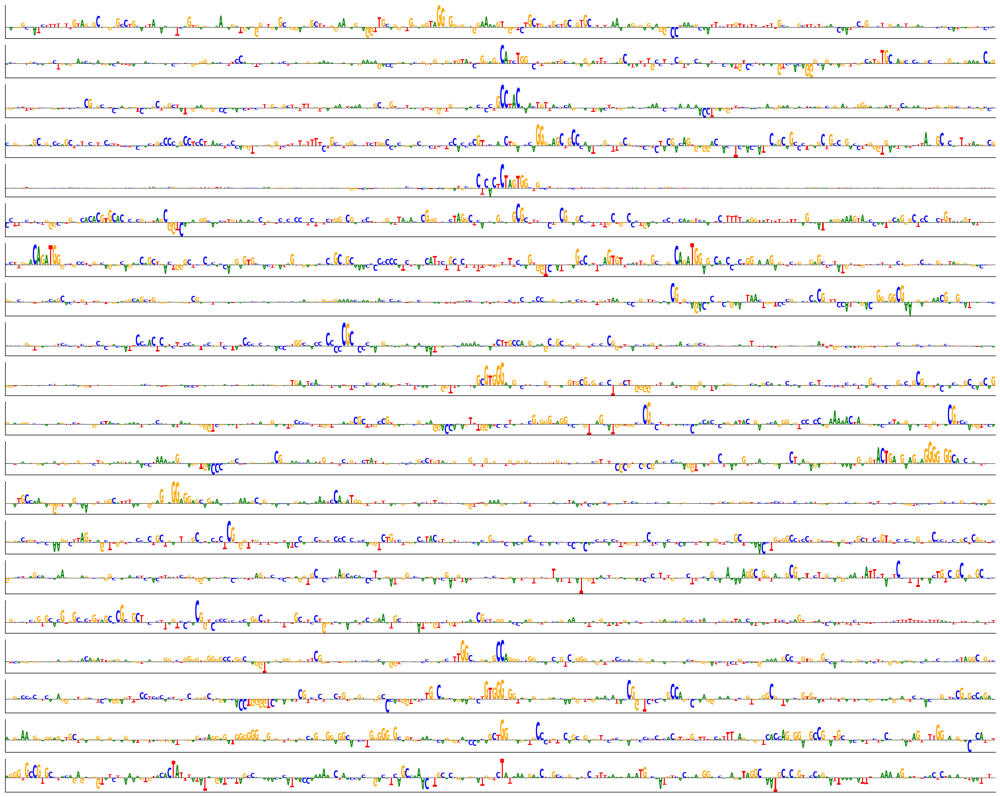

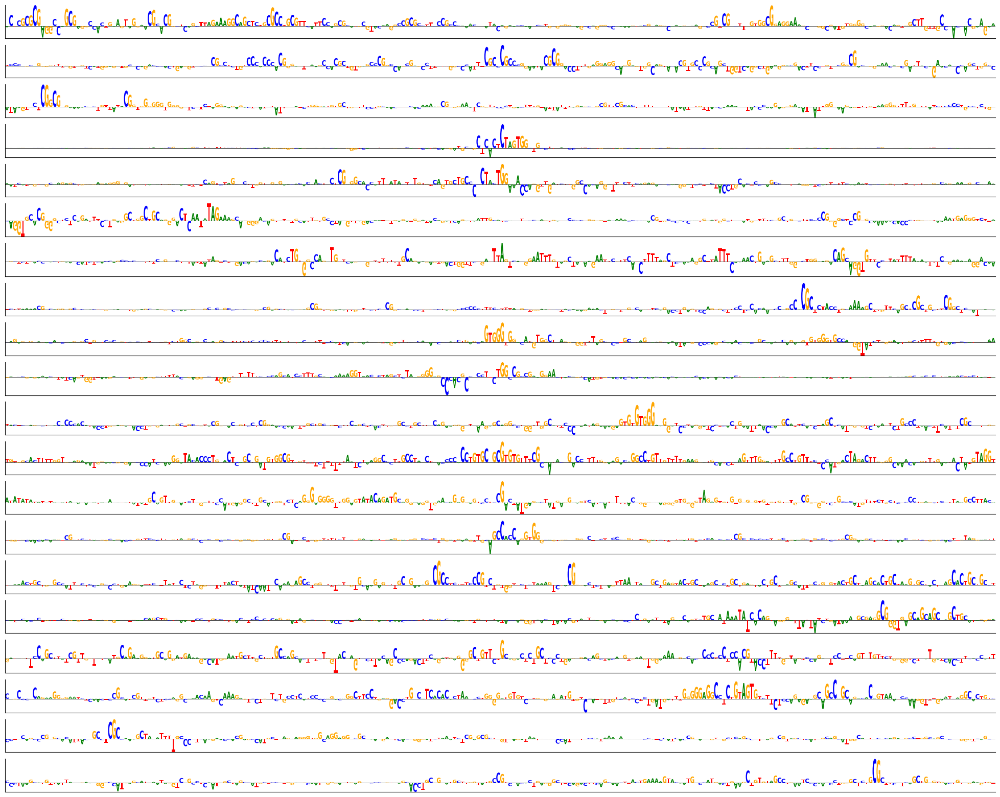

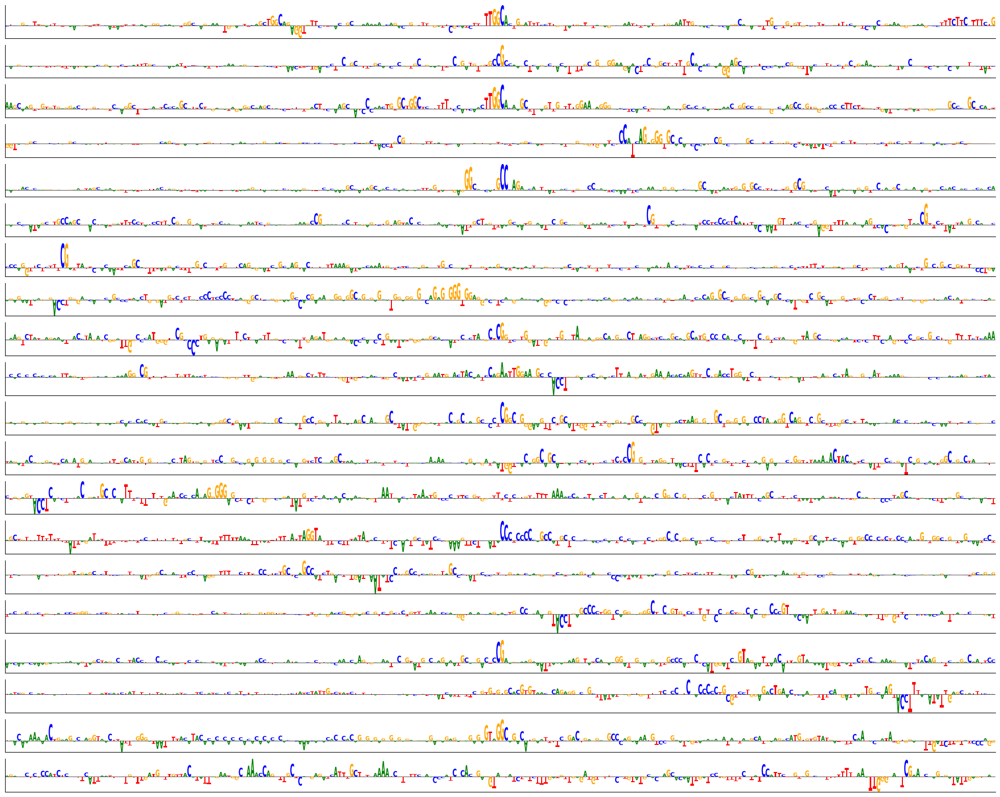

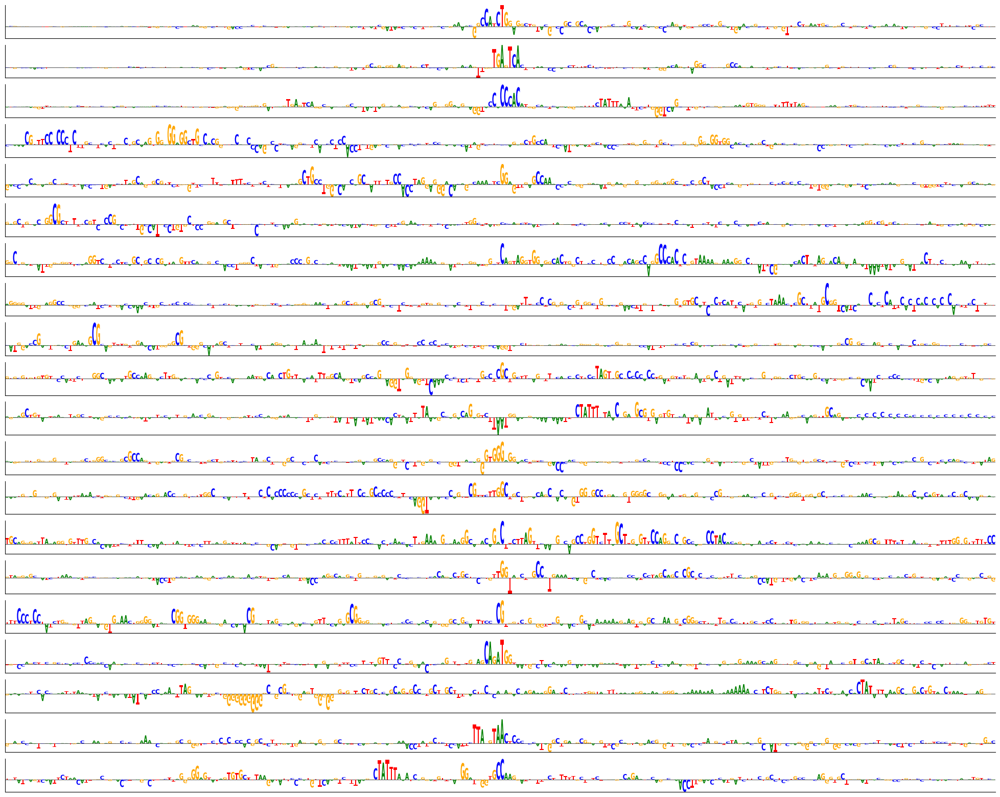

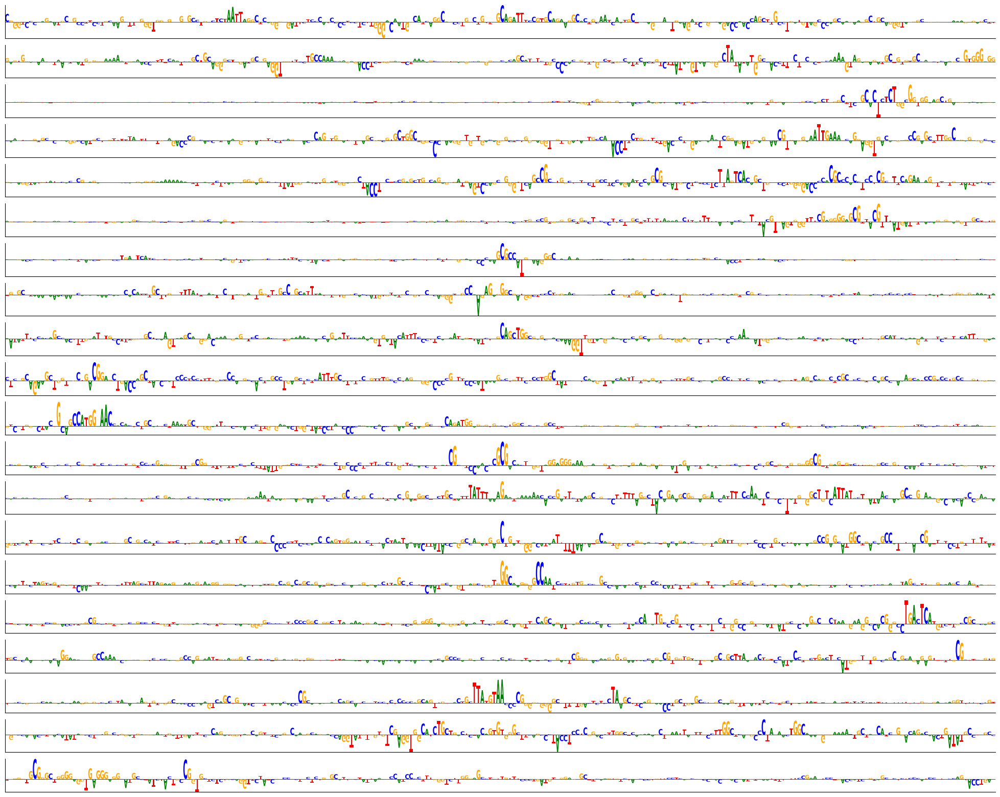

...

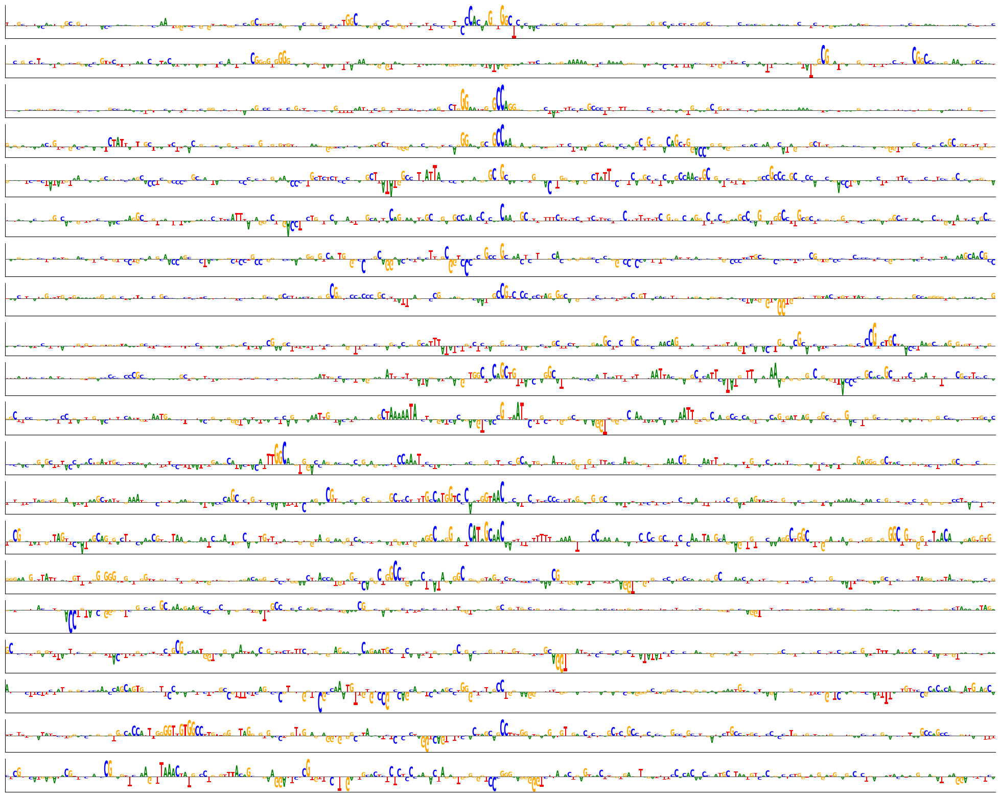

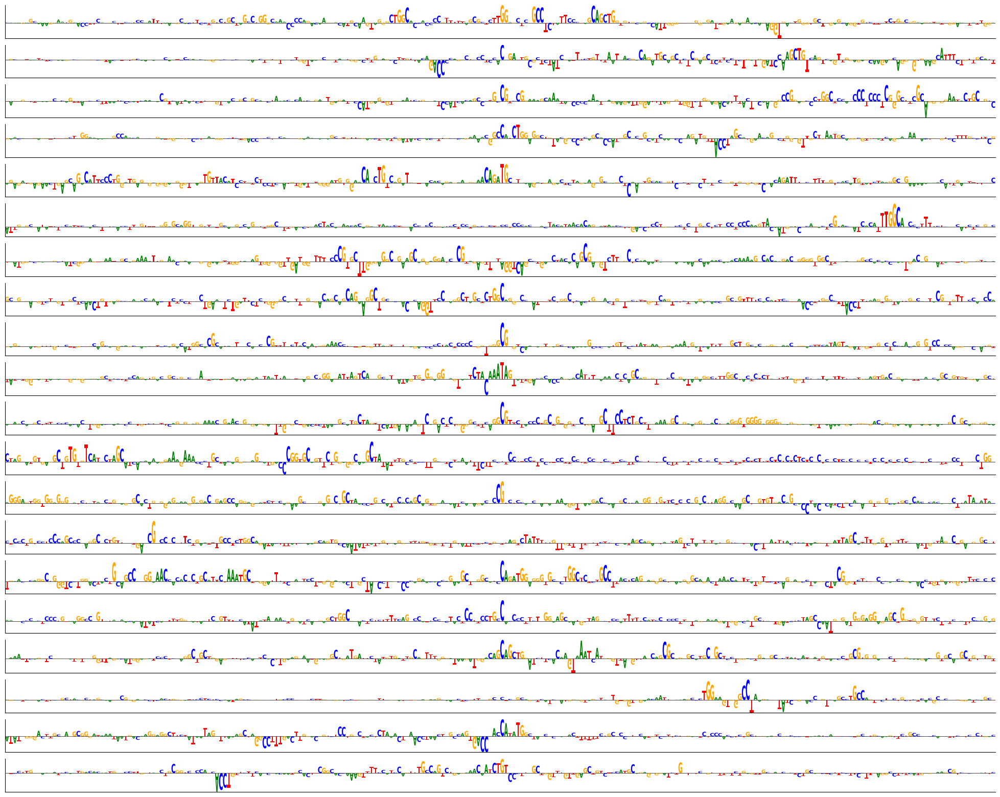

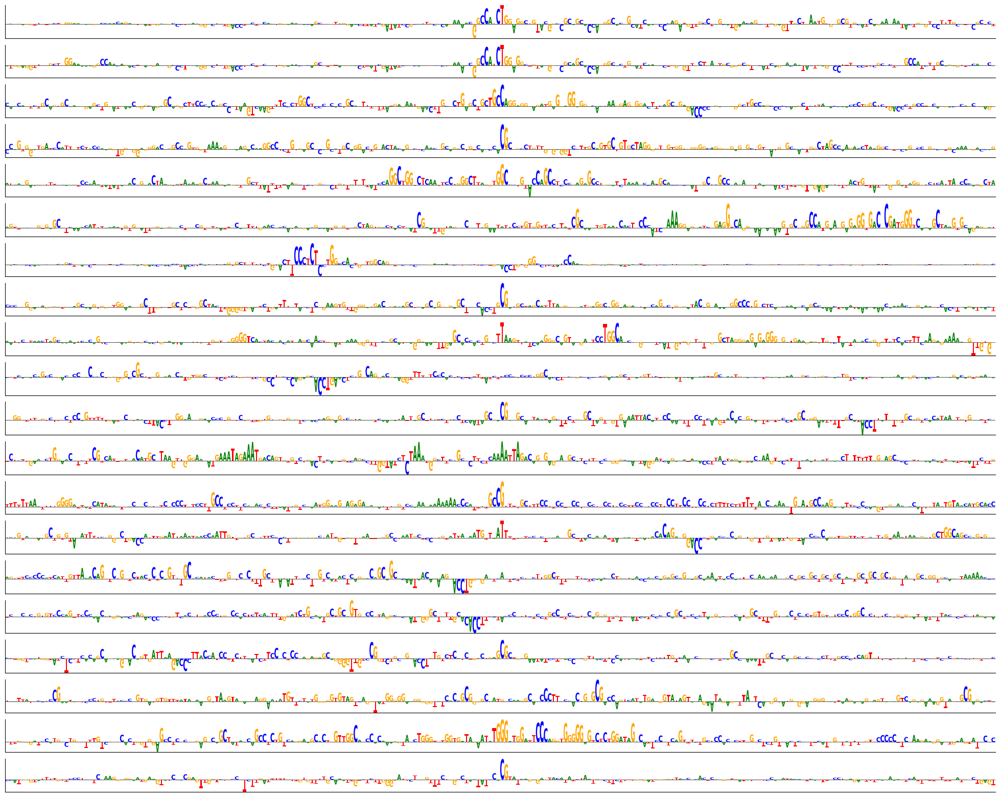

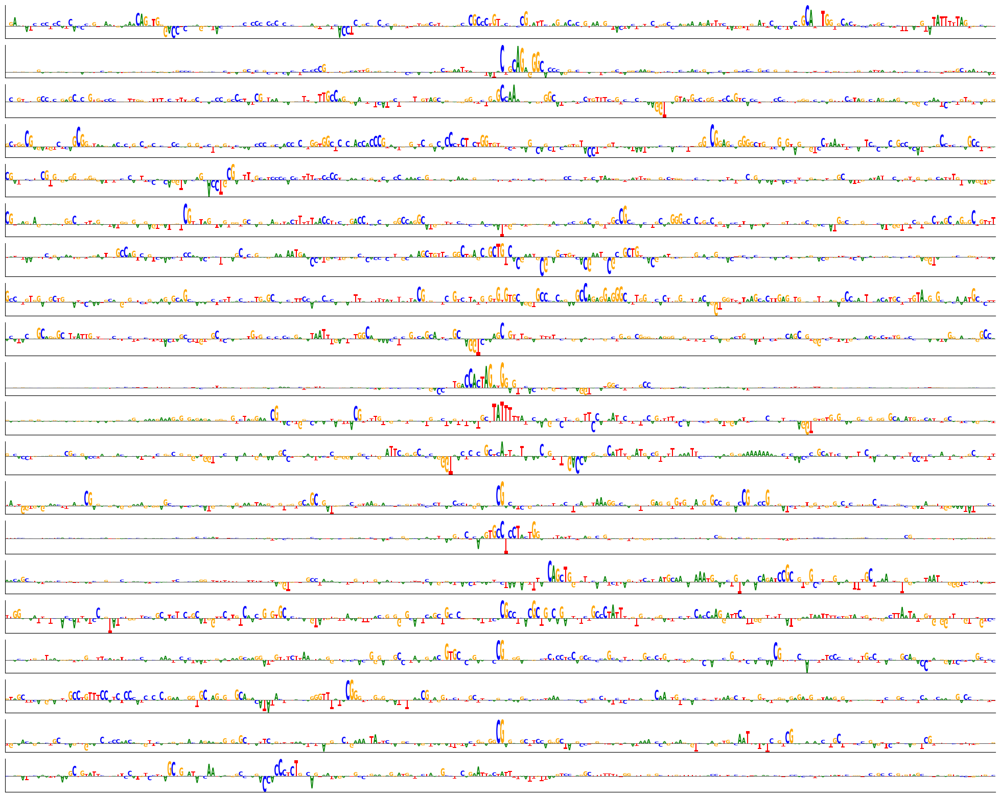

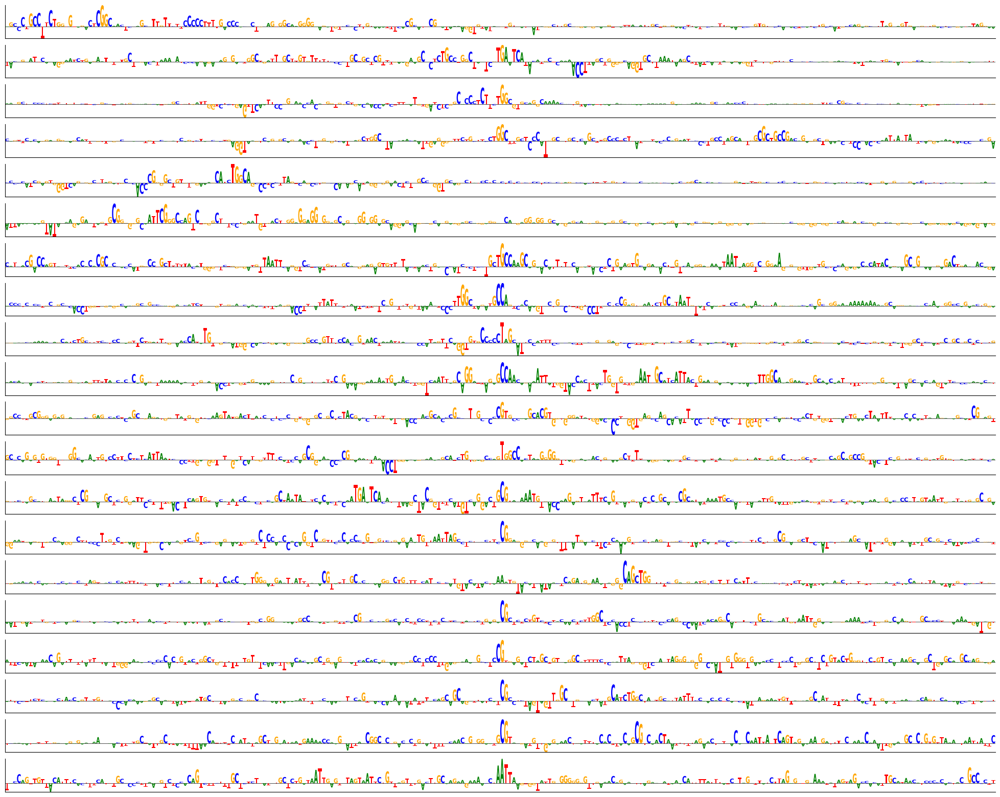

In [31]:
attr_score = {}
alphabet = 'ACGT'
num_plots = 20 # top 20
plot_size = 250
classes = [9, 21, 22, 23, 12, 13, 14, 15, 25, 29, 30, 31, 32] # Inhibitory neuronal cell types

for _, class_index in tqdm(enumerate(classes), total=len(classes)):

    # get high predicted sequences
    pos_index = np.where((y_test[:, class_index] == 1) & (np.sum(y_test,axis=1) == 1))[0]
    print(f"Num. positive sequences for class {class_index}: {len(pos_index)}")

    if(len(pos_index) < 1):
        continue

    predictions = model.predict(X_test[pos_index])
    plot_index = pos_index[np.argsort(predictions[:, class_index])[::-1]]
    X = X_test[plot_index[0:num_plots]]

    # get attribution scores
    attr_score[class_index] = saliency_maps(X, class_index, batch_size=BATCH_SIZE)
    attr_score[class_index] = attr_score[class_index] * X


    # plot attribution scores for sequences with top predictions
    N, L, A = attr_score[class_index].shape
    fig = plt.figure(figsize=(25, num_plots))

    for k in tqdm(range(N)):
        score = np.max(attr_score[class_index][k], axis=1)
        index = np.argmax(score)
        start = np.maximum(0, index - int(plot_size/2))
        end = start + plot_size
        if end > L:
            start = L - plot_size
            end = L
        plot_range = range(start,end)

        counts_df = pd.DataFrame(data=0.0, columns=list(alphabet), index=list(range(plot_size)))
        for a in range(A):
            for l in range(plot_size):
                counts_df.iloc[l,a] = attr_score[class_index][k, plot_range[l], a]

        ax = plt.subplot(num_plots, 1, k+1)
        logomaker.Logo(counts_df, ax=ax)
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.yaxis.set_ticks_position('none')
        ax.xaxis.set_ticks_position('none')
        plt.xticks([])
        plt.yticks([])


    outfile = f"../results/saliency/saliency_{class_index}__250_2.0.pdf"
    fig.savefig(outfile, format='pdf', dpi=200, bbox_inches='tight')

print("Saliency analysis complete.")


# Filter analysis (motif)

In [2]:
import os
from collections import defaultdict
from pathlib import Path
from typing import Any, List, Callable, Union

import numpy as np
import pandas as pd
import tensorflow as tf
from tqdm.notebook import tqdm
#from tqdm import tqdm
import pyfaidx
from  collections import OrderedDict
tf.compat.v1.enable_eager_execution()

In [3]:
annotation = '../data/BICCN_sub_cluster_and_annotation_file.csv'
marker_cluster = pd.read_csv(annotation)
major_types = marker_cluster.celltype.values
sub_types = marker_cluster.annotation_file.values.astype(str)

In [4]:
def one_hot_encode(
        sequence: str,
        alphabet: str = "ACGT",
        neutral_alphabet: str = "N",
        neutral_value: Any = 0,
        dtype=np.float32
    ) -> np.ndarray:
    """One-hot encode sequence."""

    def to_uint8(s):
        return np.frombuffer(s.encode("ascii"), dtype=np.uint8)

    lookup = np.zeros([np.iinfo(np.uint8).max, len(alphabet)], dtype=dtype)
    lookup[to_uint8(alphabet)] = np.eye(len(alphabet), dtype=dtype)
    lookup[to_uint8(neutral_alphabet)] = neutral_value
    lookup = lookup.astype(dtype)
    return lookup[to_uint8(sequence)]


class WindowedGenomeDataset:

    def __init__(
            self,
            target_path: str,
            fasta_path: str,
            window_size: int = None,
            chromosomes: List[str] = None,
            dtype: np.float32 = None
        ):
        self.target_path = target_path
        self.fasta_path = fasta_path
        self.chromosomes = chromosomes
        self.dtype = dtype

        df = pd.read_table(target_path, header=None, sep="\t")
        c = df[0].isin(chromosomes) if chromosomes else np.array(len(df)*[True])
        self.windows = df.loc[c, :2].values
        self.targets = df.loc[c, 3:].values.astype(self.dtype)

        _, start, stop = self.windows[0]
        self.window_size = window_size or (stop - start)

        self.input_shape = (self.window_size, 4)
        self.output_shape = (self.targets.shape[1],)

        self.genome = None

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, item: Union[int, slice]):
        if not self.genome:
            from pyfaidx import Fasta
            self.genome = Fasta(self.fasta_path)

        chrom = self.windows[item, 0]
        start = self.windows[item, 1]
        stop = self.windows[item, 2]

        labels = self.targets[item]

        if isinstance(item, slice):
            seq = ""
            for chr, i, j in zip(chrom, start, stop):
                seq += self.genome[chr][i:j].seq.upper()

            inputs = one_hot_encode(seq)
            print(len(chr), inputs.shape, self.window_size)
            inputs = inputs.reshape(len(chrom), self.window_size, 4)

            item = range(item.start or 0, item.stop or len(self), item.step or 1)
            item = np.array(list(item), dtype=np.int32)
        else:
            seq = self.genome[chrom][start:stop].seq.upper()
            inputs = one_hot_encode(seq)

            item = item if item >= 0 else len(self) + item

        output = {
            "inputs": inputs,
            "labels": labels,
            "meta": {
                "id": item,
                "chrom": chrom,
                "start": start,
                "stop": stop
            }
        }
        return output

    def to_each_record(self, indices: List[int] =  None):

        def serialize_example(id, inputs, labels, chrom, start, stop):

            inputs = tf.convert_to_tensor(inputs, dtype=tf.float32)
            inputs = tf.io.serialize_tensor(inputs).numpy()
            labels = tf.convert_to_tensor(labels, dtype=tf.float32)
            labels = tf.io.serialize_tensor(labels).numpy()

            chrom = chrom.encode("utf-8")

            feature = {
                "id": tf.train.Feature(int64_list=tf.train.Int64List(value=[id])),
                "inputs": tf.train.Feature(bytes_list=tf.train.BytesList(value=[inputs])),
                "labels": tf.train.Feature(bytes_list=tf.train.BytesList(value=[labels])),
                "chrom": tf.train.Feature(bytes_list=tf.train.BytesList(value=[chrom])),
                "start": tf.train.Feature(int64_list=tf.train.Int64List(value=[start])),
                "stop": tf.train.Feature(int64_list=tf.train.Int64List(value=[stop]))
            }

            example_proto = tf.train.Example(features=tf.train.Features(feature=feature))
            return example_proto.SerializeToString()

        def generator():
            for i in tqdm(indices or range(len(self))):
                output = self[i]
                yield serialize_example(
                    id=output["meta"]["id"],
                    inputs=output["inputs"],
                    labels=output["labels"],
                    chrom=output["meta"]["chrom"],
                    start=output["meta"]["start"],
                    stop=output["meta"]["stop"]
                )
        return generator
    
    def to_tfrecord(self, path: str = '', indices: List[int] = None):
        generator = self.to_each_record(indices)
        serialized_features_dataset = tf.data.Dataset.from_generator(
            generator,
            output_types=tf.string,
            output_shapes=()
        )
        if path != '':
            writer = tf.data.experimental.TFRecordWriter(path)
            writer.write(serialized_features_dataset)
        else:
            return serialized_features_dataset


In [19]:
markers = {}
for t,p in zip(["IN", "EX"], ["GABAergic_markers_fc_5k.bed", "Glutamatergic_markers_fc_5k.bed"]):

    markers[t] = {
        "bed_path": p,
        "classes": [i for i in range(len(major_types)) if t in major_types[i]]
     }

for s in np.unique(sub_types):
    path = s.split("_location.bed")[0]
    bed_path = path + "_5k.bed"
    m = path.split("_")[-1]
    markers[m.upper()] = {
        "bed_path": bed_path,
        "classes": [i for i in range(len(sub_types)) if m in sub_types[i]]
     }


# marker = sys.argv[1]
marker  = 'IN'
marker_bed_path = f"../data/markers_5k/{markers[marker]['bed_path']}"
classes = markers[marker]["classes"]
print(classes)
task = f"task{classes[0]}"
tile_idx = len(classes)

# ==============================================================================
# Load and prepare data (cluster set)
# ==============================================================================
print("Loading data and computing saliency scores...")
marker_ds = WindowedGenomeDataset(
    target_path=marker_bed_path,
    fasta_path=DATA_DIR + "/GRCm38.fa",
    window_size=4995,
    dtype=np.float32
)

X_test = marker_ds[:]['inputs']
X_test = X_test.reshape(np.prod([X_test.shape[0], 5]), 999, 4)
print(X_test.shape)

# ==============================================================================
# Compute Class Saliency Scores
# ==============================================================================
scores = OrderedDict()
hyp_scores = OrderedDict()

print(tf.executing_eagerly())
for class_index in classes:

    print(f"Class index: {class_index}\nNumber of positive sequences: {len(X_test)}")
    dataset = tf.data.Dataset.from_tensor_slices(X_test)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=False)
    print(dataset)
    total = np.ceil(X_test.shape[0] / BATCH_SIZE)

    saliency = []
    print(dataset)
    for i, x in tqdm(enumerate(dataset), total=total):
        x = tf.Variable(x)

        with tf.GradientTape() as tape:
            tape.watch(x)
            outputs = model(x)[:, class_index]

        saliency += [tape.gradient(outputs, x)]

    saliency = np.concatenate(saliency, axis=0)

    scores[f"task{class_index}"] = saliency*X_test
    hyp_scores[f"task{class_index}"] = saliency - np.mean(saliency, axis=-1)[:,:,None]

# ==============================================================================
# Combine Cluster Scores and Sequences
# ==============================================================================
task_to_scores = OrderedDict()
task_to_hyp_scores = OrderedDict()

task_to_scores[task] = np.concatenate([val for (key, val) in scores.items()])
task_to_hyp_scores[task] = np.concatenate([val for (key, val) in hyp_scores.items()])
onehot_data = np.tile(X_test, (tile_idx,1,1))

print(f"Length of scores: {len(task_to_hyp_scores[task])}")
print(f"Length of data: {len(onehot_data)}")
print("Finished computing saliency scores!")


[0, 11, 12, 13, 14, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31]
Loading data and computing saliency scores...
../data/markers_5k/GABAergic_markers_fc_5k.bed
(2560, 999, 4)
True
Class index: 0
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 11
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 12
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 13
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 14
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 20
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 21
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 22
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 24
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 25
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 26
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 27
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 28
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 29
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 30
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Class index: 31
Number of positive sequences: 2560
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>
<BatchDataset element_spec=TensorSpec(shape=(None, 999, 4), dtype=tf.float32, name=None)>


  0%|          | 0/20.0 [00:00<?, ?it/s]

Length of scores: 40960
Length of data: 40960
Finished computing saliency scores!


In [50]:
import time
import matplotlib.pyplot as plt
import h5py
import logomaker
from importlib import reload
import modisco
import modisco.backend
import modisco.nearest_neighbors
import modisco.affinitymat
import modisco.tfmodisco_workflow.seqlets_to_patterns
import modisco.tfmodisco_workflow.workflow
import modisco.aggregator
import modisco.cluster
import modisco.value_provider
import modisco.core
import modisco.coordproducers
import modisco.metaclusterers
import modisco.visualization
from modisco.visualization import viz_sequence

In [36]:
start_time = time.time()

print("Running TF-MoDISco for task", task)
factory = modisco.tfmodisco_workflow.seqlets_to_patterns.TfModiscoSeqletsToPatternsFactory(
                    n_cores=10,
                    trim_to_window_size=15,
                    initial_flank_to_add=5,
                    kmer_len=5,
                    num_gaps=1,
                    num_mismatches=0,
                    final_min_cluster_size=30,
                    tsne_perplexity=30,
                    subcluster_perplexity=10,
                )
end_time = time.time()

Running TF-MoDISco for task task0


MEMORY 2.385149952
On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= 3.6442950367926528e-06
Computing threshold
Subsampling!
For increasing = True , the minimum IR precision was 0.3455439811999163 occurring at 2.6338966563344002e-08 implying a frac_neg of 0.5279865587201047
To be conservative, adjusted frac neg is 0.95
For increasing = False , the minimum IR precision was 0.4425029100322085 occurring at -5.21540641784668e-08 implying a frac_neg of 0.7937313359927555
To be conservative, adjusted frac neg is 0.95
Thresholds from null dist were -0.0682411789894104  and  0.15040099620819092 with frac passing 0.037944
Final raw thresholds are -0.0682411789894104  and  0.15040099620819092
Final transformed thresholds are -0.913509180678934  and  0.9798094463832487


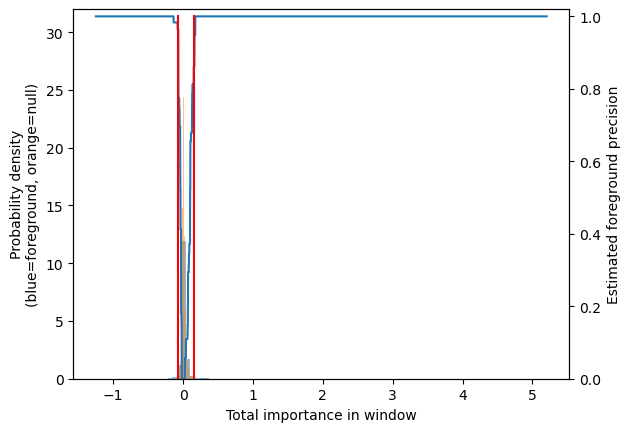

Got 171067 coords
After resolving overlaps, got 171067 seqlets
Across all tasks, the weakest transformed threshold used was: 0.9134091806789341
MEMORY 6.346391552
171067 identified in total
min_metacluster_size_frac * len(seqlets) = 1710 is more than min_metacluster_size=100.
Using it as a new min_metacluster_size
2 activity patterns with support >= 1710 out of 2 possible patterns
Metacluster sizes:  [105535, 65532]
Idx to activities:  {0: '-1', 1: '1'}
MEMORY 6.356107264
On metacluster 1
Metacluster size 65532 limited to 20000
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 20000
(Round 1) Computing coarse affmat
MEMORY 6.921240576
Beginning embedding computation
MEMORY 6.921240576
Computing embeddings


2022-12-05 17:11:50.259739: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Finished embedding computation in 4.08 s
MEMORY 7.048036352
Starting affinity matrix computations
MEMORY 7.048036352
Batching in slices of size 3355


100%|██████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:28<00:00,  4.75s/it]

Finished affinity matrix computations in 28.57 s
MEMORY 8.22550528


(Round 1) Computed coarse affmat
MEMORY 8.225521664
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 8.225521664
Launching nearest neighbors affmat calculation job
MEMORY 8.225128448
Parallel runs completed
MEMORY 7.939801088
Job completed in: 57.37 s
MEMORY 7.939702784
Launching nearest neighbors affmat calculation job
MEMORY 7.94001408
Parallel runs completed
MEMORY 7.978860544
Job completed in: 55.6 s
MEMORY 7.97876224
(Round 1) Computed affinity matrix on nearest neighbors in 115.8 s
MEMORY 7.97679616
Filtered down to 13320 of 20000
(Round 1) Retained 13320 rows out of 20000 after filtering
MEMORY 7.977091072
(Round 1) Computing density adapted affmat
MEMORY 7.97106176
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 6.769475584
Beginning preprocessing + Leiden
Affmat shape: 13320


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   48.9s


Quality: 0.6380458589862836
Quality: 0.6380560837540984
Quality: 0.6381181974836933
Got 9 clusters after round 1
Counts:
{8: 237, 1: 2363, 7: 538, 2: 2139, 0: 2693, 6: 872, 4: 1341, 5: 1066, 3: 2071}
MEMORY 0.271663104
(Round 1) Aggregating seqlets in each cluster
MEMORY 0.271712256
Aggregating for cluster 0 with 2693 seqlets
MEMORY 0.347357184
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 3 seqlets that went over the sequence edge during flank expansion


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:  1.2min finished


Skipped 282 seqlets that went over sequence edge during flank expansion
Skipped 87 due to duplicates
Trimming eliminated 0 seqlets out of 2320
Skipped 76 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 2363 seqlets
MEMORY 2.501738496
Skipped 3 seqlets that went over the sequence edge during flank expansion
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 136 seqlets that went over sequence edge during flank expansion
Skipped 24 due to duplicates
Trimming eliminated 0 seqlets out of 2199
Skipped 25 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 2139 seqlets
MEMORY 2.587951104
Skipped 79 seqlets that went over sequence edge during flank expansion
Skipped 12 due to duplicates
Trimming eliminated 0 seqlets out of 2048
Skipped 31 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 2071 seqlets
MEMORY 2.655076352
Skipped 99

100%|██████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:10<00:00,  3.35s/it]

Finished affinity matrix computations in 10.1 s
MEMORY 5.147754496


(Round 2) Computed coarse affmat
MEMORY 5.147754496
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 5.147754496
Launching nearest neighbors affmat calculation job
MEMORY 5.207949312
Parallel runs completed
MEMORY 3.494805504
Job completed in: 32.16 s
MEMORY 3.494674432
Launching nearest neighbors affmat calculation job
MEMORY 3.49495296
Parallel runs completed
MEMORY 3.596648448
Job completed in: 32.07 s
MEMORY 3.59661568
(Round 2) Computed affinity matrix on nearest neighbors in 66.5 s
MEMORY 3.76963072
Not applying filtering for rounds above first round
MEMORY 3.76963072
(Round 2) Computing density adapted affmat
MEMORY 4.162781184
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 5.774229504
Beginning preprocessing + Leiden
Affmat shape: 12087


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   56.4s


Quality: 0.6071919299736065
Quality: 0.6071935655901147
Quality: 0.6071971335311305
Got 7 clusters after round 2
Counts:
{0: 2827, 2: 2355, 1: 2452, 5: 1025, 3: 1902, 6: 497, 4: 1029}
MEMORY 0.232472576
(Round 2) Aggregating seqlets in each cluster
MEMORY 0.232505344
Aggregating for cluster 0 with 2827 seqlets
MEMORY 0.258850816


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:  1.4min finished


Skipped 59 due to duplicates
Trimming eliminated 0 seqlets out of 2768
Skipped 6 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 2452 seqlets
MEMORY 0.467861504
Skipped 25 due to duplicates
Trimming eliminated 0 seqlets out of 2427
Skipped 10 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 2355 seqlets
MEMORY 0.610156544
Skipped 34 due to duplicates
Trimming eliminated 0 seqlets out of 2321
Skipped 9 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 1902 seqlets
MEMORY 0.680984576
Removed 1 duplicate seqlets
Skipped 14 due to duplicates
Trimming eliminated 0 seqlets out of 1887
Skipped 10 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 4 with 1029 seqlets
MEMORY 0.725827584
Skipped 4 seqlets that went over the sequence edge during flank expansion
Skipped 6 due to duplicates
Trimming eliminated 0 seqlets out of

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 2620 tasks      | elapsed:    1.5s
[Parallel(n_jobs=10)]: Done 2762 out of 2762 | elapsed:    1.6s finished


[t-SNE] Computed conditional probabilities for sample 1000 / 2762
[t-SNE] Computed conditional probabilities for sample 2000 / 2762
[t-SNE] Computed conditional probabilities for sample 2762 / 2762
[t-SNE] Mean sigma: 0.406663
Beginning preprocessing + Leiden
Affmat shape: 2762


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    2.0s


Quality: 0.8396493123791412
Quality: 0.8399220997675995
Quality: 0.8401406472195546
Quality: 0.8401794620945316
Quality: 0.8402834624483314
Quality: 0.8405348269855318
Quality: 0.8405647026397491
Quality: 0.8406085099231974
Got subclusters: Counter({0: 192, 1: 162, 2: 112, 3: 92, 4: 90, 5: 87, 6: 84, 7: 74, 8: 72, 9: 70, 10: 69, 11: 68, 12: 67, 13: 62, 14: 60, 15: 59, 18: 57, 17: 57, 16: 57, 19: 56, 20: 55, 21: 54, 22: 53, 23: 51, 24: 50, 25: 49, 26: 49, 27: 47, 28: 45, 29: 43, 30: 39, 31: 39, 32: 37, 35: 33, 33: 33, 34: 33, 36: 32, 37: 30, 38: 26, 39: 24, 40: 23, 41: 21, 43: 21, 42: 21, 46: 20, 45: 20, 44: 20, 47: 19, 48: 18, 49: 18, 50: 15, 51: 14, 52: 14, 53: 12, 54: 12, 55: 10, 56: 8, 57: 7})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    3.3s finished


Numbers for each pattern pre-subsample: [192, 162, 112, 92, 90, 87, 84, 74, 72, 70, 69, 68, 67, 62, 60, 59, 57, 57, 57, 56, 55, 54, 53, 51, 50, 49, 49, 47, 45, 43, 39, 39, 37, 33, 33, 33, 32, 30, 26, 24, 23, 21, 21, 21, 20, 20, 20, 19, 18, 18, 15, 14, 14, 12, 12, 10, 8, 7]
Numbers after subsampling: [192, 162, 112, 92, 90, 87, 84, 74, 72, 70, 69, 68, 67, 62, 60, 59, 57, 57, 57, 56, 55, 54, 53, 51, 50, 49, 49, 47, 45, 43, 39, 39, 37, 33, 33, 33, 32, 30, 26, 24, 23, 21, 21, 21, 20, 20, 20, 19, 18, 18, 15, 14, 14, 12, 12, 10, 8, 7]
Computing sims for pattern 0
Computed sims for pattern 0 in 6.11760687828064 s
Computing sims for pattern 1
Computed sims for pattern 1 in 3.400219202041626 s
Computing sims for pattern 2
Computed sims for pattern 2 in 2.1958091259002686 s
Computing sims for pattern 3
Computed sims for pattern 3 in 2.1874938011169434 s
Computing sims for pattern 4
Computed sims for pattern 4 in 2.190709114074707 s
Computing sims for pattern 5
Computed sims for pattern 5 in 2.05

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 2150 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 2417 out of 2417 | elapsed:    1.0s finished


[t-SNE] Computed conditional probabilities for sample 1000 / 2417
[t-SNE] Computed conditional probabilities for sample 2000 / 2417
[t-SNE] Computed conditional probabilities for sample 2417 / 2417
[t-SNE] Mean sigma: 0.375888
Beginning preprocessing + Leiden
Affmat shape: 2417


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    2.0s


Quality: 0.8539202264956611
Quality: 0.8539214314017657
Quality: 0.8539367912120729
Got subclusters: Counter({0: 232, 1: 179, 2: 169, 3: 143, 4: 116, 5: 114, 6: 88, 7: 75, 8: 70, 9: 66, 10: 61, 11: 59, 12: 58, 13: 55, 14: 52, 15: 50, 16: 49, 17: 48, 19: 46, 18: 46, 20: 44, 21: 41, 22: 38, 23: 36, 24: 35, 25: 34, 26: 32, 27: 30, 29: 29, 30: 29, 28: 29, 31: 27, 32: 22, 33: 21, 34: 19, 35: 18, 36: 18, 37: 17, 38: 17, 40: 16, 39: 16, 41: 15, 42: 15, 43: 12, 44: 8, 45: 7, 46: 7, 47: 5, 48: 4})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    3.3s finished


Numbers for each pattern pre-subsample: [232, 179, 169, 143, 116, 114, 88, 75, 70, 66, 61, 59, 58, 55, 52, 50, 49, 48, 46, 46, 44, 41, 38, 36, 35, 34, 32, 30, 29, 29, 29, 27, 22, 21, 19, 18, 18, 17, 17, 16, 16, 15, 15, 12, 8, 7, 7, 5, 4]
Numbers after subsampling: [232, 179, 169, 143, 116, 114, 88, 75, 70, 66, 61, 59, 58, 55, 52, 50, 49, 48, 46, 46, 44, 41, 38, 36, 35, 34, 32, 30, 29, 29, 29, 27, 22, 21, 19, 18, 18, 17, 17, 16, 16, 15, 15, 12, 8, 7, 7, 5, 4]
Computing sims for pattern 0
Computed sims for pattern 0 in 3.628621816635132 s
Computing sims for pattern 1
Computed sims for pattern 1 in 3.278956174850464 s
Computing sims for pattern 2
Computed sims for pattern 2 in 2.928879976272583 s
Computing sims for pattern 3
Computed sims for pattern 3 in 2.161288022994995 s
Computing sims for pattern 4
Computed sims for pattern 4 in 1.9644279479980469 s
Computing sims for pattern 5
Computed sims for pattern 5 in 1.9087507724761963 s
Computing sims for pattern 6
Computed sims for pattern 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 2100 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 2312 out of 2312 | elapsed:    1.0s finished


[t-SNE] Computed conditional probabilities for sample 1000 / 2312
[t-SNE] Computed conditional probabilities for sample 2000 / 2312
[t-SNE] Computed conditional probabilities for sample 2312 / 2312
[t-SNE] Mean sigma: 0.351722
Beginning preprocessing + Leiden
Affmat shape: 2312


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.9s


Quality: 0.8273170583805717
Got subclusters: Counter({0: 178, 1: 163, 2: 158, 3: 140, 4: 133, 5: 127, 6: 97, 7: 85, 8: 70, 9: 69, 10: 67, 11: 66, 12: 61, 13: 56, 14: 56, 16: 48, 15: 48, 17: 43, 18: 42, 19: 42, 20: 40, 21: 39, 22: 38, 23: 35, 24: 31, 25: 30, 26: 30, 27: 29, 28: 27, 29: 26, 30: 21, 31: 20, 32: 20, 34: 19, 33: 19, 37: 17, 36: 17, 35: 17, 39: 13, 38: 13, 40: 12, 41: 11, 42: 11, 43: 10, 44: 9, 45: 5, 46: 4})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    3.1s finished


Numbers for each pattern pre-subsample: [178, 163, 158, 140, 133, 127, 97, 85, 70, 69, 67, 66, 61, 56, 56, 48, 48, 43, 42, 42, 40, 39, 38, 35, 31, 30, 30, 29, 27, 26, 21, 20, 20, 19, 19, 17, 17, 17, 13, 13, 12, 11, 11, 10, 9, 5, 4]
Numbers after subsampling: [178, 163, 158, 140, 133, 127, 97, 85, 70, 69, 67, 66, 61, 56, 56, 48, 48, 43, 42, 42, 40, 39, 38, 35, 31, 30, 30, 29, 27, 26, 21, 20, 20, 19, 19, 17, 17, 17, 13, 13, 12, 11, 11, 10, 9, 5, 4]
Computing sims for pattern 0
Computed sims for pattern 0 in 3.0936169624328613 s
Computing sims for pattern 1
Computed sims for pattern 1 in 2.600764036178589 s
Computing sims for pattern 2
Computed sims for pattern 2 in 2.473276138305664 s
Computing sims for pattern 3
Computed sims for pattern 3 in 2.0180978775024414 s
Computing sims for pattern 4
Computed sims for pattern 4 in 2.309164047241211 s
Computing sims for pattern 5
Computed sims for pattern 5 in 2.1534249782562256 s
Computing sims for pattern 6
Computed sims for pattern 6 in 1.9027

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1620 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done 1877 out of 1877 | elapsed:    0.6s finished


[t-SNE] Computed conditional probabilities for sample 1000 / 1877
[t-SNE] Computed conditional probabilities for sample 1877 / 1877
[t-SNE] Mean sigma: 0.347551
Beginning preprocessing + Leiden
Affmat shape: 1877


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.8s


Quality: 0.844182319273145
Quality: 0.8443007364508844
Quality: 0.8443118903178367
Quality: 0.8444303706439481
Got subclusters: Counter({0: 141, 1: 137, 2: 132, 3: 113, 4: 97, 5: 82, 6: 79, 7: 63, 8: 62, 9: 55, 10: 54, 11: 52, 12: 50, 13: 48, 14: 43, 15: 41, 16: 38, 17: 37, 18: 36, 19: 35, 20: 35, 21: 35, 22: 33, 23: 32, 24: 29, 25: 26, 26: 26, 27: 25, 29: 20, 30: 20, 28: 20, 31: 18, 32: 18, 33: 17, 34: 15, 36: 13, 35: 13, 37: 12, 40: 11, 38: 11, 39: 11, 41: 11, 42: 10, 43: 9, 44: 7, 45: 5})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.9s finished


Numbers for each pattern pre-subsample: [141, 137, 132, 113, 97, 82, 79, 63, 62, 55, 54, 52, 50, 48, 43, 41, 38, 37, 36, 35, 35, 35, 33, 32, 29, 26, 26, 25, 20, 20, 20, 18, 18, 17, 15, 13, 13, 12, 11, 11, 11, 11, 10, 9, 7, 5]
Numbers after subsampling: [141, 137, 132, 113, 97, 82, 79, 63, 62, 55, 54, 52, 50, 48, 43, 41, 38, 37, 36, 35, 35, 35, 33, 32, 29, 26, 26, 25, 20, 20, 20, 18, 18, 17, 15, 13, 13, 12, 11, 11, 11, 11, 10, 9, 7, 5]
Computing sims for pattern 0
Computed sims for pattern 0 in 1.9802796840667725 s
Computing sims for pattern 1
Computed sims for pattern 1 in 2.3500771522521973 s
Computing sims for pattern 2
Computed sims for pattern 2 in 2.1937360763549805 s
Computing sims for pattern 3
Computed sims for pattern 3 in 1.7403578758239746 s
Computing sims for pattern 4
Computed sims for pattern 4 in 1.802649974822998 s
Computing sims for pattern 5
Computed sims for pattern 5 in 1.4826951026916504 s
Computing sims for pattern 6
Computed sims for pattern 6 in 1.32975125312805

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s


[t-SNE] Computed conditional probabilities for sample 1000 / 1019
[t-SNE] Computed conditional probabilities for sample 1019 / 1019
[t-SNE] Mean sigma: 0.349096
Beginning preprocessing + Leiden


[Parallel(n_jobs=10)]: Done 1019 out of 1019 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Affmat shape: 1019


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s


Quality: 0.8402438531641779
Quality: 0.8402892397343747
Quality: 0.8408256447358304
Quality: 0.8410526985343314
Got subclusters: Counter({0: 100, 1: 95, 2: 77, 3: 66, 4: 66, 5: 61, 6: 45, 7: 36, 9: 34, 8: 34, 10: 30, 12: 28, 11: 28, 13: 27, 14: 26, 15: 24, 16: 22, 17: 20, 18: 19, 19: 17, 20: 16, 21: 15, 23: 14, 22: 14, 26: 12, 25: 12, 24: 12, 29: 10, 27: 10, 28: 10, 30: 9, 31: 9, 32: 8, 33: 7, 34: 6})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.5s finished


Numbers for each pattern pre-subsample: [100, 95, 77, 66, 66, 61, 45, 36, 34, 34, 30, 28, 28, 27, 26, 24, 22, 20, 19, 17, 16, 15, 14, 14, 12, 12, 12, 10, 10, 10, 9, 9, 8, 7, 6]
Numbers after subsampling: [100, 95, 77, 66, 66, 61, 45, 36, 34, 34, 30, 28, 28, 27, 26, 24, 22, 20, 19, 17, 16, 15, 14, 14, 12, 12, 12, 10, 10, 10, 9, 9, 8, 7, 6]
Computing sims for pattern 0
Computed sims for pattern 0 in 1.054520845413208 s
Computing sims for pattern 1
Computed sims for pattern 1 in 1.289489984512329 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.9417271614074707 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.7614939212799072 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.7618470191955566 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.6745181083679199 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.560992956161499 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.538902759552002 s
Computing sims 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s


[t-SNE] Computed conditional probabilities for sample 1000 / 1013
[t-SNE] Computed conditional probabilities for sample 1013 / 1013
[t-SNE] Mean sigma: 0.422851
Beginning preprocessing + Leiden


[Parallel(n_jobs=10)]: Done 1013 out of 1013 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Affmat shape: 1013


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s


Quality: 0.8012020399670046
Quality: 0.8013834464043719
Quality: 0.8016105958722772
Quality: 0.8016451955753343
Quality: 0.80166013234832
Quality: 0.8018869425271208
Got subclusters: Counter({0: 68, 1: 58, 2: 52, 3: 51, 5: 51, 4: 51, 6: 50, 7: 39, 8: 37, 9: 34, 10: 31, 11: 31, 13: 30, 14: 30, 12: 30, 15: 28, 16: 27, 19: 25, 17: 25, 18: 25, 21: 24, 20: 24, 22: 23, 24: 22, 23: 22, 25: 20, 26: 19, 27: 16, 30: 14, 29: 14, 28: 14, 31: 9, 33: 7, 32: 7, 34: 5})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.5s finished


Numbers for each pattern pre-subsample: [68, 58, 52, 51, 51, 51, 50, 39, 37, 34, 31, 31, 30, 30, 30, 28, 27, 25, 25, 25, 24, 24, 23, 22, 22, 20, 19, 16, 14, 14, 14, 9, 7, 7, 5]
Numbers after subsampling: [68, 58, 52, 51, 51, 51, 50, 39, 37, 34, 31, 31, 30, 30, 30, 28, 27, 25, 25, 25, 24, 24, 23, 22, 22, 20, 19, 16, 14, 14, 14, 9, 7, 7, 5]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.7969601154327393 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.7420041561126709 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.6557407379150391 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.6510839462280273 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.640887975692749 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.6399800777435303 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.6221199035644531 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.5763671398162842 s
Computing si

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 493 out of 493 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Affmat shape: 493


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.8070550499184507
Quality: 0.8079356323552739
Got subclusters: Counter({0: 46, 1: 37, 2: 32, 3: 31, 4: 30, 5: 28, 6: 28, 7: 27, 8: 24, 9: 24, 10: 23, 11: 23, 12: 22, 13: 19, 14: 16, 15: 16, 16: 15, 17: 14, 19: 11, 18: 11, 20: 9, 21: 7})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished


Numbers for each pattern pre-subsample: [46, 37, 32, 31, 30, 28, 28, 27, 24, 24, 23, 23, 22, 19, 16, 16, 15, 14, 11, 11, 9, 7]
Numbers after subsampling: [46, 37, 32, 31, 30, 28, 28, 27, 24, 24, 23, 23, 22, 19, 16, 16, 15, 14, 11, 11, 9, 7]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.3478231430053711 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.351046085357666 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.28780198097229004 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.2786519527435303 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.26660895347595215 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.24859976768493652 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.2510030269622803 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.237015962600708 s
Computing sims for pattern 8
Computed sims for pattern 8 in 0.20916390419006348 s
Computing sims for pattern 9

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1380 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 1474 out of 1493 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=10)]: Done 1493 out of 1493 | elapsed:    0.6s finished
/Users/cawa/miniforge3/envs/tensorflow/lib/python3.9/site-packages/scikit_learn-1.1.3-py3.9-macosx-11.0-arm64.egg/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/cawa/miniforge3/envs/tensorflow/lib/python3.9/site-packages/scikit_learn-1.1.3-py3.9-macosx-11.0-arm64.egg/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/cawa/miniforge3/envs/tensorflow/lib/python3.9/site-packages/scikit_learn-1.1.3-py3.9-macosx-11.0-arm64.egg/sklearn/neighbors/_

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1493 samples in 0.002s...
[t-SNE] Computed neighbors for 1493 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1493
[t-SNE] Computed conditional probabilities for sample 1493 / 1493
[t-SNE] Mean sigma: 0.601447
[t-SNE] Computed conditional probabilities in 0.007s
[t-SNE] Iteration 50: error = 87.4743652, gradient norm = 0.1044280 (50 iterations in 0.277s)
[t-SNE] Iteration 100: error = 83.7821960, gradient norm = 0.0692460 (50 iterations in 0.186s)
[t-SNE] Iteration 150: error = 83.6905823, gradient norm = 0.0572408 (50 iterations in 0.238s)
[t-SNE] Iteration 200: error = 83.5138702, gradient norm = 0.0811326 (50 iterations in 0.229s)
[t-SNE] Iteration 250: error = 83.5088806, gradient norm = 0.0692298 (50 iterations in 0.208s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.508881
[t-SNE] Iteration 300: error = 1.2491691, gradient norm = 0.0017261 (50 iterations in 0.182s)

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.7s


Quality: 0.803930929342278
Quality: 0.803964147755915
Quality: 0.8044665236511719
Quality: 0.8044699254000748
Quality: 0.8044770951166016
Quality: 0.8045210781917443


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s


Got subclusters: Counter({0: 121, 1: 87, 2: 81, 3: 65, 4: 65, 5: 60, 6: 58, 7: 50, 8: 45, 9: 44, 10: 42, 11: 40, 12: 39, 13: 39, 14: 38, 15: 37, 17: 37, 16: 37, 18: 36, 19: 35, 20: 34, 21: 34, 22: 33, 23: 33, 24: 31, 25: 30, 26: 28, 27: 27, 28: 26, 29: 25, 30: 24, 31: 22, 32: 19, 34: 17, 33: 17, 35: 15, 36: 14, 37: 8})
On pattern 1


[Parallel(n_jobs=10)]: Done 700 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 736 out of 736 | elapsed:    0.2s finished


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 736 samples in 0.001s...
[t-SNE] Computed neighbors for 736 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 736 / 736
[t-SNE] Mean sigma: 0.433590
[t-SNE] Computed conditional probabilities in 0.003s
[t-SNE] Iteration 50: error = 79.9436874, gradient norm = 0.4528222 (50 iterations in 0.136s)
[t-SNE] Iteration 100: error = 78.4035797, gradient norm = 0.4562311 (50 iterations in 0.122s)
[t-SNE] Iteration 150: error = 78.2497635, gradient norm = 0.4547549 (50 iterations in 0.152s)
[t-SNE] Iteration 200: error = 77.7226181, gradient norm = 0.4654791 (50 iterations in 0.117s)
[t-SNE] Iteration 250: error = 77.4998856, gradient norm = 0.4670298 (50 iterations in 0.147s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.499886
[t-SNE] Iteration 300: error = 0.9228767, gradient norm = 0.0018561 (50 iterations in 0.145s)
[t-SNE] Iteration 350: error = 0.7570957, gradient norm = 0.0007238 (

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s


Quality: 0.7783272194889764
Quality: 0.7783347758672298
Quality: 0.7788549848201262
Quality: 0.7791222349686034


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.4s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s


Got subclusters: Counter({0: 75, 1: 54, 2: 50, 3: 46, 4: 42, 5: 38, 6: 35, 7: 33, 8: 32, 9: 31, 11: 31, 10: 31, 12: 26, 13: 25, 15: 25, 14: 25, 16: 23, 17: 20, 19: 18, 18: 18, 20: 17, 21: 16, 22: 10, 23: 8, 24: 7})
On pattern 2
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 696 samples in 0.001s...
[t-SNE] Computed neighbors for 696 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 696 / 696
[t-SNE] Mean sigma: 0.414869
[t-SNE] Computed conditional probabilities in 0.003s


[Parallel(n_jobs=10)]: Done 696 out of 696 | elapsed:    0.2s finished


[t-SNE] Iteration 50: error = 80.2745972, gradient norm = 0.4766839 (50 iterations in 0.174s)
[t-SNE] Iteration 100: error = 79.0235062, gradient norm = 0.4620934 (50 iterations in 0.118s)
[t-SNE] Iteration 150: error = 78.0339279, gradient norm = 0.4750140 (50 iterations in 0.145s)
[t-SNE] Iteration 200: error = 78.0265045, gradient norm = 0.4632773 (50 iterations in 0.134s)
[t-SNE] Iteration 250: error = 77.9488525, gradient norm = 0.4611192 (50 iterations in 0.136s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.948853
[t-SNE] Iteration 300: error = 0.8688049, gradient norm = 0.0026293 (50 iterations in 0.149s)
[t-SNE] Iteration 350: error = 0.7021078, gradient norm = 0.0007349 (50 iterations in 0.118s)
[t-SNE] Iteration 400: error = 0.6594765, gradient norm = 0.0005161 (50 iterations in 0.118s)
[t-SNE] Iteration 450: error = 0.6427934, gradient norm = 0.0002978 (50 iterations in 0.131s)
[t-SNE] Iteration 500: error = 0.6341822, gradient norm = 0.0002394 (50 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s


Quality: 0.7726356925185441
Quality: 0.7729766889245803
Quality: 0.7731109965328412
Quality: 0.7731995032637726


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.4s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 683 out of 683 | elapsed:    0.2s finished


Got subclusters: Counter({0: 73, 1: 52, 3: 48, 2: 48, 5: 45, 4: 45, 6: 41, 7: 39, 8: 37, 9: 34, 10: 32, 11: 23, 12: 23, 13: 21, 15: 19, 16: 19, 14: 19, 17: 18, 19: 15, 18: 15, 20: 11, 21: 10, 22: 6, 23: 3})
On pattern 3
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 683 samples in 0.001s...
[t-SNE] Computed neighbors for 683 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 683 / 683
[t-SNE] Mean sigma: 0.368565
[t-SNE] Computed conditional probabilities in 0.003s
[t-SNE] Iteration 50: error = 79.8065414, gradient norm = 0.4537826 (50 iterations in 0.151s)
[t-SNE] Iteration 100: error = 78.0909882, gradient norm = 0.4769644 (50 iterations in 0.159s)
[t-SNE] Iteration 150: error = 77.0098419, gradient norm = 0.4782501 (50 iterations in 0.145s)
[t-SNE] Iteration 200: error = 77.6002121, gradient norm = 0.4773963 (50 iterations in 0.136s)
[t-SNE] Iteration 250: error = 77.5364990, gradient norm = 0.4809961 (50 iterations in 0.128s)
[t-SNE] KL divergence

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s


Quality: 0.7799804126316445


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.4s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 515 out of 515 | elapsed:    0.1s finished


Got subclusters: Counter({0: 71, 1: 49, 2: 46, 3: 37, 4: 35, 5: 34, 6: 30, 7: 29, 8: 29, 9: 24, 10: 23, 11: 22, 12: 21, 13: 19, 14: 19, 15: 19, 16: 18, 17: 18, 18: 17, 19: 17, 20: 13, 21: 12, 23: 12, 22: 12, 24: 11, 25: 10, 26: 9, 27: 7, 28: 6, 29: 6, 30: 5, 31: 3})
On pattern 4
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 515 samples in 0.001s...
[t-SNE] Computed neighbors for 515 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 515 / 515
[t-SNE] Mean sigma: 0.438845
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 80.9973297, gradient norm = 0.4692332 (50 iterations in 0.123s)
[t-SNE] Iteration 100: error = 80.2540359, gradient norm = 0.4867781 (50 iterations in 0.135s)
[t-SNE] Iteration 150: error = 79.0134506, gradient norm = 0.5060317 (50 iterations in 0.102s)
[t-SNE] Iteration 200: error = 79.6069946, gradient norm = 0.4990435 (50 iterations in 0.089s)
[t-SNE] Iteration 250: error = 80.9573593, gradient norm

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.7388677617872198
Quality: 0.738979575143372
Quality: 0.7391384324720351
Quality: 0.7392188783872865


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 507 out of 507 | elapsed:    0.1s finished


Got subclusters: Counter({0: 55, 1: 48, 2: 44, 3: 32, 4: 31, 5: 29, 6: 28, 7: 28, 8: 26, 9: 23, 10: 19, 11: 19, 12: 18, 13: 18, 15: 16, 14: 16, 16: 13, 17: 12, 18: 11, 19: 10, 20: 8, 21: 7, 22: 4})
On pattern 5
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 507 samples in 0.001s...
[t-SNE] Computed neighbors for 507 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 507 / 507
[t-SNE] Mean sigma: 0.593133
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 82.1984406, gradient norm = 0.4995678 (50 iterations in 0.119s)
[t-SNE] Iteration 100: error = 83.7330551, gradient norm = 0.4844729 (50 iterations in 0.104s)
[t-SNE] Iteration 150: error = 82.1564331, gradient norm = 0.4761994 (50 iterations in 0.119s)
[t-SNE] Iteration 200: error = 81.8455505, gradient norm = 0.4827949 (50 iterations in 0.136s)
[t-SNE] Iteration 250: error = 80.8560867, gradient norm = 0.5094575 (50 iterations in 0.112s)
[t-SNE] KL divergence after 25

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6819613654924546
Quality: 0.6820971992920906
Quality: 0.6821200567873377
Quality: 0.6821679794231622


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 485 out of 485 | elapsed:    0.1s finished


Got subclusters: Counter({0: 49, 1: 48, 2: 44, 3: 38, 4: 37, 7: 31, 6: 31, 5: 31, 8: 25, 9: 24, 10: 24, 11: 20, 12: 20, 13: 18, 14: 17, 15: 10, 16: 6, 17: 6, 18: 6, 19: 5, 20: 5, 22: 4, 23: 4, 21: 4})
On pattern 6
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 485 samples in 0.001s...
[t-SNE] Computed neighbors for 485 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 485 / 485
[t-SNE] Mean sigma: 0.476534
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 80.1247711, gradient norm = 0.5010875 (50 iterations in 0.111s)
[t-SNE] Iteration 100: error = 78.5045319, gradient norm = 0.4936021 (50 iterations in 0.108s)
[t-SNE] Iteration 150: error = 79.6147614, gradient norm = 0.4797017 (50 iterations in 0.140s)
[t-SNE] Iteration 200: error = 79.8043060, gradient norm = 0.4715748 (50 iterations in 0.094s)
[t-SNE] Iteration 250: error = 78.7827759, gradient norm = 0.4780436 (50 iterations in 0.099s)
[t-SNE] KL divergence after

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.7474632724054459
Quality: 0.7478784917687549
Quality: 0.7483301311408173
Quality: 0.7485079306606284


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 400 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 434 out of 434 | elapsed:    0.1s finished


Got subclusters: Counter({0: 50, 1: 45, 2: 32, 3: 31, 4: 30, 5: 29, 6: 27, 7: 27, 8: 23, 9: 23, 10: 20, 12: 17, 11: 17, 13: 15, 15: 14, 14: 14, 16: 12, 17: 12, 18: 11, 19: 9, 20: 9, 22: 9, 21: 9})
On pattern 7
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 434 samples in 0.000s...
[t-SNE] Computed neighbors for 434 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 434 / 434
[t-SNE] Mean sigma: 0.555445
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 80.1658783, gradient norm = 0.4963104 (50 iterations in 0.105s)
[t-SNE] Iteration 100: error = 77.8222504, gradient norm = 0.5123109 (50 iterations in 0.116s)
[t-SNE] Iteration 150: error = 78.3683777, gradient norm = 0.4972224 (50 iterations in 0.116s)
[t-SNE] Iteration 200: error = 77.9815445, gradient norm = 0.4984725 (50 iterations in 0.110s)
[t-SNE] Iteration 250: error = 77.8286896, gradient norm = 0.4940411 (50 iterations in 0.106s)
[t-SNE] KL divergence after 250

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.7596152611503895
Quality: 0.7602216406738783


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 400 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 423 out of 423 | elapsed:    0.1s finished


Got subclusters: Counter({0: 46, 1: 38, 2: 35, 4: 29, 3: 29, 5: 27, 6: 25, 7: 24, 8: 21, 9: 19, 10: 16, 11: 16, 12: 16, 13: 13, 15: 12, 14: 12, 16: 11, 18: 10, 17: 10, 19: 7, 20: 6, 21: 5, 22: 5, 23: 2})
On pattern 8
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 423 samples in 0.000s...
[t-SNE] Computed neighbors for 423 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 423 / 423
[t-SNE] Mean sigma: 0.311008
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 77.9465256, gradient norm = 0.4742481 (50 iterations in 0.108s)
[t-SNE] Iteration 100: error = 74.8010712, gradient norm = 0.4972228 (50 iterations in 0.094s)
[t-SNE] Iteration 150: error = 74.2231674, gradient norm = 0.4903562 (50 iterations in 0.102s)
[t-SNE] Iteration 200: error = 73.2378159, gradient norm = 0.4925651 (50 iterations in 0.116s)
[t-SNE] Iteration 250: error = 72.4716873, gradient norm = 0.4905034 (50 iterations in 0.093s)
[t-SNE] KL divergence af

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.7971359273662252
Quality: 0.7973219047686614
Quality: 0.7977388629404407
Quality: 0.7978938440365814


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 414 out of 414 | elapsed:    0.1s finished


Got subclusters: Counter({0: 45, 1: 40, 2: 29, 3: 29, 4: 25, 6: 24, 5: 24, 9: 22, 7: 22, 8: 22, 10: 19, 11: 18, 12: 15, 13: 13, 14: 13, 15: 12, 17: 11, 16: 11, 18: 11, 19: 10, 21: 4, 20: 4})
On pattern 9
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 414 samples in 0.000s...
[t-SNE] Computed neighbors for 414 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 414 / 414
[t-SNE] Mean sigma: 0.194290
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 73.9334488, gradient norm = 0.5188540 (50 iterations in 0.107s)
[t-SNE] Iteration 100: error = 70.2414703, gradient norm = 0.5118729 (50 iterations in 0.098s)
[t-SNE] Iteration 150: error = 68.8554153, gradient norm = 0.5030591 (50 iterations in 0.092s)
[t-SNE] Iteration 200: error = 70.0125809, gradient norm = 0.4950935 (50 iterations in 0.094s)
[t-SNE] Iteration 250: error = 69.6922684, gradient norm = 0.4972960 (50 iterations in 0.113s)
[t-SNE] KL divergence after 250 itera

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.8104209289381434
Quality: 0.8111347878324888
Quality: 0.8112779906791662
Quality: 0.8113400787045744


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 232 out of 232 | elapsed:    0.0s finished


Got subclusters: Counter({0: 57, 1: 41, 2: 38, 4: 36, 3: 36, 5: 24, 6: 19, 7: 18, 8: 17, 9: 16, 10: 16, 11: 13, 12: 11, 14: 10, 13: 10, 15: 9, 18: 7, 17: 7, 16: 7, 20: 5, 19: 5, 21: 5, 22: 4, 23: 3})
On pattern 10
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 232 samples in 0.000s...
[t-SNE] Computed neighbors for 232 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 232 / 232
[t-SNE] Mean sigma: 0.701439
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 77.1804276, gradient norm = 0.5014770 (50 iterations in 0.090s)
[t-SNE] Iteration 100: error = 76.1597977, gradient norm = 0.5073012 (50 iterations in 0.091s)
[t-SNE] Iteration 150: error = 76.7256775, gradient norm = 0.4520230 (50 iterations in 0.078s)
[t-SNE] Iteration 200: error = 75.2432251, gradient norm = 0.5099841 (50 iterations in 0.081s)
[t-SNE] Iteration 250: error = 75.9578629, gradient norm = 0.4717872 (50 iterations in 0.071s)
[t-SNE] KL divergence after

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6618909126771512
Quality: 0.6620475880657956


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 182 out of 182 | elapsed:    0.0s finished


Got subclusters: Counter({0: 27, 1: 26, 2: 26, 3: 24, 4: 20, 5: 19, 6: 14, 7: 13, 8: 11, 9: 10, 10: 8, 14: 6, 12: 6, 13: 6, 11: 6, 15: 4, 17: 3, 16: 3})
On pattern 11
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 182 samples in 0.000s...
[t-SNE] Computed neighbors for 182 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 182 / 182
[t-SNE] Mean sigma: 0.331729
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 69.6760559, gradient norm = 0.4583668 (50 iterations in 0.080s)
[t-SNE] Iteration 100: error = 69.2581253, gradient norm = 0.4280870 (50 iterations in 0.081s)
[t-SNE] Iteration 150: error = 64.3769836, gradient norm = 0.5020432 (50 iterations in 0.093s)
[t-SNE] Iteration 200: error = 65.7549896, gradient norm = 0.4614928 (50 iterations in 0.076s)
[t-SNE] Iteration 250: error = 63.5973396, gradient norm = 0.5144168 (50 iterations in 0.074s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.597

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.7653599802663655


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 179 out of 179 | elapsed:    0.1s finished


Got subclusters: Counter({0: 35, 1: 31, 2: 19, 3: 14, 4: 13, 5: 12, 6: 12, 7: 9, 8: 8, 10: 7, 9: 7, 11: 6, 12: 5, 13: 4})
On pattern 12
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 179 samples in 0.000s...
[t-SNE] Computed neighbors for 179 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 179 / 179
[t-SNE] Mean sigma: 0.632337
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 75.0709152, gradient norm = 0.4561657 (50 iterations in 0.086s)
[t-SNE] Iteration 100: error = 75.4781494, gradient norm = 0.4309590 (50 iterations in 0.087s)
[t-SNE] Iteration 150: error = 75.9827042, gradient norm = 0.4465305 (50 iterations in 0.071s)
[t-SNE] Iteration 200: error = 74.7891769, gradient norm = 0.4612067 (50 iterations in 0.071s)
[t-SNE] Iteration 250: error = 75.8271790, gradient norm = 0.4269500 (50 iterations in 0.086s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.827179
[t-SNE] Iteration 300: erro

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.661341356172787


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 122 out of 122 | elapsed:    0.0s finished


Got subclusters: Counter({1: 18, 0: 18, 2: 14, 4: 13, 6: 13, 3: 13, 5: 13, 9: 12, 7: 12, 8: 12, 10: 9, 11: 9, 12: 7, 13: 5, 14: 5, 15: 4, 16: 2})
On pattern 13
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 122 samples in 0.000s...
[t-SNE] Computed neighbors for 122 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 122 / 122
[t-SNE] Mean sigma: 0.286964
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 66.2074127, gradient norm = 0.4527716 (50 iterations in 0.105s)
[t-SNE] Iteration 100: error = 64.0097275, gradient norm = 0.4432721 (50 iterations in 0.073s)
[t-SNE] Iteration 150: error = 62.5106125, gradient norm = 0.4879238 (50 iterations in 0.067s)
[t-SNE] Iteration 200: error = 63.6819115, gradient norm = 0.4403820 (50 iterations in 0.059s)
[t-SNE] Iteration 250: error = 63.4602737, gradient norm = 0.5028979 (50 iterations in 0.065s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.460274
[t-

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.7222781826534418
Quality: 0.7226462760042023


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 112 out of 112 | elapsed:    0.0s finished


Got subclusters: Counter({0: 24, 1: 21, 2: 13, 3: 12, 4: 9, 5: 8, 6: 7, 7: 7, 8: 6, 9: 5, 10: 4, 11: 3, 12: 3})
On pattern 14
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 112 samples in 0.000s...
[t-SNE] Computed neighbors for 112 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 112 / 112
[t-SNE] Mean sigma: 0.693403
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 71.7366791, gradient norm = 0.4366097 (50 iterations in 0.082s)
[t-SNE] Iteration 100: error = 72.9457397, gradient norm = 0.4433536 (50 iterations in 0.061s)
[t-SNE] Iteration 150: error = 71.1539001, gradient norm = 0.3779522 (50 iterations in 0.088s)
[t-SNE] Iteration 200: error = 70.0022812, gradient norm = 0.4235668 (50 iterations in 0.064s)
[t-SNE] Iteration 250: error = 72.4544296, gradient norm = 0.4666168 (50 iterations in 0.069s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.454430
[t-SNE] Iteration 300: error = 1.8269

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6409545084255134


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.4s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  96 out of  96 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 2: 10, 1: 10, 3: 9, 4: 9, 5: 8, 6: 8, 7: 7, 9: 7, 8: 7, 10: 6, 11: 5, 12: 4, 13: 4, 14: 3, 15: 3})
On pattern 15
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 96 samples in 0.000s...
[t-SNE] Computed neighbors for 96 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 96 / 96
[t-SNE] Mean sigma: 0.366221
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 66.8143005, gradient norm = 0.4258788 (50 iterations in 0.081s)
[t-SNE] Iteration 100: error = 71.5313416, gradient norm = 0.4176288 (50 iterations in 0.067s)
[t-SNE] Iteration 150: error = 66.8252029, gradient norm = 0.4571530 (50 iterations in 0.072s)
[t-SNE] Iteration 200: error = 64.5930862, gradient norm = 0.4510541 (50 iterations in 0.069s)
[t-SNE] Iteration 250: error = 66.8281555, gradient norm = 0.4481194 (50 iterations in 0.079s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.828156
[t-SNE] Iteration 300

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6803063601622011
Quality: 0.6803063601622013


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  92 out of  92 | elapsed:    0.0s finished


Got subclusters: Counter({0: 19, 1: 12, 2: 10, 3: 10, 5: 8, 4: 8, 6: 6, 7: 6, 8: 4, 9: 4, 10: 3, 11: 3, 12: 3})
On pattern 16
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 92 samples in 0.000s...
[t-SNE] Computed neighbors for 92 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 92 / 92
[t-SNE] Mean sigma: 0.624206
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 66.3610611, gradient norm = 0.4272797 (50 iterations in 0.076s)
[t-SNE] Iteration 100: error = 66.5247345, gradient norm = 0.4342731 (50 iterations in 0.063s)
[t-SNE] Iteration 150: error = 64.7902374, gradient norm = 0.4969345 (50 iterations in 0.068s)
[t-SNE] Iteration 200: error = 66.5915451, gradient norm = 0.3980315 (50 iterations in 0.106s)
[t-SNE] Iteration 250: error = 63.5980225, gradient norm = 0.4522530 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.598022
[t-SNE] Iteration 300: error = 1.5637050,

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6674749265757359
Quality: 0.668458194764136
Quality: 0.6713973874920062


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  82 out of  82 | elapsed:    0.0s finished


Got subclusters: Counter({0: 16, 1: 12, 2: 12, 3: 10, 4: 8, 6: 6, 5: 6, 8: 4, 7: 4, 9: 4, 11: 3, 10: 3, 12: 2, 13: 2})
On pattern 17
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 82 samples in 0.000s...
[t-SNE] Computed neighbors for 82 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 82 / 82
[t-SNE] Mean sigma: 0.817670
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 70.1374969, gradient norm = 0.4522997 (50 iterations in 0.068s)
[t-SNE] Iteration 100: error = 70.6365891, gradient norm = 0.4146309 (50 iterations in 0.063s)
[t-SNE] Iteration 150: error = 71.3977051, gradient norm = 0.5265278 (50 iterations in 0.073s)
[t-SNE] Iteration 200: error = 68.1401062, gradient norm = 0.4322071 (50 iterations in 0.061s)
[t-SNE] Iteration 250: error = 69.1601105, gradient norm = 0.4816411 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.160110
[t-SNE] Iteration 300: error = 1.7

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5506960674887105
Quality: 0.5509781287582912


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  56 out of  75 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  75 out of  75 | elapsed:    0.0s finished


Got subclusters: Counter({0: 18, 1: 13, 2: 11, 3: 9, 4: 8, 6: 7, 5: 7, 7: 4, 8: 3, 9: 2})
On pattern 18
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 75 samples in 0.000s...
[t-SNE] Computed neighbors for 75 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 75 / 75
[t-SNE] Mean sigma: 0.774834
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 67.5375443, gradient norm = 0.4851294 (50 iterations in 0.064s)
[t-SNE] Iteration 100: error = 62.9698715, gradient norm = 0.4725414 (50 iterations in 0.063s)
[t-SNE] Iteration 150: error = 65.4210358, gradient norm = 0.4995502 (50 iterations in 0.067s)
[t-SNE] Iteration 200: error = 66.4682693, gradient norm = 0.4457024 (50 iterations in 0.065s)
[t-SNE] Iteration 250: error = 65.9834290, gradient norm = 0.4115203 (50 iterations in 0.065s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.983429
[t-SNE] Iteration 300: error = 1.7813522, gradient norm = 0.004

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6696664710139144


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  74 out of  74 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 10, 2: 9, 3: 9, 4: 8, 5: 6, 6: 6, 7: 5, 8: 4, 9: 4, 10: 2})
On pattern 19
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 74 samples in 0.000s...
[t-SNE] Computed neighbors for 74 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 74 / 74
[t-SNE] Mean sigma: 0.305438
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 65.8122253, gradient norm = 0.4379537 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 60.6833878, gradient norm = 0.4381503 (50 iterations in 0.061s)
[t-SNE] Iteration 150: error = 63.0574417, gradient norm = 0.4835438 (50 iterations in 0.053s)
[t-SNE] Iteration 200: error = 66.6156540, gradient norm = 0.4289634 (50 iterations in 0.069s)
[t-SNE] Iteration 250: error = 64.0355377, gradient norm = 0.3962353 (50 iterations in 0.089s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.035538
[t-SNE] Iteration 300: error = 1.7225070, gradient norm =

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6816088713197455


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  72 out of  72 | elapsed:    0.0s finished


Got subclusters: Counter({1: 11, 0: 11, 2: 10, 3: 8, 4: 7, 5: 5, 6: 5, 8: 5, 7: 5, 9: 4, 10: 3})
On pattern 20
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 72 samples in 0.000s...
[t-SNE] Computed neighbors for 72 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 72 / 72
[t-SNE] Mean sigma: 0.751859
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 65.9143600, gradient norm = 0.4311186 (50 iterations in 0.062s)
[t-SNE] Iteration 100: error = 70.4906387, gradient norm = 0.3464030 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 67.1967926, gradient norm = 0.3744352 (50 iterations in 0.059s)
[t-SNE] Iteration 200: error = 65.3993835, gradient norm = 0.4602776 (50 iterations in 0.062s)
[t-SNE] Iteration 250: error = 64.6158676, gradient norm = 0.4101968 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.615868
[t-SNE] Iteration 300: error = 1.9762690, gradient norm 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6544006691254939


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  50 out of  69 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  69 out of  69 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 10, 2: 9, 4: 8, 3: 8, 5: 7, 6: 4, 7: 4, 8: 4, 9: 3, 11: 2, 10: 2})
On pattern 21
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 69 samples in 0.000s...
[t-SNE] Computed neighbors for 69 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 69 / 69
[t-SNE] Mean sigma: 0.710802
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 65.0190811, gradient norm = 0.4280412 (50 iterations in 0.058s)
[t-SNE] Iteration 100: error = 63.6828079, gradient norm = 0.4588512 (50 iterations in 0.064s)
[t-SNE] Iteration 150: error = 60.2179909, gradient norm = 0.5691427 (50 iterations in 0.053s)
[t-SNE] Iteration 200: error = 66.5093307, gradient norm = 0.4349428 (50 iterations in 0.066s)
[t-SNE] Iteration 250: error = 66.1281052, gradient norm = 0.4130220 (50 iterations in 0.055s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.128105
[t-SNE] Iteration 300: error = 1.7696335, gradient

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6089040256722628


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  68 out of  68 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 12, 2: 9, 4: 7, 3: 7, 5: 7, 6: 5, 8: 4, 7: 4, 9: 2})
On pattern 22
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 68 samples in 0.000s...
[t-SNE] Computed neighbors for 68 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 68 / 68
[t-SNE] Mean sigma: 0.643131
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 67.0149078, gradient norm = 0.4745783 (50 iterations in 0.072s)
[t-SNE] Iteration 100: error = 64.7161865, gradient norm = 0.5569445 (50 iterations in 0.069s)
[t-SNE] Iteration 150: error = 69.7172852, gradient norm = 0.4679360 (50 iterations in 0.070s)
[t-SNE] Iteration 200: error = 66.5616531, gradient norm = 0.4562108 (50 iterations in 0.069s)
[t-SNE] Iteration 250: error = 67.1293869, gradient norm = 0.3900089 (50 iterations in 0.081s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.129387
[t-SNE] Iteration 300: error = 1.8490177, gradient norm = 0.0039

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6113396649295043
Quality: 0.6115671479460834


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  48 out of  67 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  67 out of  67 | elapsed:    0.0s finished


Got subclusters: Counter({0: 16, 1: 9, 3: 7, 2: 7, 4: 6, 5: 6, 7: 5, 6: 5, 8: 4, 9: 3})
On pattern 23
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 67 samples in 0.000s...
[t-SNE] Computed neighbors for 67 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 67 / 67
[t-SNE] Mean sigma: 0.727983
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.1068954, gradient norm = 0.5094711 (50 iterations in 0.075s)
[t-SNE] Iteration 100: error = 65.4786911, gradient norm = 0.3344076 (50 iterations in 0.061s)
[t-SNE] Iteration 150: error = 62.3031960, gradient norm = 0.4576030 (50 iterations in 0.068s)
[t-SNE] Iteration 200: error = 63.9065628, gradient norm = 0.4200438 (50 iterations in 0.068s)
[t-SNE] Iteration 250: error = 58.7224655, gradient norm = 0.4928567 (50 iterations in 0.055s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.722466
[t-SNE] Iteration 300: error = 1.4065973, gradient norm = 0.00620

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.677116676455419


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  48 out of  67 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  67 out of  67 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 10, 2: 9, 3: 9, 4: 8, 5: 6, 6: 5, 7: 4, 8: 3, 9: 2})
On pattern 24
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 67 samples in 0.000s...
[t-SNE] Computed neighbors for 67 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 67 / 67
[t-SNE] Mean sigma: 0.808866
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 66.6799927, gradient norm = 0.5426755 (50 iterations in 0.201s)
[t-SNE] Iteration 100: error = 69.5504608, gradient norm = 0.4168132 (50 iterations in 0.242s)
[t-SNE] Iteration 150: error = 66.1502151, gradient norm = 0.4024495 (50 iterations in 0.091s)
[t-SNE] Iteration 200: error = 69.0716629, gradient norm = 0.4469273 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 64.1411133, gradient norm = 0.5086023 (50 iterations in 0.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.141113
[t-SNE] Iteration 300: error = 2.0216107, gradient norm = 0.0037

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6393057069665709


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  42 out of  61 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  61 out of  61 | elapsed:    0.0s finished


Got subclusters: Counter({1: 11, 0: 11, 2: 9, 3: 9, 5: 6, 6: 6, 7: 6, 4: 6, 8: 3})
On pattern 25
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 61 samples in 0.000s...
[t-SNE] Computed neighbors for 61 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 61 / 61
[t-SNE] Mean sigma: 0.208312
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 62.0930138, gradient norm = 0.4577250 (50 iterations in 0.082s)
[t-SNE] Iteration 100: error = 65.6664124, gradient norm = 0.4079148 (50 iterations in 0.059s)
[t-SNE] Iteration 150: error = 64.8603897, gradient norm = 0.4046430 (50 iterations in 0.062s)
[t-SNE] Iteration 200: error = 63.3241730, gradient norm = 0.5127887 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 62.0124969, gradient norm = 0.4959822 (50 iterations in 0.063s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.012497
[t-SNE] Iteration 300: error = 1.7635486, gradient norm = 0.0041964 (5

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6301987275062109


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  42 out of  61 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  61 out of  61 | elapsed:    0.0s finished


Got subclusters: Counter({1: 12, 0: 12, 2: 10, 3: 8, 5: 5, 4: 5, 6: 3, 7: 2, 8: 2, 9: 2})
On pattern 26
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 61 samples in 0.000s...
[t-SNE] Computed neighbors for 61 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 61 / 61
[t-SNE] Mean sigma: 0.768463
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 68.0171890, gradient norm = 0.4196481 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 70.8671570, gradient norm = 0.3917933 (50 iterations in 0.085s)
[t-SNE] Iteration 150: error = 68.8921967, gradient norm = 0.3940024 (50 iterations in 0.061s)
[t-SNE] Iteration 200: error = 68.2245712, gradient norm = 0.5060029 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 68.5287170, gradient norm = 0.4021185 (50 iterations in 0.055s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.528717
[t-SNE] Iteration 300: error = 1.9548414, gradient norm = 0.002

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5089593703575295


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  42 out of  61 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  61 out of  61 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 10, 2: 8, 3: 8, 4: 5, 5: 5, 6: 5, 7: 4, 9: 2, 8: 2})
On pattern 27
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 61 samples in 0.000s...
[t-SNE] Computed neighbors for 61 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 61 / 61
[t-SNE] Mean sigma: 0.120572
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.0243378, gradient norm = 0.4634192 (50 iterations in 0.062s)
[t-SNE] Iteration 100: error = 60.0099678, gradient norm = 0.5527406 (50 iterations in 0.062s)
[t-SNE] Iteration 150: error = 64.0763397, gradient norm = 0.4284480 (50 iterations in 0.061s)
[t-SNE] Iteration 200: error = 60.7401314, gradient norm = 0.4946548 (50 iterations in 0.061s)
[t-SNE] Iteration 250: error = 63.0512314, gradient norm = 0.3765717 (50 iterations in 0.063s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.051231
[t-SNE] Iteration 300: error = 1.7093644, gradient norm = 0.0031

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6843816295219262


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  40 out of  59 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  59 out of  59 | elapsed:    0.0s finished


Got subclusters: Counter({0: 15, 3: 10, 2: 10, 1: 10, 4: 7, 5: 4, 6: 3, 7: 2})
On pattern 28
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 59 samples in 0.000s...
[t-SNE] Computed neighbors for 59 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 59 / 59
[t-SNE] Mean sigma: 0.528183
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 66.5594482, gradient norm = 0.3485721 (50 iterations in 0.051s)
[t-SNE] Iteration 100: error = 64.5869598, gradient norm = 0.4189122 (50 iterations in 0.066s)
[t-SNE] Iteration 150: error = 62.8249359, gradient norm = 0.4460041 (50 iterations in 0.055s)
[t-SNE] Iteration 200: error = 70.0647507, gradient norm = 0.3982784 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 67.1584778, gradient norm = 0.3609238 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.158478
[t-SNE] Iteration 300: error = 2.1067812, gradient norm = 0.0017531 (50 it

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.608343715665693


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:    0.0s finished


Got subclusters: Counter({0: 17, 1: 12, 2: 11, 3: 7, 4: 4, 6: 3, 5: 3, 7: 2})
On pattern 29
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 58 samples in 0.000s...
[t-SNE] Computed neighbors for 58 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 58 / 58
[t-SNE] Mean sigma: 0.668177
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.4113083, gradient norm = 0.4260827 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 64.5188065, gradient norm = 0.4730754 (50 iterations in 0.061s)
[t-SNE] Iteration 150: error = 62.0960808, gradient norm = 0.4643089 (50 iterations in 0.056s)
[t-SNE] Iteration 200: error = 59.9973831, gradient norm = 0.4953794 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 61.9620743, gradient norm = 0.3935170 (50 iterations in 0.057s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.962074
[t-SNE] Iteration 300: error = 1.5756044, gradient norm = 0.0025685 (50 ite

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5791954220415492


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 10, 2: 9, 3: 8, 4: 6, 6: 3, 5: 3, 7: 2, 8: 2, 9: 2, 10: 2})
On pattern 30
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 56 samples in 0.000s...
[t-SNE] Computed neighbors for 56 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 56 / 56
[t-SNE] Mean sigma: 0.078897
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 56.2040749, gradient norm = 0.5550984 (50 iterations in 0.061s)
[t-SNE] Iteration 100: error = 58.1627960, gradient norm = 0.5329908 (50 iterations in 0.062s)
[t-SNE] Iteration 150: error = 55.2420502, gradient norm = 0.5654994 (50 iterations in 0.062s)
[t-SNE] Iteration 200: error = 55.6020050, gradient norm = 0.4832713 (50 iterations in 0.062s)
[t-SNE] Iteration 250: error = 51.9503632, gradient norm = 0.5188261 (50 iterations in 0.062s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.950363
[t-SNE] Iteration 300: error = 1.4262233, gradient norm =

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6611366800238481


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  56 out of  56 | elapsed:    0.0s finished


Got subclusters: Counter({0: 16, 2: 10, 1: 10, 3: 6, 4: 5, 5: 5, 6: 4})
On pattern 31
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 56 samples in 0.000s...
[t-SNE] Computed neighbors for 56 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 56 / 56
[t-SNE] Mean sigma: 0.565986
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.4191666, gradient norm = 0.5089816 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 61.1710396, gradient norm = 0.5306964 (50 iterations in 0.108s)
[t-SNE] Iteration 150: error = 64.3575058, gradient norm = 0.4172540 (50 iterations in 0.098s)
[t-SNE] Iteration 200: error = 64.5107269, gradient norm = 0.5125347 (50 iterations in 0.055s)
[t-SNE] Iteration 250: error = 65.9777679, gradient norm = 0.4482563 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.977768
[t-SNE] Iteration 300: error = 1.3703287, gradient norm = 0.0031814 (50 iteration

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6104445878178879


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  36 out of  55 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  55 out of  55 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 10, 2: 7, 3: 6, 6: 4, 4: 4, 5: 4, 7: 4, 8: 3, 9: 2})
On pattern 32
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 55 samples in 0.000s...
[t-SNE] Computed neighbors for 55 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 55 / 55
[t-SNE] Mean sigma: 0.444603
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 58.8524323, gradient norm = 0.4618613 (50 iterations in 0.058s)
[t-SNE] Iteration 100: error = 59.0882568, gradient norm = 0.4477779 (50 iterations in 0.065s)
[t-SNE] Iteration 150: error = 58.9921570, gradient norm = 0.3977886 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 56.5395126, gradient norm = 0.4107000 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 58.1379547, gradient norm = 0.4235966 (50 iterations in 0.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.137955
[t-SNE] Iteration 300: error = 1.3100669, gradient norm = 0.0037

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6340914409898903


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  54 out of  54 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 1: 8, 3: 7, 2: 7, 4: 7, 5: 6, 6: 5, 7: 3, 9: 2, 8: 2})
On pattern 33
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 54 samples in 0.000s...
[t-SNE] Computed neighbors for 54 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 54 / 54
[t-SNE] Mean sigma: 0.401024
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 59.2116508, gradient norm = 0.4584479 (50 iterations in 0.057s)
[t-SNE] Iteration 100: error = 63.5521545, gradient norm = 0.3990753 (50 iterations in 0.085s)
[t-SNE] Iteration 150: error = 61.5515976, gradient norm = 0.4968889 (50 iterations in 0.100s)
[t-SNE] Iteration 200: error = 56.4614716, gradient norm = 0.4380625 (50 iterations in 0.056s)
[t-SNE] Iteration 250: error = 62.1264572, gradient norm = 0.4365087 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.126457
[t-SNE] Iteration 300: error = 1.4121392, gradient norm = 0.002608

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6466339459708786


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  34 out of  53 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  53 out of  53 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 11, 2: 9, 3: 8, 4: 5, 5: 5, 6: 2, 7: 2})
On pattern 34
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 53 samples in 0.000s...
[t-SNE] Computed neighbors for 53 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 53 / 53
[t-SNE] Mean sigma: 0.579712
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 64.2204895, gradient norm = 0.4732772 (50 iterations in 0.057s)
[t-SNE] Iteration 100: error = 63.9539108, gradient norm = 0.3847422 (50 iterations in 0.062s)
[t-SNE] Iteration 150: error = 65.1820984, gradient norm = 0.6173086 (50 iterations in 0.052s)
[t-SNE] Iteration 200: error = 64.8515091, gradient norm = 0.3646108 (50 iterations in 0.062s)
[t-SNE] Iteration 250: error = 63.4648514, gradient norm = 0.4753996 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.464851
[t-SNE] Iteration 300: error = 1.4230411, gradient norm = 0.0035160 (50 iter

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6225965768017928
Quality: 0.6225965768017929


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  52 out of  52 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 1: 6, 3: 5, 2: 5, 4: 5, 5: 5, 8: 4, 9: 4, 7: 4, 6: 4, 10: 3})
On pattern 35
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 52 samples in 0.000s...
[t-SNE] Computed neighbors for 52 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 52 / 52
[t-SNE] Mean sigma: 0.505550
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 55.2154083, gradient norm = 0.5393592 (50 iterations in 0.057s)
[t-SNE] Iteration 100: error = 56.8695793, gradient norm = 0.5416141 (50 iterations in 0.061s)
[t-SNE] Iteration 150: error = 59.3043671, gradient norm = 0.5188581 (50 iterations in 0.075s)
[t-SNE] Iteration 200: error = 59.0608444, gradient norm = 0.5014123 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 58.0060806, gradient norm = 0.4195990 (50 iterations in 0.051s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.006081
[t-SNE] Iteration 300: error = 1.4129796, gradient norm = 0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6234604283847478
Quality: 0.62695806740262


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  52 out of  52 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 2: 10, 1: 10, 3: 7, 4: 6, 5: 4, 6: 3})
On pattern 36
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 52 samples in 0.000s...
[t-SNE] Computed neighbors for 52 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 52 / 52
[t-SNE] Mean sigma: 0.332302
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 64.7006149, gradient norm = 0.3540486 (50 iterations in 0.061s)
[t-SNE] Iteration 100: error = 64.7200851, gradient norm = 0.4228219 (50 iterations in 0.063s)
[t-SNE] Iteration 150: error = 62.2839622, gradient norm = 0.5666991 (50 iterations in 0.054s)
[t-SNE] Iteration 200: error = 65.2849121, gradient norm = 0.5055425 (50 iterations in 0.055s)
[t-SNE] Iteration 250: error = 62.1856995, gradient norm = 0.3503780 (50 iterations in 0.052s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.185699
[t-SNE] Iteration 300: error = 1.4090064, gradient norm = 0.0066930 (50 iteration

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5343923908142915


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  32 out of  51 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  51 out of  51 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 7, 2: 6, 3: 5, 4: 5, 6: 4, 5: 4, 7: 4, 8: 3, 9: 2, 10: 2})
On pattern 37
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 51 samples in 0.000s...
[t-SNE] Computed neighbors for 51 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 51 / 51
[t-SNE] Mean sigma: 0.801162
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.3741531, gradient norm = 0.4674008 (50 iterations in 0.062s)
[t-SNE] Iteration 100: error = 65.6414413, gradient norm = 0.4648197 (50 iterations in 0.066s)
[t-SNE] Iteration 150: error = 64.9836655, gradient norm = 0.4024546 (50 iterations in 0.073s)
[t-SNE] Iteration 200: error = 61.6313057, gradient norm = 0.3970831 (50 iterations in 0.077s)
[t-SNE] Iteration 250: error = 63.1874466, gradient norm = 0.4892413 (50 iterations in 0.065s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.187447
[t-SNE] Iteration 300: error = 1.2558513, gradient norm = 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.6076654305177646


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  32 out of  51 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  51 out of  51 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 8, 2: 7, 4: 6, 3: 6, 5: 6, 6: 3, 7: 2, 8: 2})
On pattern 38
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 51 samples in 0.000s...
[t-SNE] Computed neighbors for 51 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 51 / 51
[t-SNE] Mean sigma: 0.869541
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.4787292, gradient norm = 0.4412069 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 64.9662018, gradient norm = 0.4402051 (50 iterations in 0.059s)
[t-SNE] Iteration 150: error = 59.8077850, gradient norm = 0.5246150 (50 iterations in 0.052s)
[t-SNE] Iteration 200: error = 58.1906929, gradient norm = 0.4756632 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 59.2224045, gradient norm = 0.4374863 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.222404
[t-SNE] Iteration 300: error = 2.2601123, gradient norm = 0.0020444 (50

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.6146899268984612


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    0.0s finished


Got subclusters: Counter({0: 14, 1: 12, 2: 11, 3: 7, 4: 4, 5: 3})
On pattern 39
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 50 samples in 0.000s...
[t-SNE] Computed neighbors for 50 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 50 / 50
[t-SNE] Mean sigma: 0.640352
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 60.5072403, gradient norm = 0.4350578 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 58.2558327, gradient norm = 0.4696602 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 61.7153397, gradient norm = 0.4672911 (50 iterations in 0.057s)
[t-SNE] Iteration 200: error = 60.3572769, gradient norm = 0.4631565 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 58.7699127, gradient norm = 0.4287588 (50 iterations in 0.058s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.769913
[t-SNE] Iteration 300: error = 1.3293836, gradient norm = 0.0051937 (50 iterations in 0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.65885938129551


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  49 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 2: 10, 1: 10, 4: 7, 3: 7, 5: 4})
On pattern 40
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 49 samples in 0.000s...
[t-SNE] Computed neighbors for 49 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 49 / 49
[t-SNE] Mean sigma: 0.695295
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.7949715, gradient norm = 0.3443974 (50 iterations in 0.054s)
[t-SNE] Iteration 100: error = 60.6313171, gradient norm = 0.4566752 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 62.8476028, gradient norm = 0.3689534 (50 iterations in 0.074s)
[t-SNE] Iteration 200: error = 65.1470108, gradient norm = 0.3505222 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 63.4492378, gradient norm = 0.4821387 (50 iterations in 0.059s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.449238
[t-SNE] Iteration 300: error = 1.7682102, gradient norm = 0.0024542 (50 iterations in 0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5932654254742282


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  49 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  49 out of  49 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 1: 7, 2: 5, 3: 5, 4: 5, 5: 4, 6: 4, 8: 3, 7: 3, 9: 2, 10: 2})
On pattern 41
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 49 samples in 0.000s...
[t-SNE] Computed neighbors for 49 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 49 / 49
[t-SNE] Mean sigma: 0.696664
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.2143211, gradient norm = 0.4061905 (50 iterations in 0.067s)
[t-SNE] Iteration 100: error = 66.5530548, gradient norm = 0.5100075 (50 iterations in 0.058s)
[t-SNE] Iteration 150: error = 61.4155350, gradient norm = 0.4488378 (50 iterations in 0.057s)
[t-SNE] Iteration 200: error = 64.0341568, gradient norm = 0.4103295 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 59.8432159, gradient norm = 0.5068308 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.843216
[t-SNE] Iteration 300: error = 1.7465011, gradient norm = 0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5381906102235825


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 8, 3: 7, 2: 7, 5: 5, 4: 5, 6: 4, 7: 3})
On pattern 42
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 48 samples in 0.000s...
[t-SNE] Computed neighbors for 48 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 48 / 48
[t-SNE] Mean sigma: 0.882855
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 59.8233147, gradient norm = 0.4937477 (50 iterations in 0.058s)
[t-SNE] Iteration 100: error = 62.0242805, gradient norm = 0.3791093 (50 iterations in 0.056s)
[t-SNE] Iteration 150: error = 61.2599106, gradient norm = 0.3808948 (50 iterations in 0.055s)
[t-SNE] Iteration 200: error = 62.4331360, gradient norm = 0.3592535 (50 iterations in 0.059s)
[t-SNE] Iteration 250: error = 59.7620850, gradient norm = 0.5733953 (50 iterations in 0.071s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.762085
[t-SNE] Iteration 300: error = 1.6413250, gradient norm = 0.0020298 (50 itera

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6495576746322088


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 1: 7, 2: 7, 3: 6, 4: 5, 5: 4, 6: 4, 7: 3, 8: 3})
On pattern 43
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 48 samples in 0.000s...
[t-SNE] Computed neighbors for 48 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 48 / 48
[t-SNE] Mean sigma: 0.431657
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 65.0387726, gradient norm = 0.3431005 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 65.6034393, gradient norm = 0.4415884 (50 iterations in 0.059s)
[t-SNE] Iteration 150: error = 66.8398743, gradient norm = 0.3301244 (50 iterations in 0.061s)
[t-SNE] Iteration 200: error = 62.4826508, gradient norm = 0.4879993 (50 iterations in 0.063s)
[t-SNE] Iteration 250: error = 61.0474434, gradient norm = 0.4545750 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.047443
[t-SNE] Iteration 300: error = 1.9558878, gradient norm = 0.0024400 (50 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5463649080686348


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  28 out of  47 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  47 out of  47 | elapsed:    0.0s finished


Got subclusters: Counter({2: 9, 1: 9, 0: 9, 3: 8, 4: 4, 5: 3, 6: 2, 7: 2, 8: 2})
On pattern 44
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 47 samples in 0.000s...
[t-SNE] Computed neighbors for 47 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 47 / 47
[t-SNE] Mean sigma: 0.595698
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 55.8686523, gradient norm = 0.4070542 (50 iterations in 0.058s)
[t-SNE] Iteration 100: error = 57.5986366, gradient norm = 0.3903212 (50 iterations in 0.063s)
[t-SNE] Iteration 150: error = 57.1968079, gradient norm = 0.4167324 (50 iterations in 0.065s)
[t-SNE] Iteration 200: error = 61.6165123, gradient norm = 0.4113480 (50 iterations in 0.071s)
[t-SNE] Iteration 250: error = 58.0408478, gradient norm = 0.4228798 (50 iterations in 0.052s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.040848
[t-SNE] Iteration 300: error = 1.5918770, gradient norm = 0.0040393 (50 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6117507797805225


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  46 out of  46 | elapsed:    0.0s finished


Got subclusters: Counter({0: 16, 1: 11, 2: 5, 4: 4, 5: 4, 3: 4, 6: 3})
On pattern 45
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 46 samples in 0.000s...
[t-SNE] Computed neighbors for 46 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 46 / 46
[t-SNE] Mean sigma: 0.249219
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 64.9153595, gradient norm = 0.4402861 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 63.4972458, gradient norm = 0.3982571 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 68.8657074, gradient norm = 0.3622232 (50 iterations in 0.056s)
[t-SNE] Iteration 200: error = 63.9907074, gradient norm = 0.3690043 (50 iterations in 0.062s)
[t-SNE] Iteration 250: error = 65.0288849, gradient norm = 0.3884466 (50 iterations in 0.065s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.028885
[t-SNE] Iteration 300: error = 1.8072044, gradient norm = 0.0021732 (50 iterations

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5266970722296176


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  26 out of  45 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  45 out of  45 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 2: 7, 1: 7, 3: 6, 4: 5, 5: 4, 6: 3, 7: 2, 8: 2, 9: 2})
On pattern 46
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 45 samples in 0.000s...
[t-SNE] Computed neighbors for 45 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 45 / 45
[t-SNE] Mean sigma: 0.605694
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 58.9499054, gradient norm = 0.4140381 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 62.7742882, gradient norm = 0.4177068 (50 iterations in 0.059s)
[t-SNE] Iteration 150: error = 65.3260117, gradient norm = 0.4086248 (50 iterations in 0.062s)
[t-SNE] Iteration 200: error = 61.7428818, gradient norm = 0.4592258 (50 iterations in 0.096s)
[t-SNE] Iteration 250: error = 57.2029457, gradient norm = 0.4908540 (50 iterations in 0.063s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.202946
[t-SNE] Iteration 300: error = 2.0404513, gradient norm = 0.002357

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5657199428410882


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  44 out of  44 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 3: 6, 2: 6, 1: 6, 4: 5, 5: 4, 7: 3, 6: 3, 8: 2})
On pattern 47
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 44 samples in 0.000s...
[t-SNE] Computed neighbors for 44 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 44 / 44
[t-SNE] Mean sigma: 0.477129
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 60.5911140, gradient norm = 0.4968870 (50 iterations in 0.084s)
[t-SNE] Iteration 100: error = 60.4400063, gradient norm = 0.4895736 (50 iterations in 0.075s)
[t-SNE] Iteration 150: error = 54.7691002, gradient norm = 0.4399685 (50 iterations in 0.084s)
[t-SNE] Iteration 200: error = 57.5954399, gradient norm = 0.4148116 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 59.7901535, gradient norm = 0.4091896 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.790154
[t-SNE] Iteration 300: error = 1.5523257, gradient norm = 0.0022517 (50

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5697508258867167


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  24 out of  43 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  43 out of  43 | elapsed:    0.0s finished


Got subclusters: Counter({0: 14, 1: 12, 2: 10, 3: 4, 4: 4})
On pattern 48
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 43 samples in 0.000s...
[t-SNE] Computed neighbors for 43 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 43 / 43
[t-SNE] Mean sigma: 0.321371
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 58.4013824, gradient norm = 0.5337407 (50 iterations in 0.054s)
[t-SNE] Iteration 100: error = 57.7501602, gradient norm = 0.4865479 (50 iterations in 0.058s)
[t-SNE] Iteration 150: error = 58.6099701, gradient norm = 0.3712579 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 54.8806076, gradient norm = 0.4860923 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 59.1090622, gradient norm = 0.4256653 (50 iterations in 0.059s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.109062
[t-SNE] Iteration 300: error = 1.4961629, gradient norm = 0.0021855 (50 iterations in 0.074s)

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6129456217850868


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  24 out of  43 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  43 out of  43 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 9, 2: 6, 3: 5, 4: 5, 5: 4, 6: 4})
On pattern 49
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 43 samples in 0.000s...
[t-SNE] Computed neighbors for 43 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 43 / 43
[t-SNE] Mean sigma: 0.304570
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 57.9042435, gradient norm = 0.4713168 (50 iterations in 0.053s)
[t-SNE] Iteration 100: error = 58.7215958, gradient norm = 0.3539751 (50 iterations in 0.074s)
[t-SNE] Iteration 150: error = 59.1931381, gradient norm = 0.4803798 (50 iterations in 0.068s)
[t-SNE] Iteration 200: error = 54.4479446, gradient norm = 0.4392751 (50 iterations in 0.055s)
[t-SNE] Iteration 250: error = 60.4662170, gradient norm = 0.4212308 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.466217
[t-SNE] Iteration 300: error = 1.4645612, gradient norm = 0.0025122 (50 iterations 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.571176721719547


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  42 out of  42 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 2: 9, 1: 9, 3: 6, 4: 3, 5: 3, 6: 2})
On pattern 50
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 42 samples in 0.000s...
[t-SNE] Computed neighbors for 42 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 42 / 42
[t-SNE] Mean sigma: 0.855813
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 56.4843369, gradient norm = 0.5985367 (50 iterations in 0.058s)
[t-SNE] Iteration 100: error = 58.8284264, gradient norm = 0.4686092 (50 iterations in 0.064s)
[t-SNE] Iteration 150: error = 59.3011665, gradient norm = 0.5140151 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 62.7250519, gradient norm = 0.5059212 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 59.6188354, gradient norm = 0.4125646 (50 iterations in 0.055s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.618835
[t-SNE] Iteration 300: error = 1.2448531, gradient norm = 0.0029851 (50 iterations 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5829568347993672


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  42 out of  42 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 2: 8, 1: 8, 4: 4, 3: 4, 5: 4, 6: 3})
On pattern 51
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 42 samples in 0.000s...
[t-SNE] Computed neighbors for 42 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 42 / 42
[t-SNE] Mean sigma: 0.658384
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 54.1606865, gradient norm = 0.5538217 (50 iterations in 0.118s)
[t-SNE] Iteration 100: error = 52.9584427, gradient norm = 0.4184767 (50 iterations in 0.124s)
[t-SNE] Iteration 150: error = 60.1930351, gradient norm = 0.4440481 (50 iterations in 0.144s)
[t-SNE] Iteration 200: error = 57.1481476, gradient norm = 0.5105541 (50 iterations in 0.132s)
[t-SNE] Iteration 250: error = 54.2973633, gradient norm = 0.4618592 (50 iterations in 0.197s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.297363
[t-SNE] Iteration 300: error = 1.0749266, gradient norm = 0.0031338 (50 iterations 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6040715992210829


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 11, 2: 5, 3: 5, 4: 4, 5: 3, 6: 2})
On pattern 52
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 38 samples in 0.000s...
[t-SNE] Computed neighbors for 38 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 38 / 38
[t-SNE] Mean sigma: 1.181517
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.8462448, gradient norm = 0.3793451 (50 iterations in 0.082s)
[t-SNE] Iteration 100: error = 56.8351974, gradient norm = 0.4049459 (50 iterations in 0.061s)
[t-SNE] Iteration 150: error = 62.3319778, gradient norm = 0.5023114 (50 iterations in 0.056s)
[t-SNE] Iteration 200: error = 59.7466774, gradient norm = 0.3882647 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 63.4436684, gradient norm = 0.3071585 (50 iterations in 0.098s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.443668
[t-SNE] Iteration 300: error = 1.3768015, gradient norm = 0.0030542 (50 iterations

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.551447146357341


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 2: 7, 1: 7, 3: 5, 4: 5, 5: 4, 6: 2})
On pattern 53
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 37 samples in 0.000s...
[t-SNE] Computed neighbors for 37 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 37 / 37
[t-SNE] Mean sigma: 1.021540
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 58.0938873, gradient norm = 0.4738430 (50 iterations in 0.062s)
[t-SNE] Iteration 100: error = 58.8281479, gradient norm = 0.4190936 (50 iterations in 0.064s)
[t-SNE] Iteration 150: error = 50.0853195, gradient norm = 0.4304075 (50 iterations in 0.076s)
[t-SNE] Iteration 200: error = 57.3257217, gradient norm = 0.5056523 (50 iterations in 0.051s)
[t-SNE] Iteration 250: error = 58.6626511, gradient norm = 0.4523681 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.662651
[t-SNE] Iteration 300: error = 1.2357256, gradient norm = 0.0023017 (50 iterations i

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6011210053134021


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  37 out of  37 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 8, 2: 6, 4: 5, 3: 5, 5: 2})
On pattern 54
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 37 samples in 0.000s...
[t-SNE] Computed neighbors for 37 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 37 / 37
[t-SNE] Mean sigma: 0.997235
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 62.5028687, gradient norm = 0.4283041 (50 iterations in 0.063s)
[t-SNE] Iteration 100: error = 56.7940674, gradient norm = 0.4681285 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 59.8509903, gradient norm = 0.4248299 (50 iterations in 0.061s)
[t-SNE] Iteration 200: error = 61.6705475, gradient norm = 0.3913420 (50 iterations in 0.061s)
[t-SNE] Iteration 250: error = 65.0076141, gradient norm = 0.4496439 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.007614
[t-SNE] Iteration 300: error = 1.3674934, gradient norm = 0.0019431 (50 iterations in 0.0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5095138708144591


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 3: 6, 1: 6, 2: 6, 4: 4, 5: 3, 6: 2, 7: 2})
On pattern 55
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 36 samples in 0.000s...
[t-SNE] Computed neighbors for 36 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 36 / 36
[t-SNE] Mean sigma: 0.457062
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 53.2802658, gradient norm = 0.5932904 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 57.3687973, gradient norm = 0.3940668 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 55.1070480, gradient norm = 0.5181827 (50 iterations in 0.059s)
[t-SNE] Iteration 200: error = 55.6304817, gradient norm = 0.3807009 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 53.9579239, gradient norm = 0.4100805 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.957924
[t-SNE] Iteration 300: error = 1.3865209, gradient norm = 0.0017995 (50 iterat

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5634232639346252


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:    0.0s finished


Got subclusters: Counter({0: 13, 1: 12, 2: 5, 3: 2, 4: 2, 5: 2})
On pattern 56
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 36 samples in 0.000s...
[t-SNE] Computed neighbors for 36 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 36 / 36
[t-SNE] Mean sigma: 0.289870
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.7665138, gradient norm = 0.3431694 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 55.8484192, gradient norm = 0.4880666 (50 iterations in 0.064s)
[t-SNE] Iteration 150: error = 57.4130669, gradient norm = 0.4593933 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 55.7485580, gradient norm = 0.5043370 (50 iterations in 0.071s)
[t-SNE] Iteration 250: error = 57.2577858, gradient norm = 0.3850030 (50 iterations in 0.096s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.257786
[t-SNE] Iteration 300: error = 1.3062390, gradient norm = 0.0021159 (50 iterations in 0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5578815811329968


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:    0.0s finished


Got subclusters: Counter({0: 6, 1: 6, 2: 6, 3: 5, 4: 5, 6: 4, 5: 4})
On pattern 57
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 35 samples in 0.000s...
[t-SNE] Computed neighbors for 35 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 35 / 35
[t-SNE] Mean sigma: 1.223887
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 57.8639908, gradient norm = 0.3430692 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 61.0902519, gradient norm = 0.3884350 (50 iterations in 0.054s)
[t-SNE] Iteration 150: error = 57.0395737, gradient norm = 0.3843621 (50 iterations in 0.049s)
[t-SNE] Iteration 200: error = 61.6569824, gradient norm = 0.4647799 (50 iterations in 0.056s)
[t-SNE] Iteration 250: error = 54.3684692, gradient norm = 0.4291164 (50 iterations in 0.047s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.368469
[t-SNE] Iteration 300: error = 0.7162827, gradient norm = 0.0043211 (50 iterations i

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.547078876494987


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 7, 2: 5, 3: 3, 4: 3, 5: 3, 7: 2, 6: 2})
On pattern 58
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 35 samples in 0.000s...
[t-SNE] Computed neighbors for 35 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 35 / 35
[t-SNE] Mean sigma: 0.255131
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.9285202, gradient norm = 0.4468724 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 61.3145828, gradient norm = 0.3174561 (50 iterations in 0.057s)
[t-SNE] Iteration 150: error = 58.0579529, gradient norm = 0.3537917 (50 iterations in 0.067s)
[t-SNE] Iteration 200: error = 59.4346199, gradient norm = 0.4796193 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 57.5283051, gradient norm = 0.5704054 (50 iterations in 0.047s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.528305
[t-SNE] Iteration 300: error = 1.4507530, gradient norm = 0.0017533 (50 itera

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5265933546038658


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 6, 2: 6, 3: 5, 4: 3, 5: 3, 6: 2})
On pattern 59
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 34 samples in 0.000s...
[t-SNE] Computed neighbors for 34 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 34 / 34
[t-SNE] Mean sigma: 0.265792
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 55.7158508, gradient norm = 0.4790119 (50 iterations in 0.058s)
[t-SNE] Iteration 100: error = 63.0910873, gradient norm = 0.4241301 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 58.0957947, gradient norm = 0.3504215 (50 iterations in 0.054s)
[t-SNE] Iteration 200: error = 55.9445877, gradient norm = 0.4750791 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 57.5352478, gradient norm = 0.4414651 (50 iterations in 0.059s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.535248
[t-SNE] Iteration 300: error = 1.0099918, gradient norm = 0.0030562 (50 iterations 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4954336066985333


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:    0.0s finished


Got subclusters: Counter({0: 14, 1: 12, 2: 4, 4: 2, 3: 2})
On pattern 60
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 34 samples in 0.000s...
[t-SNE] Computed neighbors for 34 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 34 / 34
[t-SNE] Mean sigma: 0.857414
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 55.7426071, gradient norm = 0.3078827 (50 iterations in 0.069s)
[t-SNE] Iteration 100: error = 60.7157326, gradient norm = 0.4905171 (50 iterations in 0.053s)
[t-SNE] Iteration 150: error = 59.2821960, gradient norm = 0.4608846 (50 iterations in 0.057s)
[t-SNE] Iteration 200: error = 60.6775360, gradient norm = 0.3882824 (50 iterations in 0.055s)
[t-SNE] Iteration 250: error = 58.3213577, gradient norm = 0.5283884 (50 iterations in 0.052s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.321358
[t-SNE] Iteration 300: error = 1.2073873, gradient norm = 0.0024939 (50 iterations in 0.055s)


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.556565094960051


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 1: 6, 2: 6, 3: 3, 4: 3, 5: 3, 6: 2, 7: 2})
On pattern 61
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 33 samples in 0.000s...
[t-SNE] Computed neighbors for 33 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 33 / 33
[t-SNE] Mean sigma: 0.571492
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 53.3883896, gradient norm = 0.3915779 (50 iterations in 0.058s)
[t-SNE] Iteration 100: error = 57.8055573, gradient norm = 0.3327130 (50 iterations in 0.058s)
[t-SNE] Iteration 150: error = 55.9913483, gradient norm = 0.3820955 (50 iterations in 0.050s)
[t-SNE] Iteration 200: error = 56.2708778, gradient norm = 0.5944824 (50 iterations in 0.062s)
[t-SNE] Iteration 250: error = 60.2103195, gradient norm = 0.5022182 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.210320
[t-SNE] Iteration 300: error = 1.1958957, gradient norm = 0.0014554 (50 iterat

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5126647893516119


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 8, 2: 5, 3: 4, 4: 3, 5: 2})
On pattern 62
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 33 samples in 0.000s...
[t-SNE] Computed neighbors for 33 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 33 / 33
[t-SNE] Mean sigma: 0.961280
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 55.2807121, gradient norm = 0.3662165 (50 iterations in 0.057s)
[t-SNE] Iteration 100: error = 60.8346024, gradient norm = 0.3337539 (50 iterations in 0.055s)
[t-SNE] Iteration 150: error = 61.9192734, gradient norm = 0.3227457 (50 iterations in 0.054s)
[t-SNE] Iteration 200: error = 63.6289673, gradient norm = 0.3858849 (50 iterations in 0.059s)
[t-SNE] Iteration 250: error = 61.8608971, gradient norm = 0.2894304 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.860897
[t-SNE] Iteration 300: error = 1.5231310, gradient norm = 0.0017041 (50 iterations in 0.0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.544738004993647


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 6, 2: 5, 3: 4, 4: 2, 5: 2, 6: 2, 7: 2})
On pattern 63
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.000s...
[t-SNE] Computed neighbors for 32 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 0.703879
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 52.1860733, gradient norm = 0.4237341 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 52.8424911, gradient norm = 0.3833552 (50 iterations in 0.063s)
[t-SNE] Iteration 150: error = 52.9174080, gradient norm = 0.5831781 (50 iterations in 0.052s)
[t-SNE] Iteration 200: error = 53.7044144, gradient norm = 0.4829476 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 57.6875153, gradient norm = 0.3594470 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.687515
[t-SNE] Iteration 300: error = 1.3191340, gradient norm = 0.0016541 (50 itera

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.555490689685582


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 9, 2: 8, 3: 2, 4: 2})
On pattern 64
[t-SNE] Computing 30 nearest neighbors...
[t-SNE] Indexed 31 samples in 0.000s...
[t-SNE] Computed neighbors for 31 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 31 / 31
[t-SNE] Mean sigma: 0.533091
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.1844025, gradient norm = 0.3340923 (50 iterations in 0.053s)
[t-SNE] Iteration 100: error = 47.0561409, gradient norm = 0.3606417 (50 iterations in 0.063s)
[t-SNE] Iteration 150: error = 51.3718643, gradient norm = 0.4450898 (50 iterations in 0.057s)
[t-SNE] Iteration 200: error = 56.0002136, gradient norm = 0.3808121 (50 iterations in 0.062s)
[t-SNE] Iteration 250: error = 55.4930115, gradient norm = 0.3842778 (50 iterations in 0.048s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.493011
[t-SNE] Iteration 300: error = 1.0324939, gradient norm = 0.0017780 (50 iterations in 0.061s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5468467559422908


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 9, 2: 4, 3: 4, 4: 4})
On pattern 65
[t-SNE] Computing 30 nearest neighbors...
[t-SNE] Indexed 31 samples in 0.000s...
[t-SNE] Computed neighbors for 31 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 31 / 31
[t-SNE] Mean sigma: 0.357777
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 60.4064636, gradient norm = 0.3678367 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 55.2842598, gradient norm = 0.3453676 (50 iterations in 0.059s)
[t-SNE] Iteration 150: error = 61.8293839, gradient norm = 0.4413525 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 56.0770416, gradient norm = 0.3465869 (50 iterations in 0.054s)
[t-SNE] Iteration 250: error = 50.6407166, gradient norm = 0.3024347 (50 iterations in 0.052s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.640717
[t-SNE] Iteration 300: error = 0.9606587, gradient norm = 0.0074526 (50 iterations in 0.085s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5473440950785539


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 7, 2: 6, 3: 5, 4: 3})
On pattern 66
[t-SNE] Computing 30 nearest neighbors...
[t-SNE] Indexed 31 samples in 0.000s...
[t-SNE] Computed neighbors for 31 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 31 / 31
[t-SNE] Mean sigma: 0.886324
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 53.1927109, gradient norm = 0.3347266 (50 iterations in 0.056s)
[t-SNE] Iteration 100: error = 53.3444977, gradient norm = 0.4121113 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 56.1614456, gradient norm = 0.4735976 (50 iterations in 0.078s)
[t-SNE] Iteration 200: error = 54.2362709, gradient norm = 0.3111987 (50 iterations in 0.065s)
[t-SNE] Iteration 250: error = 58.2231712, gradient norm = 0.3980714 (50 iterations in 0.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.223171
[t-SNE] Iteration 300: error = 1.0126560, gradient norm = 0.0022210 (50 iterations in 0.057s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5250649903501612


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 8, 2: 6, 3: 3, 4: 3})
On pattern 67
[t-SNE] Computing 30 nearest neighbors...
[t-SNE] Indexed 31 samples in 0.000s...
[t-SNE] Computed neighbors for 31 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 31 / 31
[t-SNE] Mean sigma: 0.534425
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 57.0837936, gradient norm = 0.3887620 (50 iterations in 0.134s)
[t-SNE] Iteration 100: error = 61.7714233, gradient norm = 0.3535266 (50 iterations in 0.110s)
[t-SNE] Iteration 150: error = 57.1503868, gradient norm = 0.4306785 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 54.7466621, gradient norm = 0.4901169 (50 iterations in 0.082s)
[t-SNE] Iteration 250: error = 57.7208138, gradient norm = 0.4330356 (50 iterations in 0.055s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.720814
[t-SNE] Iteration 300: error = 1.3369656, gradient norm = 0.0015401 (50 iterations in 0.056s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5074068202454532


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 10, 2: 4, 3: 3, 4: 2})
On pattern 68
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.000s...
[t-SNE] Computed neighbors for 30 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 0.361176
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 55.6717186, gradient norm = 0.4776042 (50 iterations in 0.066s)
[t-SNE] Iteration 100: error = 58.0566025, gradient norm = 0.4001045 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 55.0399323, gradient norm = 0.4364296 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 59.6336441, gradient norm = 0.3654295 (50 iterations in 0.049s)
[t-SNE] Iteration 250: error = 55.8432846, gradient norm = 0.4452639 (50 iterations in 0.051s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.843285
[t-SNE] Iteration 300: error = 1.3826805, gradient norm = 0.0016212 (50 iterations in 0.062s)


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.48646863119486805


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 2: 6, 1: 6, 3: 4, 4: 3})
On pattern 69
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.000s...
[t-SNE] Computed neighbors for 30 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 0.486017
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 53.3995361, gradient norm = 0.4659050 (50 iterations in 0.056s)
[t-SNE] Iteration 100: error = 56.4283066, gradient norm = 0.4982680 (50 iterations in 0.045s)
[t-SNE] Iteration 150: error = 56.8148422, gradient norm = 0.4843520 (50 iterations in 0.056s)
[t-SNE] Iteration 200: error = 58.0927124, gradient norm = 0.5258921 (50 iterations in 0.052s)
[t-SNE] Iteration 250: error = 55.9672966, gradient norm = 0.4257255 (50 iterations in 0.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.967297
[t-SNE] Iteration 300: error = 1.3943710, gradient norm = 0.0019424 (50 iterations in 0.052s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5256885445132538


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 9, 2: 6, 3: 3, 4: 2})
On pattern 70
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.000s...
[t-SNE] Computed neighbors for 30 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 0.159444
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 56.2600555, gradient norm = 0.2907855 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 60.3150177, gradient norm = 0.3770959 (50 iterations in 0.062s)
[t-SNE] Iteration 150: error = 57.4765549, gradient norm = 0.2443316 (50 iterations in 0.067s)
[t-SNE] Iteration 200: error = 63.5311165, gradient norm = 0.1250506 (50 iterations in 0.067s)
[t-SNE] Iteration 250: error = 57.0654755, gradient norm = 0.2729320 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.065475
[t-SNE] Iteration 300: error = 0.9070275, gradient norm = 0.0025238 (50 iterations in 0.055s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s


Quality: 0.4874953929176929


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 8, 2: 7, 3: 3})
On pattern 71
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.000s...
[t-SNE] Computed neighbors for 30 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 0.718880
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 58.7808380, gradient norm = 0.4412721 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 57.2097359, gradient norm = 0.3923115 (50 iterations in 0.056s)
[t-SNE] Iteration 150: error = 56.1657295, gradient norm = 0.3286879 (50 iterations in 0.060s)
[t-SNE] Iteration 200: error = 58.2479401, gradient norm = 0.4544370 (50 iterations in 0.071s)
[t-SNE] Iteration 250: error = 48.1659012, gradient norm = 0.4928209 (50 iterations in 0.058s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.165901
[t-SNE] Iteration 300: error = 1.2880464, gradient norm = 0.0016120 (50 iterations in 0.054s)
[t-SNE]

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.47975366863180996


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 8, 2: 3, 3: 3, 4: 2, 5: 2})
On pattern 72
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.000s...
[t-SNE] Computed neighbors for 30 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 1.096592
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 56.4706192, gradient norm = 0.4033583 (50 iterations in 0.061s)
[t-SNE] Iteration 100: error = 58.5264435, gradient norm = 0.4681689 (50 iterations in 0.076s)
[t-SNE] Iteration 150: error = 61.0767632, gradient norm = 0.4191792 (50 iterations in 0.062s)
[t-SNE] Iteration 200: error = 58.3095131, gradient norm = 0.3101635 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 54.9116211, gradient norm = 0.4195492 (50 iterations in 0.059s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.911621
[t-SNE] Iteration 300: error = 1.2258350, gradient norm = 0.0019399 (50 iterations in 0.1

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5248854215099804
Got subclusters: Counter({0: 8, 2: 5, 1: 5, 3: 4, 5: 3, 4: 3, 6: 2})
On metacluster 0
Metacluster size 105535 limited to 20000
Relevant tasks:  ('task0',)
Relevant signs:  (-1,)


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished


TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 20000
(Round 1) Computing coarse affmat
MEMORY 3.867148288
Beginning embedding computation
MEMORY 3.867148288
Computing embeddings


2022-12-05 17:44:30.706072: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Finished embedding computation in 4.41 s
MEMORY 4.221468672
Starting affinity matrix computations
MEMORY 4.221468672
Batching in slices of size 3355


100%|██████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:28<00:00,  4.81s/it]

Finished affinity matrix computations in 28.91 s
MEMORY 6.11885056


(Round 1) Computed coarse affmat
MEMORY 6.11885056
(Round 1) Computing affinity matrix on nearest neighbors
MEMORY 6.11885056
Launching nearest neighbors affmat calculation job
MEMORY 6.199656448
Parallel runs completed
MEMORY 6.274154496
Job completed in: 59.1 s
MEMORY 6.274121728
Launching nearest neighbors affmat calculation job
MEMORY 6.274138112
Parallel runs completed
MEMORY 6.308429824
Job completed in: 58.65 s
MEMORY 6.308265984
(Round 1) Computed affinity matrix on nearest neighbors in 120.9 s
MEMORY 6.399328256
Filtered down to 10228 of 20000
(Round 1) Retained 10228 rows out of 20000 after filtering
MEMORY 6.399393792
(Round 1) Computing density adapted affmat
MEMORY 6.574997504
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 1) Computing clustering
MEMORY 6.832586752
Beginning preprocessing + Leiden
Affmat shape: 10228


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   38.4s


Quality: 0.5355884813757377
Quality: 0.5358605642557079
Quality: 0.535912147059372
Quality: 0.5360331974732845
Quality: 0.5360430833287885
Quality: 0.5360681652428283
Got 10 clusters after round 1
Counts:
{7: 782, 6: 1039, 3: 1150, 1: 1225, 2: 1160, 9: 480, 4: 1149, 0: 1361, 5: 1103, 8: 779}
MEMORY 1.939357696
(Round 1) Aggregating seqlets in each cluster
MEMORY 1.93937408
Aggregating for cluster 0 with 1361 seqlets
MEMORY 1.987854336


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   54.6s finished


Skipped 21 seqlets that went over sequence edge during flank expansion
Skipped 5 due to duplicates
Trimming eliminated 0 seqlets out of 1335
Skipped 10 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 1225 seqlets
MEMORY 2.097217536
Skipped 2 seqlets that went over the sequence edge during flank expansion
Skipped 5 seqlets that went over the sequence edge during flank expansion
Skipped 25 seqlets that went over sequence edge during flank expansion
Skipped 15 due to duplicates
Trimming eliminated 0 seqlets out of 1178
Skipped 12 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 2 with 1160 seqlets
MEMORY 3.936485376
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 1 seqlets that went over the sequence edge during flank expansion
Removed 3 duplicate seqlets
Skipped 1 seqlets that went over the sequence edge during flank expansion
Skipped 2 seqlets that went over the sequen

100%|██████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.62s/it]

Finished affinity matrix computations in 5.26 s
MEMORY 6.10287616


(Round 2) Computed coarse affmat
MEMORY 6.10287616
(Round 2) Computing affinity matrix on nearest neighbors
MEMORY 6.10287616
Launching nearest neighbors affmat calculation job
MEMORY 6.117359616
Parallel runs completed
MEMORY 6.180814848
Job completed in: 22.68 s
MEMORY 6.180749312
Launching nearest neighbors affmat calculation job
MEMORY 6.180929536
Parallel runs completed
MEMORY 6.225657856
Job completed in: 22.43 s
MEMORY 6.225657856
(Round 2) Computed affinity matrix on nearest neighbors in 47.38 s
MEMORY 6.309494784
Not applying filtering for rounds above first round
MEMORY 6.309494784
(Round 2) Computing density adapted affmat
MEMORY 6.592544768
Symmetrizing nearest neighbors
Computing betas for density adaptation
Computing normalizing denominators
(Round 2) Computing clustering
MEMORY 6.96844288
Beginning preprocessing + Leiden
Affmat shape: 8707


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   36.9s


Quality: 0.47001338988729735
Quality: 0.47004314748956066
Quality: 0.4700433889886076
Quality: 0.4700470700095006
Quality: 0.4701065684395901
Quality: 0.47021252632605987
Quality: 0.4702510052882372
Quality: 0.4702573245703363
Got 9 clusters after round 2
Counts:
{8: 169, 2: 1288, 7: 367, 3: 1080, 0: 1800, 6: 455, 5: 751, 1: 1723, 4: 1074}
MEMORY 0.648544256
(Round 2) Aggregating seqlets in each cluster
MEMORY 0.64856064
Aggregating for cluster 0 with 1800 seqlets
MEMORY 0.68386816


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:   56.2s finished


Skipped 3 due to duplicates
Trimming eliminated 0 seqlets out of 1797
Skipped 5 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 1 with 1723 seqlets
MEMORY 0.868794368
Skipped 11 seqlets that went over sequence edge during flank expansion
Skipped 22 due to duplicates
Trimming eliminated 0 seqlets out of 1690
Skipped 12 seqlets that went over the sequence edge during flank expansion
Removed 1 duplicate seqlets
Aggregating for cluster 2 with 1288 seqlets
MEMORY 0.997097472
Skipped 9 due to duplicates
Trimming eliminated 0 seqlets out of 1279
Skipped 6 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 3 with 1080 seqlets
MEMORY 1.036713984
Skipped 6 due to duplicates
Trimming eliminated 0 seqlets out of 1074
Skipped 4 seqlets that went over the sequence edge during flank expansion
Aggregating for cluster 4 with 1074 seqlets
MEMORY 1.081278464
Skipped 6 due to duplicates
Trimming eliminated 0 seqlets out of 1068
A

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1560 tasks      | elapsed:    0.5s
[Parallel(n_jobs=10)]: Done 1792 out of 1792 | elapsed:    0.5s finished


[t-SNE] Computed conditional probabilities for sample 1000 / 1792
[t-SNE] Computed conditional probabilities for sample 1792 / 1792
[t-SNE] Mean sigma: 0.357553
Beginning preprocessing + Leiden
Affmat shape: 1792


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.9s


Quality: 0.7550077044337538
Quality: 0.7550182407918921
Quality: 0.7553159622279428
Quality: 0.7559745952690541
Quality: 0.7561500905986652
Quality: 0.7561646103539557
Quality: 0.756326431582895
Quality: 0.7564372742628951
Got subclusters: Counter({0: 178, 1: 104, 2: 79, 3: 74, 4: 70, 5: 69, 6: 62, 7: 61, 8: 56, 9: 51, 10: 50, 11: 49, 12: 48, 13: 46, 14: 45, 16: 40, 15: 40, 17: 38, 18: 34, 20: 33, 19: 33, 21: 33, 24: 31, 23: 31, 22: 31, 25: 30, 26: 30, 27: 29, 29: 29, 28: 29, 30: 28, 31: 28, 32: 28, 33: 25, 34: 23, 35: 22, 36: 20, 37: 18, 38: 17, 39: 17, 40: 16, 41: 9, 42: 8})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    3.0s finished


Numbers for each pattern pre-subsample: [178, 104, 79, 74, 70, 69, 62, 61, 56, 51, 50, 49, 48, 46, 45, 40, 40, 38, 34, 33, 33, 33, 31, 31, 31, 30, 30, 29, 29, 29, 28, 28, 28, 25, 23, 22, 20, 18, 17, 17, 16, 9, 8]
Numbers after subsampling: [178, 104, 79, 74, 70, 69, 62, 61, 56, 51, 50, 49, 48, 46, 45, 40, 40, 38, 34, 33, 33, 33, 31, 31, 31, 30, 30, 29, 29, 29, 28, 28, 28, 25, 23, 22, 20, 18, 17, 17, 16, 9, 8]
Computing sims for pattern 0
Computed sims for pattern 0 in 2.803398847579956 s
Computing sims for pattern 1
Computed sims for pattern 1 in 1.4135780334472656 s
Computing sims for pattern 2
Computed sims for pattern 2 in 1.2692339420318604 s
Computing sims for pattern 3
Computed sims for pattern 3 in 1.1485557556152344 s
Computing sims for pattern 4
Computed sims for pattern 4 in 1.08038330078125 s
Computing sims for pattern 5
Computed sims for pattern 5 in 1.0469319820404053 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.9162979125976562 s
Computing sims for patt

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1500 tasks      | elapsed:    0.7s
[Parallel(n_jobs=10)]: Done 1677 out of 1677 | elapsed:    0.8s finished


[t-SNE] Computed conditional probabilities for sample 1000 / 1677
[t-SNE] Computed conditional probabilities for sample 1677 / 1677
[t-SNE] Mean sigma: 0.388152
Beginning preprocessing + Leiden
Affmat shape: 1677


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.9s


Quality: 0.7239371697413324
Quality: 0.724075964424204
Quality: 0.7241145199275152
Got subclusters: Counter({0: 196, 1: 150, 2: 117, 3: 107, 4: 99, 5: 94, 6: 77, 7: 75, 8: 71, 9: 63, 10: 61, 11: 55, 12: 53, 13: 52, 14: 48, 15: 43, 16: 36, 17: 35, 18: 34, 19: 32, 20: 31, 21: 29, 22: 26, 23: 20, 24: 18, 25: 17, 26: 13, 28: 9, 27: 9, 29: 4, 30: 3})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    3.0s finished


Numbers for each pattern pre-subsample: [196, 150, 117, 107, 99, 94, 77, 75, 71, 63, 61, 55, 53, 52, 48, 43, 36, 35, 34, 32, 31, 29, 26, 20, 18, 17, 13, 9, 9, 4, 3]
Numbers after subsampling: [196, 150, 117, 107, 99, 94, 77, 75, 71, 63, 61, 55, 53, 52, 48, 43, 36, 35, 34, 32, 31, 29, 26, 20, 18, 17, 13, 9, 9, 4, 3]
Computing sims for pattern 0
Computed sims for pattern 0 in 2.4365968704223633 s
Computing sims for pattern 1
Computed sims for pattern 1 in 1.4917569160461426 s
Computing sims for pattern 2
Computed sims for pattern 2 in 1.2813799381256104 s
Computing sims for pattern 3
Computed sims for pattern 3 in 1.0932509899139404 s
Computing sims for pattern 4
Computed sims for pattern 4 in 2.9214789867401123 s
Computing sims for pattern 5
Computed sims for pattern 5 in 1.2159266471862793 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.9104292392730713 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.8810319900512695 s
Computing sims for pattern 8
Comput

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s


[t-SNE] Computed conditional probabilities for sample 1000 / 1273
[t-SNE] Computed conditional probabilities for sample 1273 / 1273
[t-SNE] Mean sigma: 0.345130
Beginning preprocessing + Leiden


[Parallel(n_jobs=10)]: Done 1273 out of 1273 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Affmat shape: 1273


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.7s


Quality: 0.6930229393454949
Got subclusters: Counter({0: 113, 1: 98, 2: 93, 3: 81, 5: 75, 4: 75, 6: 74, 7: 66, 8: 64, 9: 58, 10: 52, 11: 48, 12: 44, 13: 36, 14: 31, 15: 27, 16: 25, 17: 23, 19: 21, 18: 21, 20: 20, 21: 19, 22: 17, 24: 16, 23: 16, 25: 15, 26: 14, 27: 12, 28: 9, 29: 8, 30: 2})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.7s finished


Numbers for each pattern pre-subsample: [113, 98, 93, 81, 75, 75, 74, 66, 64, 58, 52, 48, 44, 36, 31, 27, 25, 23, 21, 21, 20, 19, 17, 16, 16, 15, 14, 12, 9, 8, 2]
Numbers after subsampling: [113, 98, 93, 81, 75, 75, 74, 66, 64, 58, 52, 48, 44, 36, 31, 27, 25, 23, 21, 21, 20, 19, 17, 16, 16, 15, 14, 12, 9, 8, 2]
Computing sims for pattern 0
Computed sims for pattern 0 in 1.1735830307006836 s
Computing sims for pattern 1
Computed sims for pattern 1 in 1.2177679538726807 s
Computing sims for pattern 2
Computed sims for pattern 2 in 1.1778059005737305 s
Computing sims for pattern 3
Computed sims for pattern 3 in 1.0144670009613037 s
Computing sims for pattern 4
Computed sims for pattern 4 in 1.0117981433868408 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.8453109264373779 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.8256030082702637 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.713129997253418 s
Computing sims for pattern 8
Computed si

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s


[t-SNE] Computed conditional probabilities for sample 1000 / 1070
[t-SNE] Computed conditional probabilities for sample 1070 / 1070
[t-SNE] Mean sigma: 0.352251
Beginning preprocessing + Leiden


[Parallel(n_jobs=10)]: Done 1010 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 1070 out of 1070 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Affmat shape: 1070


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.6s


Quality: 0.6517266013093633
Quality: 0.6518406724262371
Quality: 0.6528383912910087
Quality: 0.6530889254586829
Quality: 0.6535066546655162
Got subclusters: Counter({0: 84, 1: 74, 2: 67, 3: 66, 4: 61, 5: 58, 6: 50, 7: 47, 8: 44, 9: 40, 10: 40, 11: 34, 12: 33, 13: 32, 15: 29, 14: 29, 16: 27, 17: 26, 18: 25, 20: 23, 21: 23, 19: 23, 22: 22, 23: 21, 24: 20, 25: 19, 26: 19, 27: 14, 28: 9, 29: 8, 30: 3})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.6s finished


Numbers for each pattern pre-subsample: [84, 74, 67, 66, 61, 58, 50, 47, 44, 40, 40, 34, 33, 32, 29, 29, 27, 26, 25, 23, 23, 23, 22, 21, 20, 19, 19, 14, 9, 8, 3]
Numbers after subsampling: [84, 74, 67, 66, 61, 58, 50, 47, 44, 40, 40, 34, 33, 32, 29, 29, 27, 26, 25, 23, 23, 23, 22, 21, 20, 19, 19, 14, 9, 8, 3]
Computing sims for pattern 0
Computed sims for pattern 0 in 1.011807918548584 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.8071880340576172 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.7203748226165771 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.6933279037475586 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.6150059700012207 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.6784927845001221 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.5623621940612793 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.5334110260009766 s
Computing sims for pattern 8
Computed sims

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s


[t-SNE] Computed conditional probabilities for sample 1000 / 1068
[t-SNE] Computed conditional probabilities for sample 1068 / 1068
[t-SNE] Mean sigma: 0.380145
Beginning preprocessing + Leiden


[Parallel(n_jobs=10)]: Done 1010 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 1068 out of 1068 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Affmat shape: 1068


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.6s


Quality: 0.7271871930933633
Quality: 0.7273600469110298
Quality: 0.7276890406953163
Quality: 0.7278953906437392
Quality: 0.7282608648788038
Quality: 0.728269613357702
Got subclusters: Counter({0: 112, 1: 79, 2: 76, 3: 71, 4: 67, 5: 58, 6: 43, 7: 42, 9: 38, 8: 38, 13: 33, 10: 33, 12: 33, 11: 33, 14: 32, 15: 29, 16: 26, 19: 25, 18: 25, 17: 25, 20: 22, 21: 19, 23: 18, 22: 18, 25: 17, 24: 17, 26: 13, 27: 10, 28: 9, 29: 7})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.6s finished


Numbers for each pattern pre-subsample: [112, 79, 76, 71, 67, 58, 43, 42, 38, 38, 33, 33, 33, 33, 32, 29, 26, 25, 25, 25, 22, 19, 18, 18, 17, 17, 13, 10, 9, 7]
Numbers after subsampling: [112, 79, 76, 71, 67, 58, 43, 42, 38, 38, 33, 33, 33, 33, 32, 29, 26, 25, 25, 25, 22, 19, 18, 18, 17, 17, 13, 10, 9, 7]
Computing sims for pattern 0
Computed sims for pattern 0 in 1.115713119506836 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.8572328090667725 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.8246209621429443 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.7366890907287598 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.6904230117797852 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.6716530323028564 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.465069055557251 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.45177507400512695 s
Computing sims for pattern 8
Computed sims for

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 700 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 744 out of 744 | elapsed:    0.2s finished


[t-SNE] Computed conditional probabilities for sample 744 / 744
[t-SNE] Mean sigma: 0.378535
Beginning preprocessing + Leiden
Affmat shape: 744


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s


Quality: 0.6821151737214471
Quality: 0.6828427625265212
Quality: 0.6833989753438013
Quality: 0.6834950864397809
Quality: 0.6835220352565211
Got subclusters: Counter({0: 85, 1: 73, 2: 46, 3: 45, 4: 41, 6: 39, 5: 39, 7: 36, 8: 32, 9: 30, 10: 30, 11: 27, 12: 22, 13: 22, 14: 21, 15: 20, 16: 19, 17: 17, 18: 16, 20: 15, 19: 15, 21: 14, 22: 13, 23: 11, 24: 10, 25: 6})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.4s finished


Numbers for each pattern pre-subsample: [85, 73, 46, 45, 41, 39, 39, 36, 32, 30, 30, 27, 22, 22, 21, 20, 19, 17, 16, 15, 15, 14, 13, 11, 10, 6]
Numbers after subsampling: [85, 73, 46, 45, 41, 39, 39, 36, 32, 30, 30, 27, 22, 22, 21, 20, 19, 17, 16, 15, 15, 14, 13, 11, 10, 6]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.8507740497589111 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.6467430591583252 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.42711806297302246 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.4121739864349365 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.37733888626098633 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.42796993255615234 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.43044185638427734 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.3912618160247803 s
Computing sims for pattern 8
Computed sims for pattern 8 in 0.35489106178

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 400 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 438 out of 438 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.


Affmat shape: 438


[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6707664795181857
Quality: 0.6719251006100259
Quality: 0.6723842449173965
Quality: 0.6724636677426938
Quality: 0.6727209150436751
Quality: 0.6727495509879167
Got subclusters: Counter({0: 47, 1: 41, 3: 28, 2: 28, 5: 26, 6: 26, 4: 26, 7: 24, 8: 23, 9: 23, 10: 22, 12: 18, 11: 18, 14: 17, 13: 17, 15: 16, 16: 12, 17: 10, 18: 8, 19: 6, 20: 2})
On merging iteration 1


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished


Numbers for each pattern pre-subsample: [47, 41, 28, 28, 26, 26, 26, 24, 23, 23, 22, 18, 18, 17, 17, 16, 12, 10, 8, 6, 2]
Numbers after subsampling: [47, 41, 28, 28, 26, 26, 26, 24, 23, 23, 22, 18, 18, 17, 17, 16, 12, 10, 8, 6, 2]
Computing sims for pattern 0
Computed sims for pattern 0 in 0.34163832664489746 s
Computing sims for pattern 1
Computed sims for pattern 1 in 0.2835977077484131 s
Computing sims for pattern 2
Computed sims for pattern 2 in 0.237868070602417 s
Computing sims for pattern 3
Computed sims for pattern 3 in 0.2350008487701416 s
Computing sims for pattern 4
Computed sims for pattern 4 in 0.21498489379882812 s
Computing sims for pattern 5
Computed sims for pattern 5 in 0.22138619422912598 s
Computing sims for pattern 6
Computed sims for pattern 6 in 0.21820831298828125 s
Computing sims for pattern 7
Computed sims for pattern 7 in 0.19944500923156738 s
Computing sims for pattern 8
Computed sims for pattern 8 in 0.19289088249206543 s
Computing sims for pattern 9
Comput

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1313 out of 1313 | elapsed:    0.5s finished
/Users/cawa/miniforge3/envs/tensorflow/lib/python3.9/site-packages/scikit_learn-1.1.3-py3.9-macosx-11.0-arm64.egg/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/cawa/miniforge3/envs/tensorflow/lib/python3.9/site-packages/scikit_learn-1.1.3-py3.9-macosx-11.0-arm64.egg/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/cawa/miniforge3/envs/tensorflow/lib/python3.9/site-packages/scikit_learn-1.1.3-py3.9-macosx-11.0-arm64.egg/sklearn/neighbors/_base.py:206: EfficiencyWarning: Precomputed sparse input was not sorted by data.
  warnings.warn(


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1313 samples in 0.002s...
[t-SNE] Computed neighbors for 1313 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1313
[t-SNE] Computed conditional probabilities for sample 1313 / 1313
[t-SNE] Mean sigma: 0.517134
[t-SNE] Computed conditional probabilities in 0.006s
[t-SNE] Iteration 50: error = 85.1724625, gradient norm = 0.1848163 (50 iterations in 0.261s)
[t-SNE] Iteration 100: error = 84.6571274, gradient norm = 0.1463525 (50 iterations in 0.289s)
[t-SNE] Iteration 150: error = 84.6613083, gradient norm = 0.1677727 (50 iterations in 0.296s)
[t-SNE] Iteration 200: error = 84.6180954, gradient norm = 0.1591825 (50 iterations in 0.271s)
[t-SNE] Iteration 250: error = 84.6337280, gradient norm = 0.1650655 (50 iterations in 0.272s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.633728
[t-SNE] Iteration 300: error = 1.5567014, gradient norm = 0.0017072 (50 iterations in 0.209s)

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.7s


Quality: 0.7363750362015683
Quality: 0.7368397817241965
Quality: 0.7368637079166429
Quality: 0.7369339587751625
Quality: 0.7369788176337919


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s


Got subclusters: Counter({0: 157, 1: 97, 2: 71, 3: 64, 4: 63, 5: 58, 6: 54, 7: 52, 8: 48, 9: 47, 10: 44, 11: 42, 12: 37, 14: 37, 13: 37, 15: 36, 16: 34, 17: 32, 18: 32, 19: 30, 20: 30, 21: 29, 23: 27, 22: 27, 24: 24, 25: 23, 26: 20, 27: 19, 28: 17, 29: 11, 30: 9, 31: 5})
On pattern 1


[Parallel(n_jobs=10)]: Done 700 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 737 out of 737 | elapsed:    0.2s finished


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 737 samples in 0.001s...
[t-SNE] Computed neighbors for 737 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 737 / 737
[t-SNE] Mean sigma: 0.657496
[t-SNE] Computed conditional probabilities in 0.003s
[t-SNE] Iteration 50: error = 84.1418762, gradient norm = 0.4450966 (50 iterations in 0.159s)
[t-SNE] Iteration 100: error = 84.4706497, gradient norm = 0.4385185 (50 iterations in 0.164s)
[t-SNE] Iteration 150: error = 84.5340271, gradient norm = 0.4511990 (50 iterations in 0.217s)
[t-SNE] Iteration 200: error = 84.6197510, gradient norm = 0.4599483 (50 iterations in 0.184s)
[t-SNE] Iteration 250: error = 84.7236099, gradient norm = 0.4505630 (50 iterations in 0.189s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.723610
[t-SNE] Iteration 300: error = 1.6856910, gradient norm = 0.0034623 (50 iterations in 0.164s)
[t-SNE] Iteration 350: error = 1.4964666, gradient norm = 0.0010722 (

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s


Quality: 0.6532448010768862
Quality: 0.6536913108255104
Quality: 0.6537099871139459
Quality: 0.6540451054084719
Quality: 0.654225573034809
Quality: 0.6543179787987908


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.4s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 550 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 580 out of 580 | elapsed:    0.1s finished


Got subclusters: Counter({0: 60, 1: 52, 2: 52, 3: 41, 4: 39, 5: 37, 6: 35, 7: 32, 8: 29, 9: 28, 10: 28, 11: 27, 12: 27, 13: 26, 14: 24, 15: 23, 16: 21, 18: 19, 17: 19, 19: 19, 21: 16, 20: 16, 23: 15, 22: 15, 24: 14, 25: 11, 26: 9, 27: 3})
On pattern 2
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 580 samples in 0.001s...
[t-SNE] Computed neighbors for 580 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 580 / 580
[t-SNE] Mean sigma: 0.560417
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 85.5400314, gradient norm = 0.4787370 (50 iterations in 0.149s)
[t-SNE] Iteration 100: error = 85.8207321, gradient norm = 0.4838991 (50 iterations in 0.149s)
[t-SNE] Iteration 150: error = 86.2256775, gradient norm = 0.4800569 (50 iterations in 0.151s)
[t-SNE] Iteration 200: error = 84.1865234, gradient norm = 0.4888532 (50 iterations in 0.179s)
[t-SNE] Iteration 250: error = 86.0276947, gradient norm = 0.4772429 (50 iterations 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.5s


Quality: 0.6048660002803099
Quality: 0.6048691755206176
Quality: 0.6049210131293579
Quality: 0.6049665760864957


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 550 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 576 out of 576 | elapsed:    0.1s finished


Got subclusters: Counter({0: 67, 1: 53, 2: 51, 3: 50, 4: 47, 6: 38, 5: 38, 7: 37, 8: 33, 9: 30, 10: 26, 11: 20, 12: 19, 13: 18, 14: 16, 15: 12, 16: 11, 17: 8, 18: 6})
On pattern 3
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 576 samples in 0.001s...
[t-SNE] Computed neighbors for 576 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 576 / 576
[t-SNE] Mean sigma: 0.594358
[t-SNE] Computed conditional probabilities in 0.002s
[t-SNE] Iteration 50: error = 83.3803787, gradient norm = 0.4822360 (50 iterations in 0.121s)
[t-SNE] Iteration 100: error = 84.4712372, gradient norm = 0.4657315 (50 iterations in 0.123s)
[t-SNE] Iteration 150: error = 82.0499344, gradient norm = 0.4965665 (50 iterations in 0.130s)
[t-SNE] Iteration 200: error = 83.4801788, gradient norm = 0.4895177 (50 iterations in 0.184s)
[t-SNE] Iteration 250: error = 83.2006378, gradient norm = 0.4982412 (50 iterations in 0.139s)
[t-SNE] KL divergence after 250 iterations with early exagger

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6079801045673692
Quality: 0.6087833204456655


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 215 out of 215 | elapsed:    0.0s finished


Got subclusters: Counter({0: 52, 1: 47, 2: 41, 4: 37, 3: 37, 5: 37, 6: 34, 7: 34, 8: 32, 9: 31, 10: 31, 11: 31, 12: 25, 13: 22, 14: 20, 15: 18, 16: 14, 17: 11, 18: 8, 20: 7, 19: 7})
On pattern 4
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 215 samples in 0.000s...
[t-SNE] Computed neighbors for 215 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 215 / 215
[t-SNE] Mean sigma: 0.742248
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 75.4991150, gradient norm = 0.5215368 (50 iterations in 0.084s)
[t-SNE] Iteration 100: error = 78.8087769, gradient norm = 0.4461326 (50 iterations in 0.094s)
[t-SNE] Iteration 150: error = 76.4027252, gradient norm = 0.4824198 (50 iterations in 0.079s)
[t-SNE] Iteration 200: error = 79.0557404, gradient norm = 0.4677545 (50 iterations in 0.077s)
[t-SNE] Iteration 250: error = 79.0627975, gradient norm = 0.4629869 (50 iterations in 0.082s)
[t-SNE] KL divergence after 250 iterations wit

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6024166432906803
Quality: 0.6025176400859112
Quality: 0.6026058915901896
Quality: 0.6026058915901897


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 199 out of 199 | elapsed:    0.0s finished


Got subclusters: Counter({0: 25, 2: 19, 1: 19, 4: 17, 5: 17, 3: 17, 8: 14, 7: 14, 6: 14, 9: 11, 11: 10, 10: 10, 12: 9, 13: 8, 14: 5, 15: 4, 16: 2})
On pattern 5
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 199 samples in 0.000s...
[t-SNE] Computed neighbors for 199 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 199 / 199
[t-SNE] Mean sigma: 0.644038
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 76.2994232, gradient norm = 0.4524533 (50 iterations in 0.084s)
[t-SNE] Iteration 100: error = 74.1491013, gradient norm = 0.5448229 (50 iterations in 0.084s)
[t-SNE] Iteration 150: error = 76.1758728, gradient norm = 0.4388494 (50 iterations in 0.080s)
[t-SNE] Iteration 200: error = 76.4144211, gradient norm = 0.4515888 (50 iterations in 0.075s)
[t-SNE] Iteration 250: error = 78.7002716, gradient norm = 0.4195262 (50 iterations in 0.079s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.700272
[t

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5973794095980813
Quality: 0.598182338198491
Quality: 0.5986256326856036
Quality: 0.5994714322128608
Quality: 0.5996665268414527
Quality: 0.6008859556893424


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 150 out of 150 | elapsed:    0.0s finished


Got subclusters: Counter({0: 33, 1: 23, 2: 22, 3: 20, 4: 18, 5: 17, 6: 14, 7: 14, 9: 10, 8: 10, 10: 9, 13: 3, 12: 3, 11: 3})
On pattern 6
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 150 samples in 0.000s...
[t-SNE] Computed neighbors for 150 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 150 / 150
[t-SNE] Mean sigma: 0.818186
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 73.9329758, gradient norm = 0.4786077 (50 iterations in 0.079s)
[t-SNE] Iteration 100: error = 76.4285431, gradient norm = 0.4348783 (50 iterations in 0.078s)
[t-SNE] Iteration 150: error = 75.6842804, gradient norm = 0.4456389 (50 iterations in 0.100s)
[t-SNE] Iteration 200: error = 73.7170563, gradient norm = 0.4499410 (50 iterations in 0.084s)
[t-SNE] Iteration 250: error = 75.2161255, gradient norm = 0.5050535 (50 iterations in 0.074s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.216125
[t-SNE] Iteration 300: er

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5777604594599272
Quality: 0.5778850889471849


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 133 out of 133 | elapsed:    0.0s finished


Got subclusters: Counter({0: 22, 1: 20, 2: 18, 3: 17, 5: 14, 4: 14, 6: 11, 7: 10, 8: 8, 9: 6, 10: 6, 11: 4})
On pattern 7
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 133 samples in 0.000s...
[t-SNE] Computed neighbors for 133 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 133 / 133
[t-SNE] Mean sigma: 0.627517
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 73.9453583, gradient norm = 0.4206487 (50 iterations in 0.075s)
[t-SNE] Iteration 100: error = 72.5808258, gradient norm = 0.4542465 (50 iterations in 0.077s)
[t-SNE] Iteration 150: error = 73.4321289, gradient norm = 0.4588667 (50 iterations in 0.076s)
[t-SNE] Iteration 200: error = 74.4708023, gradient norm = 0.4114643 (50 iterations in 0.076s)
[t-SNE] Iteration 250: error = 75.2024536, gradient norm = 0.3777811 (50 iterations in 0.080s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.202454
[t-SNE] Iteration 300: error = 1.4161586,

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5530150022392967


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 112 out of 112 | elapsed:    0.0s finished


Got subclusters: Counter({0: 20, 1: 17, 2: 15, 3: 13, 4: 12, 5: 10, 6: 9, 7: 8, 8: 6, 9: 6, 10: 4, 11: 4, 12: 3, 14: 3, 13: 3})
On pattern 8
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 112 samples in 0.000s...
[t-SNE] Computed neighbors for 112 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 112 / 112
[t-SNE] Mean sigma: 0.716695
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 74.5179977, gradient norm = 0.4598435 (50 iterations in 0.067s)
[t-SNE] Iteration 100: error = 72.5037918, gradient norm = 0.4169840 (50 iterations in 0.068s)
[t-SNE] Iteration 150: error = 73.8533020, gradient norm = 0.3891475 (50 iterations in 0.072s)
[t-SNE] Iteration 200: error = 76.5886230, gradient norm = 0.4348898 (50 iterations in 0.069s)
[t-SNE] Iteration 250: error = 74.8137741, gradient norm = 0.4487485 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.813774
[t-SNE] Iteration 300:

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5337356392888596
Quality: 0.5342602663444399
Quality: 0.5346744395600513
Quality: 0.5351109560049512


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  88 out of 107 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done 107 out of 107 | elapsed:    0.0s finished


Got subclusters: Counter({0: 16, 1: 15, 2: 12, 3: 11, 4: 10, 7: 9, 6: 9, 5: 9, 8: 6, 10: 4, 9: 4, 11: 3, 12: 2, 13: 2})
On pattern 9
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 107 samples in 0.000s...
[t-SNE] Computed neighbors for 107 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 107 / 107
[t-SNE] Mean sigma: 0.977968
[t-SNE] Computed conditional probabilities in 0.001s
[t-SNE] Iteration 50: error = 70.3146820, gradient norm = 0.4619118 (50 iterations in 0.067s)
[t-SNE] Iteration 100: error = 72.8057861, gradient norm = 0.4802556 (50 iterations in 0.070s)
[t-SNE] Iteration 150: error = 73.0254517, gradient norm = 0.4594113 (50 iterations in 0.075s)
[t-SNE] Iteration 200: error = 72.4486389, gradient norm = 0.4861856 (50 iterations in 0.075s)
[t-SNE] Iteration 250: error = 73.7721024, gradient norm = 0.3886987 (50 iterations in 0.067s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.772102
[t-SNE] Iteration 300: error =

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5897166912978189
Quality: 0.5897274093970293


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  85 out of  85 | elapsed:    0.0s finished


Got subclusters: Counter({0: 14, 1: 11, 2: 11, 3: 10, 5: 9, 4: 9, 6: 8, 7: 8, 8: 8, 9: 7, 10: 7, 11: 5})
On pattern 10
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 85 samples in 0.000s...
[t-SNE] Computed neighbors for 85 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 85 / 85
[t-SNE] Mean sigma: 0.887304
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 70.1391754, gradient norm = 0.3942468 (50 iterations in 0.063s)
[t-SNE] Iteration 100: error = 70.9850235, gradient norm = 0.4097836 (50 iterations in 0.063s)
[t-SNE] Iteration 150: error = 68.9500122, gradient norm = 0.4320654 (50 iterations in 0.064s)
[t-SNE] Iteration 200: error = 68.9617157, gradient norm = 0.4321572 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 70.3378448, gradient norm = 0.4047813 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.337845
[t-SNE] Iteration 300: error = 1.8124030, gradie

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5709858118757676
Quality: 0.5717143797466707


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  81 out of  81 | elapsed:    0.0s finished


Got subclusters: Counter({0: 16, 1: 9, 2: 8, 3: 8, 4: 8, 5: 7, 6: 6, 7: 6, 8: 5, 9: 4, 11: 3, 10: 3, 12: 2})
On pattern 11
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 81 samples in 0.000s...
[t-SNE] Computed neighbors for 81 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 81 / 81
[t-SNE] Mean sigma: 0.826351
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 71.5750656, gradient norm = 0.5251638 (50 iterations in 0.062s)
[t-SNE] Iteration 100: error = 71.4612427, gradient norm = 0.4234278 (50 iterations in 0.059s)
[t-SNE] Iteration 150: error = 73.2929306, gradient norm = 0.3358158 (50 iterations in 0.066s)
[t-SNE] Iteration 200: error = 73.4244995, gradient norm = 0.3625020 (50 iterations in 0.061s)
[t-SNE] Iteration 250: error = 70.3076248, gradient norm = 0.4867677 (50 iterations in 0.064s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.307625
[t-SNE] Iteration 300: error = 2.0393953, gr

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5419388302827643


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  60 out of  79 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  79 out of  79 | elapsed:    0.0s finished


Got subclusters: Counter({0: 17, 1: 16, 2: 11, 3: 9, 4: 8, 5: 6, 6: 4, 7: 4, 8: 2, 9: 2, 10: 2})
On pattern 12
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 79 samples in 0.000s...
[t-SNE] Computed neighbors for 79 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 79 / 79
[t-SNE] Mean sigma: 1.026168
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 71.9988022, gradient norm = 0.3655594 (50 iterations in 0.061s)
[t-SNE] Iteration 100: error = 68.2184372, gradient norm = 0.4655766 (50 iterations in 0.064s)
[t-SNE] Iteration 150: error = 70.1492767, gradient norm = 0.3263600 (50 iterations in 0.065s)
[t-SNE] Iteration 200: error = 69.0984421, gradient norm = 0.4458376 (50 iterations in 0.066s)
[t-SNE] Iteration 250: error = 70.7726135, gradient norm = 0.4574463 (50 iterations in 0.064s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.772614
[t-SNE] Iteration 300: error = 2.2106397, gradient norm 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.6001378681163223
Quality: 0.6018186924593084


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  60 out of  79 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  79 out of  79 | elapsed:    0.0s finished


Got subclusters: Counter({1: 11, 2: 11, 0: 11, 3: 8, 5: 8, 4: 8, 6: 6, 7: 6, 8: 5, 9: 3, 10: 2})
On pattern 13
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 79 samples in 0.000s...
[t-SNE] Computed neighbors for 79 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 79 / 79
[t-SNE] Mean sigma: 0.530266
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 71.0350113, gradient norm = 0.4574674 (50 iterations in 0.074s)
[t-SNE] Iteration 100: error = 69.4997635, gradient norm = 0.3832269 (50 iterations in 0.068s)
[t-SNE] Iteration 150: error = 69.8927917, gradient norm = 0.3872153 (50 iterations in 0.062s)
[t-SNE] Iteration 200: error = 67.4540710, gradient norm = 0.3495292 (50 iterations in 0.062s)
[t-SNE] Iteration 250: error = 72.3555298, gradient norm = 0.3502483 (50 iterations in 0.065s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.355530
[t-SNE] Iteration 300: error = 2.2457256, gradient norm 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5463910742806053
Quality: 0.5469203435396762


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  74 out of  74 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 2: 11, 1: 11, 3: 10, 4: 7, 6: 5, 5: 5, 7: 4, 8: 3, 9: 3, 13: 2, 10: 2, 11: 2, 12: 2})
On pattern 14
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 74 samples in 0.000s...
[t-SNE] Computed neighbors for 74 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 74 / 74
[t-SNE] Mean sigma: 0.966706
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 67.7671890, gradient norm = 0.4432719 (50 iterations in 0.071s)
[t-SNE] Iteration 100: error = 74.9376297, gradient norm = 0.3843227 (50 iterations in 0.062s)
[t-SNE] Iteration 150: error = 68.4352493, gradient norm = 0.4261775 (50 iterations in 0.063s)
[t-SNE] Iteration 200: error = 69.6995850, gradient norm = 0.3992020 (50 iterations in 0.062s)
[t-SNE] Iteration 250: error = 70.5119781, gradient norm = 0.5024276 (50 iterations in 0.059s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.511978
[t-SNE] Iteration 300: error = 2.1

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.606336612066425
Quality: 0.6063366120664251


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  48 out of  67 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  67 out of  67 | elapsed:    0.0s finished


Got subclusters: Counter({0: 14, 1: 9, 2: 9, 4: 8, 3: 8, 5: 7, 6: 5, 7: 5, 8: 5, 10: 2, 9: 2})
On pattern 15
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 67 samples in 0.000s...
[t-SNE] Computed neighbors for 67 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 67 / 67
[t-SNE] Mean sigma: 0.842677
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 67.1555710, gradient norm = 0.4147818 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 71.2314835, gradient norm = 0.3976081 (50 iterations in 0.065s)
[t-SNE] Iteration 150: error = 69.7692261, gradient norm = 0.3375641 (50 iterations in 0.099s)
[t-SNE] Iteration 200: error = 67.4987259, gradient norm = 0.5030277 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 69.7253342, gradient norm = 0.5213444 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.725334
[t-SNE] Iteration 300: error = 1.4597881, gradient norm = 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5147113622728515


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  44 out of  63 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  63 out of  63 | elapsed:    0.0s finished


Got subclusters: Counter({0: 13, 1: 11, 2: 10, 4: 8, 3: 8, 5: 7, 6: 5, 7: 5})
On pattern 16
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 63 samples in 0.000s...
[t-SNE] Computed neighbors for 63 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 63 / 63
[t-SNE] Mean sigma: 1.204832
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 65.9240112, gradient norm = 0.4381805 (50 iterations in 0.064s)
[t-SNE] Iteration 100: error = 70.1946640, gradient norm = 0.3539369 (50 iterations in 0.058s)
[t-SNE] Iteration 150: error = 67.2825317, gradient norm = 0.3151212 (50 iterations in 0.057s)
[t-SNE] Iteration 200: error = 68.8951111, gradient norm = 0.4120381 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 68.2556992, gradient norm = 0.4773050 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.255699
[t-SNE] Iteration 300: error = 1.5729370, gradient norm = 0.0043254 (50 ite

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5901271983005861


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  42 out of  61 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  61 out of  61 | elapsed:    0.0s finished


Got subclusters: Counter({0: 13, 1: 10, 3: 9, 4: 9, 2: 9, 5: 7, 6: 6})
On pattern 17
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 61 samples in 0.000s...
[t-SNE] Computed neighbors for 61 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 61 / 61
[t-SNE] Mean sigma: 0.881841
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 67.7720718, gradient norm = 0.2953475 (50 iterations in 0.057s)
[t-SNE] Iteration 100: error = 67.3279724, gradient norm = 0.4191613 (50 iterations in 0.064s)
[t-SNE] Iteration 150: error = 70.7925339, gradient norm = 0.3793157 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 67.5585480, gradient norm = 0.5282422 (50 iterations in 0.064s)
[t-SNE] Iteration 250: error = 69.7204285, gradient norm = 0.4271684 (50 iterations in 0.058s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.720428
[t-SNE] Iteration 300: error = 1.7832538, gradient norm = 0.0038447 (50 iterations

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4940452192189557
Quality: 0.4941400962310936


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  39 out of  58 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:    0.0s finished


Got subclusters: Counter({0: 17, 1: 8, 2: 8, 3: 7, 5: 5, 4: 5, 6: 4, 7: 3, 8: 2, 9: 2})
On pattern 18
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 58 samples in 0.000s...
[t-SNE] Computed neighbors for 58 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 58 / 58
[t-SNE] Mean sigma: 0.854897
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 66.2800598, gradient norm = 0.5394031 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 65.4844208, gradient norm = 0.4647537 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 63.4778900, gradient norm = 0.4935009 (50 iterations in 0.057s)
[t-SNE] Iteration 200: error = 68.2255554, gradient norm = 0.3600504 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 67.8370361, gradient norm = 0.4905283 (50 iterations in 0.065s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.837036
[t-SNE] Iteration 300: error = 1.9379653, gradient norm = 0.00336

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5261096036152015


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  39 out of  58 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  58 out of  58 | elapsed:    0.0s finished


Got subclusters: Counter({0: 14, 1: 11, 2: 9, 3: 9, 4: 6, 5: 4, 6: 3, 7: 2})
On pattern 19
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 58 samples in 0.000s...
[t-SNE] Computed neighbors for 58 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 58 / 58
[t-SNE] Mean sigma: 0.799508
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 66.0573654, gradient norm = 0.4215986 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 63.3269348, gradient norm = 0.4567530 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 65.3552551, gradient norm = 0.4802386 (50 iterations in 0.064s)
[t-SNE] Iteration 200: error = 66.7111588, gradient norm = 0.3921249 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 67.8346405, gradient norm = 0.4136659 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.834641
[t-SNE] Iteration 300: error = 2.0206027, gradient norm = 0.0023354 (50 iter

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5901191556055345


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.3s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  52 out of  52 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 10, 3: 6, 2: 6, 4: 5, 5: 5, 6: 3, 7: 3, 8: 2, 9: 2, 10: 2, 11: 2})
On pattern 20
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 52 samples in 0.000s...
[t-SNE] Computed neighbors for 52 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 52 / 52
[t-SNE] Mean sigma: 1.131216
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 69.2752533, gradient norm = 0.2923387 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 64.7738495, gradient norm = 0.5076712 (50 iterations in 0.072s)
[t-SNE] Iteration 150: error = 67.7561569, gradient norm = 0.4670153 (50 iterations in 0.122s)
[t-SNE] Iteration 200: error = 69.1914215, gradient norm = 0.3411742 (50 iterations in 0.103s)
[t-SNE] Iteration 250: error = 71.4606247, gradient norm = 0.3605552 (50 iterations in 0.058s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.460625
[t-SNE] Iteration 300: error = 1.9655210, gradient

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5232538450783837


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  52 out of  52 | elapsed:    0.0s finished


Got subclusters: Counter({0: 7, 1: 7, 2: 6, 3: 6, 4: 5, 6: 5, 5: 5, 9: 3, 8: 3, 7: 3, 10: 2})
On pattern 21
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 52 samples in 0.000s...
[t-SNE] Computed neighbors for 52 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 52 / 52
[t-SNE] Mean sigma: 0.827491
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 67.6562653, gradient norm = 0.4226610 (50 iterations in 0.065s)
[t-SNE] Iteration 100: error = 65.5108490, gradient norm = 0.4090374 (50 iterations in 0.056s)
[t-SNE] Iteration 150: error = 66.0971603, gradient norm = 0.4320302 (50 iterations in 0.114s)
[t-SNE] Iteration 200: error = 69.2480316, gradient norm = 0.3749716 (50 iterations in 0.052s)
[t-SNE] Iteration 250: error = 69.4089966, gradient norm = 0.4137638 (50 iterations in 0.058s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.408997
[t-SNE] Iteration 300: error = 2.0652666, gradient norm = 0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.47765009086970034


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  32 out of  51 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  51 out of  51 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 1: 8, 2: 7, 3: 6, 4: 6, 5: 5, 6: 4, 7: 3, 8: 2, 9: 2})
On pattern 22
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 51 samples in 0.000s...
[t-SNE] Computed neighbors for 51 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 51 / 51
[t-SNE] Mean sigma: 0.895516
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 65.0451431, gradient norm = 0.4569671 (50 iterations in 0.057s)
[t-SNE] Iteration 100: error = 62.0340347, gradient norm = 0.4397556 (50 iterations in 0.122s)
[t-SNE] Iteration 150: error = 63.0581589, gradient norm = 0.4354785 (50 iterations in 0.060s)
[t-SNE] Iteration 200: error = 60.7013397, gradient norm = 0.4384618 (50 iterations in 0.054s)
[t-SNE] Iteration 250: error = 61.4538574, gradient norm = 0.4978191 (50 iterations in 0.061s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.453857
[t-SNE] Iteration 300: error = 1.6718241, gradient norm = 0.003030

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.586000212779868


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 1: 7, 2: 6, 3: 5, 4: 5, 5: 4, 7: 4, 6: 4, 8: 3, 9: 3, 10: 2})
On pattern 23
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 50 samples in 0.000s...
[t-SNE] Computed neighbors for 50 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 50 / 50
[t-SNE] Mean sigma: 0.438561
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.4901962, gradient norm = 0.3216191 (50 iterations in 0.058s)
[t-SNE] Iteration 100: error = 61.2331848, gradient norm = 0.3821283 (50 iterations in 0.069s)
[t-SNE] Iteration 150: error = 63.6545219, gradient norm = 0.4590357 (50 iterations in 0.060s)
[t-SNE] Iteration 200: error = 61.3031807, gradient norm = 0.4572486 (50 iterations in 0.064s)
[t-SNE] Iteration 250: error = 60.6642075, gradient norm = 0.4392965 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.664207
[t-SNE] Iteration 300: error = 1.5480981, gradient norm = 0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5124424073904369
Quality: 0.512442407390437


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:    0.0s finished


Got subclusters: Counter({0: 15, 1: 7, 2: 6, 3: 5, 4: 4, 6: 4, 5: 4, 7: 3, 8: 2})
On pattern 24
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 48 samples in 0.000s...
[t-SNE] Computed neighbors for 48 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 48 / 48
[t-SNE] Mean sigma: 1.010994
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 60.2578964, gradient norm = 0.2873080 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 61.9479675, gradient norm = 0.5045512 (50 iterations in 0.059s)
[t-SNE] Iteration 150: error = 63.5769920, gradient norm = 0.3649224 (50 iterations in 0.090s)
[t-SNE] Iteration 200: error = 63.5968132, gradient norm = 0.4636246 (50 iterations in 0.072s)
[t-SNE] Iteration 250: error = 61.5002823, gradient norm = 0.4343471 (50 iterations in 0.060s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.500282
[t-SNE] Iteration 300: error = 1.6552998, gradient norm = 0.0030095 (50

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5657290789008229


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  48 out of  48 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 2: 8, 1: 8, 3: 5, 4: 4, 5: 4, 6: 3, 7: 3, 8: 2})
On pattern 25
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 48 samples in 0.000s...
[t-SNE] Computed neighbors for 48 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 48 / 48
[t-SNE] Mean sigma: 0.533844
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.2775993, gradient norm = 0.4836898 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 63.2612839, gradient norm = 0.4337135 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 63.9153137, gradient norm = 0.4089296 (50 iterations in 0.056s)
[t-SNE] Iteration 200: error = 62.7256546, gradient norm = 0.4247222 (50 iterations in 0.063s)
[t-SNE] Iteration 250: error = 66.5781555, gradient norm = 0.4980710 (50 iterations in 0.063s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.578156
[t-SNE] Iteration 300: error = 2.0417423, gradient norm = 0.0017399 (50

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5149996151034126


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  28 out of  47 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  47 out of  47 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 1: 8, 2: 7, 3: 6, 4: 5, 5: 5, 6: 3, 7: 2, 9: 2, 8: 2})
On pattern 26
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 47 samples in 0.000s...
[t-SNE] Computed neighbors for 47 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 47 / 47
[t-SNE] Mean sigma: 0.980565
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 60.5985985, gradient norm = 0.3606277 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 71.2652283, gradient norm = 0.4744848 (50 iterations in 0.056s)
[t-SNE] Iteration 150: error = 64.7374725, gradient norm = 0.3029355 (50 iterations in 0.066s)
[t-SNE] Iteration 200: error = 61.4355202, gradient norm = 0.4583944 (50 iterations in 0.061s)
[t-SNE] Iteration 250: error = 63.8401184, gradient norm = 0.3692566 (50 iterations in 0.058s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.840118
[t-SNE] Iteration 300: error = 1.5484307, gradient norm = 0.002539

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4577084692905788
Quality: 0.4605131205777016
Quality: 0.46051312057770166


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  28 out of  47 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  47 out of  47 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 9, 2: 8, 4: 6, 3: 6, 5: 4, 7: 2, 6: 2})
On pattern 27
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 47 samples in 0.000s...
[t-SNE] Computed neighbors for 47 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 47 / 47
[t-SNE] Mean sigma: 0.520667
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 66.4245453, gradient norm = 0.4196757 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 63.2871094, gradient norm = 0.3171603 (50 iterations in 0.059s)
[t-SNE] Iteration 150: error = 62.4967995, gradient norm = 0.4710104 (50 iterations in 0.051s)
[t-SNE] Iteration 200: error = 58.2801437, gradient norm = 0.4131006 (50 iterations in 0.084s)
[t-SNE] Iteration 250: error = 64.0125122, gradient norm = 0.4139883 (50 iterations in 0.076s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.012512
[t-SNE] Iteration 300: error = 1.8112105, gradient norm = 0.0037050 (50 itera

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.49018694091727155


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  26 out of  45 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  45 out of  45 | elapsed:    0.0s finished


Got subclusters: Counter({2: 8, 0: 8, 1: 8, 3: 7, 4: 5, 5: 3, 7: 2, 6: 2, 8: 2, 9: 2})
On pattern 28
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 45 samples in 0.000s...
[t-SNE] Computed neighbors for 45 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 45 / 45
[t-SNE] Mean sigma: 0.917844
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 64.4858398, gradient norm = 0.3279799 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 62.6726456, gradient norm = 0.3773962 (50 iterations in 0.057s)
[t-SNE] Iteration 150: error = 63.4652863, gradient norm = 0.5379286 (50 iterations in 0.059s)
[t-SNE] Iteration 200: error = 62.1299629, gradient norm = 0.4722134 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 64.7515488, gradient norm = 0.4329338 (50 iterations in 0.059s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.751549
[t-SNE] Iteration 300: error = 1.9234438, gradient norm = 0.001743

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5112150963081724


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  44 out of  44 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 1: 8, 2: 7, 3: 7, 5: 4, 4: 4, 7: 3, 6: 3})
On pattern 29
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 44 samples in 0.000s...
[t-SNE] Computed neighbors for 44 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 44 / 44
[t-SNE] Mean sigma: 0.935779
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.7960205, gradient norm = 0.4457839 (50 iterations in 0.054s)
[t-SNE] Iteration 100: error = 60.5362778, gradient norm = 0.4195060 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 68.7795258, gradient norm = 0.3101416 (50 iterations in 0.055s)
[t-SNE] Iteration 200: error = 68.0156326, gradient norm = 0.3433749 (50 iterations in 0.063s)
[t-SNE] Iteration 250: error = 61.3474617, gradient norm = 0.4175843 (50 iterations in 0.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.347462
[t-SNE] Iteration 300: error = 1.6850597, gradient norm = 0.0025708 (50 iterat

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5220210346938993


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  24 out of  43 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  43 out of  43 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 5, 2: 5, 3: 5, 5: 4, 4: 4, 6: 3, 7: 3, 8: 2, 9: 2})
On pattern 30
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 43 samples in 0.000s...
[t-SNE] Computed neighbors for 43 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 43 / 43
[t-SNE] Mean sigma: 1.108735
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 60.0393448, gradient norm = 0.4666071 (50 iterations in 0.057s)
[t-SNE] Iteration 100: error = 60.1494598, gradient norm = 0.4210077 (50 iterations in 0.061s)
[t-SNE] Iteration 150: error = 63.7855682, gradient norm = 0.4383591 (50 iterations in 0.090s)
[t-SNE] Iteration 200: error = 60.8159485, gradient norm = 0.4477096 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 63.5911179, gradient norm = 0.3023922 (50 iterations in 0.052s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.591118
[t-SNE] Iteration 300: error = 1.5039095, gradient norm = 0.00201

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.48401161991067687


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  24 out of  43 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  43 out of  43 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 1: 8, 2: 6, 4: 4, 3: 4, 5: 3, 6: 3, 7: 2, 8: 2, 9: 2})
On pattern 31
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 43 samples in 0.000s...
[t-SNE] Computed neighbors for 43 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 43 / 43
[t-SNE] Mean sigma: 1.000436
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.0050201, gradient norm = 0.3475479 (50 iterations in 0.056s)
[t-SNE] Iteration 100: error = 58.6568985, gradient norm = 0.4106936 (50 iterations in 0.052s)
[t-SNE] Iteration 150: error = 60.7419853, gradient norm = 0.5016518 (50 iterations in 0.049s)
[t-SNE] Iteration 200: error = 64.4026642, gradient norm = 0.3588232 (50 iterations in 0.059s)
[t-SNE] Iteration 250: error = 67.2009125, gradient norm = 0.3936305 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.200912
[t-SNE] Iteration 300: error = 1.2910187, gradient norm = 0.002354

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.5355163165911399


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  42 out of  42 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 8, 2: 7, 3: 7, 4: 6, 5: 3, 6: 2})
On pattern 32
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 42 samples in 0.000s...
[t-SNE] Computed neighbors for 42 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 42 / 42
[t-SNE] Mean sigma: 1.064910
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 65.5774918, gradient norm = 0.3970259 (50 iterations in 0.061s)
[t-SNE] Iteration 100: error = 59.8364105, gradient norm = 0.4358645 (50 iterations in 0.064s)
[t-SNE] Iteration 150: error = 63.3199043, gradient norm = 0.4031663 (50 iterations in 0.056s)
[t-SNE] Iteration 200: error = 63.3696136, gradient norm = 0.5069243 (50 iterations in 0.063s)
[t-SNE] Iteration 250: error = 64.9745102, gradient norm = 0.3733763 (50 iterations in 0.058s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.974510
[t-SNE] Iteration 300: error = 2.0638139, gradient norm = 0.0012055 (50 iterations 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5156673120263413


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  22 out of  41 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  41 out of  41 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 1: 7, 2: 7, 3: 6, 4: 5, 5: 4, 6: 3, 7: 2})
On pattern 33
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 41 samples in 0.000s...
[t-SNE] Computed neighbors for 41 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 41 / 41
[t-SNE] Mean sigma: 1.011031
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 64.9559402, gradient norm = 0.4323554 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 66.5539551, gradient norm = 0.3426793 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 61.9959717, gradient norm = 0.4385689 (50 iterations in 0.061s)
[t-SNE] Iteration 200: error = 69.0561447, gradient norm = 0.3961534 (50 iterations in 0.059s)
[t-SNE] Iteration 250: error = 60.3200455, gradient norm = 0.3903356 (50 iterations in 0.062s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.320045
[t-SNE] Iteration 300: error = 1.5032587, gradient norm = 0.0030652 (50 iterat

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4412340248857387


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 out of  40 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 1: 6, 2: 6, 5: 4, 6: 4, 3: 4, 4: 4, 7: 2, 8: 2})
On pattern 34
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 40 samples in 0.000s...
[t-SNE] Computed neighbors for 40 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 40 / 40
[t-SNE] Mean sigma: 0.557778
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.0280571, gradient norm = 0.4254003 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 56.7073364, gradient norm = 0.5588140 (50 iterations in 0.066s)
[t-SNE] Iteration 150: error = 61.5692291, gradient norm = 0.4611225 (50 iterations in 0.055s)
[t-SNE] Iteration 200: error = 65.9279709, gradient norm = 0.4012110 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 59.0471725, gradient norm = 0.4401536 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.047173
[t-SNE] Iteration 300: error = 1.4208187, gradient norm = 0.0031171 (50 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.45775466978218504


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  39 out of  39 | elapsed:    0.0s finished


Got subclusters: Counter({0: 13, 1: 8, 3: 6, 2: 6, 4: 3, 5: 2, 6: 2})
On pattern 35
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 39 samples in 0.000s...
[t-SNE] Computed neighbors for 39 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 39 / 39
[t-SNE] Mean sigma: 0.988670
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 62.3095551, gradient norm = 0.4764088 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 63.6354942, gradient norm = 0.4104130 (50 iterations in 0.054s)
[t-SNE] Iteration 150: error = 59.5394859, gradient norm = 0.4373115 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 66.1275253, gradient norm = 0.4670103 (50 iterations in 0.064s)
[t-SNE] Iteration 250: error = 60.1601181, gradient norm = 0.4052512 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.160118
[t-SNE] Iteration 300: error = 1.4043438, gradient norm = 0.0021241 (50 iterations 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.49099484571257346


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:    0.0s finished


Got subclusters: Counter({0: 7, 1: 7, 2: 6, 3: 5, 4: 5, 5: 5, 6: 4})
On pattern 36
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 38 samples in 0.000s...
[t-SNE] Computed neighbors for 38 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 38 / 38
[t-SNE] Mean sigma: 0.730696
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.7471390, gradient norm = 0.3235161 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 61.9099998, gradient norm = 0.4712123 (50 iterations in 0.056s)
[t-SNE] Iteration 150: error = 61.9613533, gradient norm = 0.4751401 (50 iterations in 0.052s)
[t-SNE] Iteration 200: error = 62.6066208, gradient norm = 0.4601214 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 65.1025620, gradient norm = 0.4175540 (50 iterations in 0.052s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.102562
[t-SNE] Iteration 300: error = 1.3328136, gradient norm = 0.0057311 (50 iterations i

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4468027509302224


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  38 out of  38 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 6, 2: 6, 3: 5, 4: 4, 5: 3, 6: 2})
On pattern 37
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 38 samples in 0.000s...
[t-SNE] Computed neighbors for 38 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 38 / 38
[t-SNE] Mean sigma: 0.964870
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.2769508, gradient norm = 0.4309296 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 64.4839935, gradient norm = 0.4553532 (50 iterations in 0.057s)
[t-SNE] Iteration 150: error = 63.0056305, gradient norm = 0.5370682 (50 iterations in 0.053s)
[t-SNE] Iteration 200: error = 64.0968094, gradient norm = 0.3211491 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 63.2066460, gradient norm = 0.3906024 (50 iterations in 0.055s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.206646
[t-SNE] Iteration 300: error = 1.4760823, gradient norm = 0.0022774 (50 iterations 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4540228602669834


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 8, 2: 7, 3: 5, 5: 4, 4: 4})
On pattern 38
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 36 samples in 0.000s...
[t-SNE] Computed neighbors for 36 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 36 / 36
[t-SNE] Mean sigma: 1.194126
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.2117729, gradient norm = 0.4851501 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 55.5886765, gradient norm = 0.5910200 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 57.9851761, gradient norm = 0.4560901 (50 iterations in 0.057s)
[t-SNE] Iteration 200: error = 59.0398331, gradient norm = 0.4281126 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 56.8791008, gradient norm = 0.5572848 (50 iterations in 0.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.879101
[t-SNE] Iteration 300: error = 1.4771227, gradient norm = 0.0013899 (50 iterations in 0.0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5161401135145853


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 6, 3: 5, 2: 5, 4: 4, 5: 3, 6: 3})
On pattern 39
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 36 samples in 0.000s...
[t-SNE] Computed neighbors for 36 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 36 / 36
[t-SNE] Mean sigma: 0.924499
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 56.9614410, gradient norm = 0.4000020 (50 iterations in 0.053s)
[t-SNE] Iteration 100: error = 56.0929642, gradient norm = 0.4013784 (50 iterations in 0.065s)
[t-SNE] Iteration 150: error = 62.2251434, gradient norm = 0.3241894 (50 iterations in 0.059s)
[t-SNE] Iteration 200: error = 56.7067261, gradient norm = 0.3947922 (50 iterations in 0.090s)
[t-SNE] Iteration 250: error = 53.0480347, gradient norm = 0.5848240 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.048035
[t-SNE] Iteration 300: error = 1.2921569, gradient norm = 0.0017632 (50 iterations 

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.36508227515005043


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  36 out of  36 | elapsed:    0.0s finished


Got subclusters: Counter({0: 16, 1: 9, 2: 6, 3: 5})
On pattern 40
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 36 samples in 0.000s...
[t-SNE] Computed neighbors for 36 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 36 / 36
[t-SNE] Mean sigma: 0.867678
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 58.5557899, gradient norm = 0.5625503 (50 iterations in 0.059s)
[t-SNE] Iteration 100: error = 59.2418823, gradient norm = 0.5084941 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 64.6878662, gradient norm = 0.3672876 (50 iterations in 0.054s)
[t-SNE] Iteration 200: error = 60.3137817, gradient norm = 0.4512743 (50 iterations in 0.058s)
[t-SNE] Iteration 250: error = 62.3864441, gradient norm = 0.3104877 (50 iterations in 0.049s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.386444
[t-SNE] Iteration 300: error = 1.2011460, gradient norm = 0.0017493 (50 iterations in 0.061s)
[t-SNE]

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.39043411857568017


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  35 out of  35 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 1: 8, 2: 6, 4: 4, 3: 4, 5: 3, 6: 3})
On pattern 41
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 35 samples in 0.000s...
[t-SNE] Computed neighbors for 35 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 35 / 35
[t-SNE] Mean sigma: 1.419058
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 52.5501404, gradient norm = 0.2526377 (50 iterations in 0.062s)
[t-SNE] Iteration 100: error = 64.9008102, gradient norm = 0.3387362 (50 iterations in 0.058s)
[t-SNE] Iteration 150: error = 58.2534485, gradient norm = 0.2923131 (50 iterations in 0.050s)
[t-SNE] Iteration 200: error = 66.5016937, gradient norm = 0.3672967 (50 iterations in 0.076s)
[t-SNE] Iteration 250: error = 58.2596283, gradient norm = 0.4383523 (50 iterations in 0.047s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.259628
[t-SNE] Iteration 300: error = 1.5344388, gradient norm = 0.0019197 (50 iterations i

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.49998343246332616


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  34 out of  34 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 1: 7, 2: 6, 3: 4, 4: 4, 5: 3, 6: 3})
On pattern 42
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 34 samples in 0.000s...
[t-SNE] Computed neighbors for 34 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 34 / 34
[t-SNE] Mean sigma: 1.087112
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 63.4674835, gradient norm = 0.5513854 (50 iterations in 0.069s)
[t-SNE] Iteration 100: error = 54.3773727, gradient norm = 0.4216484 (50 iterations in 0.061s)
[t-SNE] Iteration 150: error = 57.8571167, gradient norm = 0.4752282 (50 iterations in 0.056s)
[t-SNE] Iteration 200: error = 59.2747269, gradient norm = 0.4496224 (50 iterations in 0.059s)
[t-SNE] Iteration 250: error = 58.6567497, gradient norm = 0.3498866 (50 iterations in 0.050s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.656750
[t-SNE] Iteration 300: error = 1.3645908, gradient norm = 0.0021950 (50 iterations i

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.47717898128949665


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 1: 7, 2: 6, 3: 5, 4: 4, 5: 3})
On pattern 43
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 33 samples in 0.000s...
[t-SNE] Computed neighbors for 33 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 33 / 33
[t-SNE] Mean sigma: 0.985163
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 64.3872299, gradient norm = 0.2450886 (50 iterations in 0.074s)
[t-SNE] Iteration 100: error = 58.0585251, gradient norm = 0.4790827 (50 iterations in 0.110s)
[t-SNE] Iteration 150: error = 61.5135994, gradient norm = 0.4793144 (50 iterations in 0.109s)
[t-SNE] Iteration 200: error = 63.7230835, gradient norm = 0.4330450 (50 iterations in 0.107s)
[t-SNE] Iteration 250: error = 59.4268646, gradient norm = 0.3174120 (50 iterations in 0.164s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.426865
[t-SNE] Iteration 300: error = 1.3098972, gradient norm = 0.0027689 (50 iterations in 0.18

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4900003928051824


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 7, 2: 6, 3: 4, 4: 3, 5: 2})
On pattern 44
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 33 samples in 0.000s...
[t-SNE] Computed neighbors for 33 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 33 / 33
[t-SNE] Mean sigma: 1.001513
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 52.6442070, gradient norm = 0.3668143 (50 iterations in 0.057s)
[t-SNE] Iteration 100: error = 56.8472252, gradient norm = 0.3287868 (50 iterations in 0.057s)
[t-SNE] Iteration 150: error = 58.4847946, gradient norm = 0.3770553 (50 iterations in 0.052s)
[t-SNE] Iteration 200: error = 52.3006477, gradient norm = 0.5020136 (50 iterations in 0.053s)
[t-SNE] Iteration 250: error = 59.5342636, gradient norm = 0.3883307 (50 iterations in 0.089s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.534264
[t-SNE] Iteration 300: error = 1.3196998, gradient norm = 0.0020098 (50 iterations in 0.1

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.45667262496739713


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 4, 2: 4, 3: 3, 4: 3, 5: 3, 6: 2, 7: 2})
On pattern 45
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 33 samples in 0.000s...
[t-SNE] Computed neighbors for 33 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 33 / 33
[t-SNE] Mean sigma: 1.196511
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 61.6024933, gradient norm = 0.4766392 (50 iterations in 0.053s)
[t-SNE] Iteration 100: error = 61.4900055, gradient norm = 0.4124083 (50 iterations in 0.055s)
[t-SNE] Iteration 150: error = 59.6201096, gradient norm = 0.4564058 (50 iterations in 0.054s)
[t-SNE] Iteration 200: error = 58.4335251, gradient norm = 0.4243151 (50 iterations in 0.066s)
[t-SNE] Iteration 250: error = 63.7863808, gradient norm = 0.3618775 (50 iterations in 0.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.786381
[t-SNE] Iteration 300: error = 1.1563945, gradient norm = 0.0016888 (50 itera

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5182676423185724


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 8, 2: 7, 3: 6, 4: 2})
On pattern 46
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 33 samples in 0.000s...
[t-SNE] Computed neighbors for 33 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 33 / 33
[t-SNE] Mean sigma: 0.635094
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 52.0472031, gradient norm = 0.4724214 (50 iterations in 0.054s)
[t-SNE] Iteration 100: error = 58.4695129, gradient norm = 0.4864702 (50 iterations in 0.054s)
[t-SNE] Iteration 150: error = 64.2947311, gradient norm = 0.4837870 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 61.5457649, gradient norm = 0.3035425 (50 iterations in 0.056s)
[t-SNE] Iteration 250: error = 59.5860519, gradient norm = 0.2479559 (50 iterations in 0.052s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.586052
[t-SNE] Iteration 300: error = 1.6567690, gradient norm = 0.0013932 (50 iterations in 0.069s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5216427811299413


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  33 out of  33 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 7, 2: 5, 3: 4, 4: 3, 5: 2})
On pattern 47
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 33 samples in 0.000s...
[t-SNE] Computed neighbors for 33 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 33 / 33
[t-SNE] Mean sigma: 0.776117
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 55.3385429, gradient norm = 0.4996150 (50 iterations in 0.061s)
[t-SNE] Iteration 100: error = 57.5239334, gradient norm = 0.4115824 (50 iterations in 0.060s)
[t-SNE] Iteration 150: error = 60.2269249, gradient norm = 0.4696079 (50 iterations in 0.058s)
[t-SNE] Iteration 200: error = 63.0379181, gradient norm = 0.4305567 (50 iterations in 0.087s)
[t-SNE] Iteration 250: error = 55.2638474, gradient norm = 0.3982997 (50 iterations in 0.053s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.263847
[t-SNE] Iteration 300: error = 0.9454272, gradient norm = 0.0024169 (50 iterations in 0.0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5248265322230116


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 14, 1: 6, 2: 5, 4: 3, 3: 3, 5: 2})
On pattern 48
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.000s...
[t-SNE] Computed neighbors for 32 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 1.218124
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 57.3128967, gradient norm = 0.5023525 (50 iterations in 0.051s)
[t-SNE] Iteration 100: error = 55.1294174, gradient norm = 0.3906299 (50 iterations in 0.056s)
[t-SNE] Iteration 150: error = 59.0128784, gradient norm = 0.2415716 (50 iterations in 0.059s)
[t-SNE] Iteration 200: error = 54.3046837, gradient norm = 0.2754348 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 55.9327545, gradient norm = 0.4412252 (50 iterations in 0.049s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.932755
[t-SNE] Iteration 300: error = 1.1332521, gradient norm = 0.0015631 (50 iterations in 0.0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4671196831522007


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 1: 6, 2: 5, 4: 4, 3: 4, 5: 4})
On pattern 49
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.000s...
[t-SNE] Computed neighbors for 32 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 1.454381
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 59.1930923, gradient norm = 0.3248591 (50 iterations in 0.060s)
[t-SNE] Iteration 100: error = 62.4730072, gradient norm = 0.4291933 (50 iterations in 0.062s)
[t-SNE] Iteration 150: error = 59.0828514, gradient norm = 0.1209354 (50 iterations in 0.050s)
[t-SNE] Iteration 200: error = 70.8772583, gradient norm = 0.2327670 (50 iterations in 0.054s)
[t-SNE] Iteration 250: error = 71.0240173, gradient norm = 0.4324362 (50 iterations in 0.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.024017
[t-SNE] Iteration 300: error = 1.4720994, gradient norm = 0.0017365 (50 iterations in 0.05

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.46220145974620275


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 11, 1: 8, 2: 5, 4: 4, 3: 4})
On pattern 50
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.000s...
[t-SNE] Computed neighbors for 32 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 1.146765
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 56.9827728, gradient norm = 0.2855227 (50 iterations in 0.054s)
[t-SNE] Iteration 100: error = 60.3241272, gradient norm = 0.4250078 (50 iterations in 0.056s)
[t-SNE] Iteration 150: error = 65.0397034, gradient norm = 0.3247807 (50 iterations in 0.052s)
[t-SNE] Iteration 200: error = 55.4641457, gradient norm = 0.4619018 (50 iterations in 0.069s)
[t-SNE] Iteration 250: error = 66.3903656, gradient norm = 0.3030938 (50 iterations in 0.054s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.390366
[t-SNE] Iteration 300: error = 0.9846084, gradient norm = 0.0013311 (50 iterations in 0.046s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4789131386993168
Quality: 0.47891313869931684


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  32 out of  32 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 2: 5, 3: 5, 1: 5, 4: 3, 6: 2, 5: 2, 7: 2})
On pattern 51
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 32 samples in 0.000s...
[t-SNE] Computed neighbors for 32 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 32 / 32
[t-SNE] Mean sigma: 0.914844
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 58.7784500, gradient norm = 0.3946165 (50 iterations in 0.061s)
[t-SNE] Iteration 100: error = 52.8822861, gradient norm = 0.3925666 (50 iterations in 0.059s)
[t-SNE] Iteration 150: error = 55.9556160, gradient norm = 0.4648949 (50 iterations in 0.053s)
[t-SNE] Iteration 200: error = 56.3756027, gradient norm = 0.4510180 (50 iterations in 0.059s)
[t-SNE] Iteration 250: error = 58.4565506, gradient norm = 0.3964850 (50 iterations in 0.102s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.456551
[t-SNE] Iteration 300: error = 1.1832595, gradient norm = 0.0017665 (50 iterat

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.40306783869905266


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:    0.0s finished


Got subclusters: Counter({0: 12, 1: 7, 2: 4, 4: 3, 3: 3, 5: 3})
On pattern 52
[t-SNE] Computing 30 nearest neighbors...
[t-SNE] Indexed 31 samples in 0.000s...
[t-SNE] Computed neighbors for 31 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 31 / 31
[t-SNE] Mean sigma: 1.425517
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 58.8005409, gradient norm = 0.4032649 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 59.7618408, gradient norm = 0.5283395 (50 iterations in 0.055s)
[t-SNE] Iteration 150: error = 56.7560425, gradient norm = 0.3360794 (50 iterations in 0.056s)
[t-SNE] Iteration 200: error = 56.2173767, gradient norm = 0.3261920 (50 iterations in 0.055s)
[t-SNE] Iteration 250: error = 57.8177109, gradient norm = 0.3753947 (50 iterations in 0.053s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.817711
[t-SNE] Iteration 300: error = 1.3220761, gradient norm = 0.0016486 (50 iterations in 0.0

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.3s


Quality: 0.48063101495584226


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  31 out of  31 | elapsed:    0.0s finished


Got subclusters: Counter({0: 9, 2: 8, 1: 8, 3: 4, 4: 2})
On pattern 53
[t-SNE] Computing 30 nearest neighbors...
[t-SNE] Indexed 31 samples in 0.000s...
[t-SNE] Computed neighbors for 31 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 31 / 31
[t-SNE] Mean sigma: 1.109450
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 54.9618073, gradient norm = 0.3429560 (50 iterations in 0.057s)
[t-SNE] Iteration 100: error = 57.0152321, gradient norm = 0.4139123 (50 iterations in 0.053s)
[t-SNE] Iteration 150: error = 62.4676590, gradient norm = 0.3148336 (50 iterations in 0.055s)
[t-SNE] Iteration 200: error = 57.4449768, gradient norm = 0.2519609 (50 iterations in 0.060s)
[t-SNE] Iteration 250: error = 63.7019768, gradient norm = 0.2976642 (50 iterations in 0.049s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.701977
[t-SNE] Iteration 300: error = 1.0121733, gradient norm = 0.0013286 (50 iterations in 0.057s)
[t

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4292855567523776


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.4s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 8, 1: 6, 2: 5, 4: 4, 3: 4, 6: 2, 5: 2})
On pattern 54
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.000s...
[t-SNE] Computed neighbors for 30 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 1.195552
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 59.6219139, gradient norm = 0.5376052 (50 iterations in 0.073s)
[t-SNE] Iteration 100: error = 51.6266022, gradient norm = 0.6279814 (50 iterations in 0.105s)
[t-SNE] Iteration 150: error = 51.4975166, gradient norm = 0.4753841 (50 iterations in 0.065s)
[t-SNE] Iteration 200: error = 53.5681076, gradient norm = 0.3886823 (50 iterations in 0.067s)
[t-SNE] Iteration 250: error = 52.8525772, gradient norm = 0.3170505 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.852577
[t-SNE] Iteration 300: error = 1.4434440, gradient norm = 0.0016540 (50 iterations i

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.5140528462728778


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 10, 1: 8, 2: 5, 3: 4, 4: 3})
On pattern 55
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.000s...
[t-SNE] Computed neighbors for 30 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 0.972342
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 59.5143394, gradient norm = 0.3971727 (50 iterations in 0.055s)
[t-SNE] Iteration 100: error = 58.1979752, gradient norm = 0.4377522 (50 iterations in 0.064s)
[t-SNE] Iteration 150: error = 56.1526680, gradient norm = 0.4012409 (50 iterations in 0.059s)
[t-SNE] Iteration 200: error = 55.8059387, gradient norm = 0.3473870 (50 iterations in 0.055s)
[t-SNE] Iteration 250: error = 52.0781631, gradient norm = 0.3912988 (50 iterations in 0.056s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.078163
[t-SNE] Iteration 300: error = 1.1232128, gradient norm = 0.0014396 (50 iterations in 0.066s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.39572884674976916


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 out of  30 | elapsed:    0.0s finished


Got subclusters: Counter({0: 13, 1: 6, 2: 5, 3: 4, 4: 2})
On pattern 56
[t-SNE] Computing 29 nearest neighbors...
[t-SNE] Indexed 30 samples in 0.000s...
[t-SNE] Computed neighbors for 30 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 30 / 30
[t-SNE] Mean sigma: 1.123983
[t-SNE] Computed conditional probabilities in 0.000s
[t-SNE] Iteration 50: error = 59.9735031, gradient norm = 0.4441594 (50 iterations in 0.056s)
[t-SNE] Iteration 100: error = 63.4653282, gradient norm = 0.4203472 (50 iterations in 0.049s)
[t-SNE] Iteration 150: error = 59.1431160, gradient norm = 0.2482511 (50 iterations in 0.064s)
[t-SNE] Iteration 200: error = 63.5421982, gradient norm = 0.3030911 (50 iterations in 0.057s)
[t-SNE] Iteration 250: error = 75.8224792, gradient norm = 0.6371176 (50 iterations in 0.058s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.822479
[t-SNE] Iteration 300: error = 1.3511455, gradient norm = 0.0017025 (50 iterations in 0.053s)
[

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.4s


Quality: 0.4548417032327065
Got subclusters: Counter({0: 9, 1: 7, 2: 5, 3: 4, 4: 3, 5: 2})


[Parallel(n_jobs=10)]: Done  50 out of  50 | elapsed:    2.2s finished


In [37]:
tfmodisco_results = modisco.tfmodisco_workflow.workflow.TfModiscoWorkflow(
                sliding_window_size=15,
                flank_size=5,
                target_seqlet_fdr=0.15,
                seqlets_to_patterns_factory=factory,
            )(
            task_names=[task],
            contrib_scores=task_to_scores,
            hypothetical_contribs=task_to_hyp_scores,
            one_hot=onehot_data,
            )


Starting Metaclustering!
Metacluster 0 for task task0
Pattern idx 0 with 1313 seqlets
Saving figure at ../figures/modisco_class_IN_0_0_1313_5k.pdf
Pattern idx 1 with 737 seqlets
Saving figure at ../figures/modisco_class_IN_0_1_737_5k.pdf
Pattern idx 2 with 580 seqlets
Saving figure at ../figures/modisco_class_IN_0_2_580_5k.pdf
Pattern idx 3 with 576 seqlets
Saving figure at ../figures/modisco_class_IN_0_3_576_5k.pdf
Pattern idx 4 with 215 seqlets
Saving figure at ../figures/modisco_class_IN_0_4_215_5k.pdf
Pattern idx 5 with 199 seqlets
Saving figure at ../figures/modisco_class_IN_0_5_199_5k.pdf
Pattern idx 6 with 150 seqlets
Saving figure at ../figures/modisco_class_IN_0_6_150_5k.pdf
Pattern idx 7 with 133 seqlets
Saving figure at ../figures/modisco_class_IN_0_7_133_5k.pdf
Pattern idx 8 with 112 seqlets
Saving figure at ../figures/modisco_class_IN_0_8_112_5k.pdf
Pattern idx 9 with 107 seqlets
Saving figure at ../figures/modisco_class_IN_0_9_107_5k.pdf
Pattern idx 10 with 85 seqlets
Sav

/var/folders/90/wkggj6p50fjc6ms_c80h7lwc0000gn/T/ipykernel_7681/500588322.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(20, 2))


Saving figure at ../figures/modisco_class_IN_0_20_52_5k.pdf
Pattern idx 21 with 52 seqlets
Saving figure at ../figures/modisco_class_IN_0_21_52_5k.pdf
Pattern idx 22 with 51 seqlets
Saving figure at ../figures/modisco_class_IN_0_22_51_5k.pdf
Pattern idx 23 with 50 seqlets
Saving figure at ../figures/modisco_class_IN_0_23_50_5k.pdf
Pattern idx 24 with 48 seqlets
Saving figure at ../figures/modisco_class_IN_0_24_48_5k.pdf
Pattern idx 25 with 48 seqlets
Saving figure at ../figures/modisco_class_IN_0_25_48_5k.pdf
Pattern idx 26 with 47 seqlets
Saving figure at ../figures/modisco_class_IN_0_26_47_5k.pdf
Pattern idx 27 with 47 seqlets
Saving figure at ../figures/modisco_class_IN_0_27_47_5k.pdf
Pattern idx 28 with 45 seqlets
Saving figure at ../figures/modisco_class_IN_0_28_45_5k.pdf
Pattern idx 29 with 44 seqlets
Saving figure at ../figures/modisco_class_IN_0_29_44_5k.pdf
Pattern idx 30 with 43 seqlets
Saving figure at ../figures/modisco_class_IN_0_30_43_5k.pdf
Pattern idx 31 with 43 seqlets

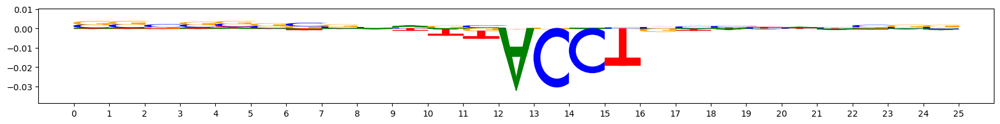

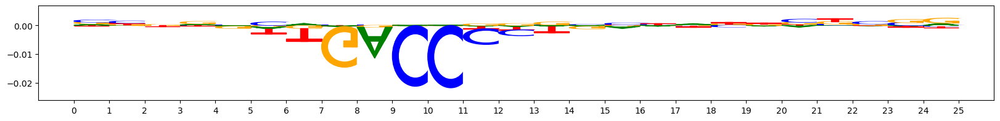

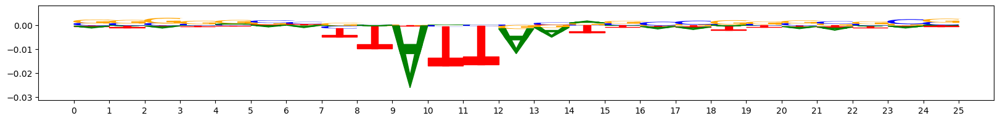

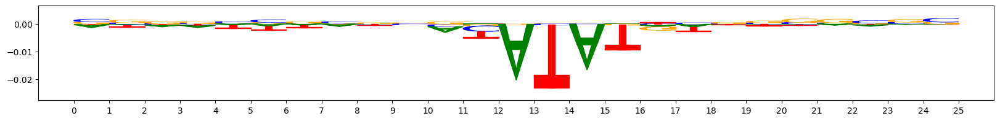

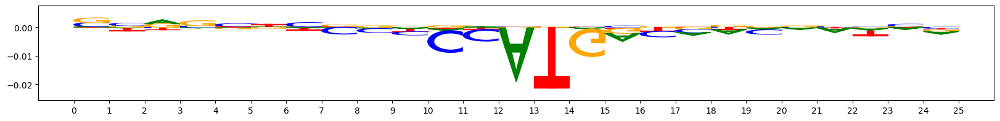

...

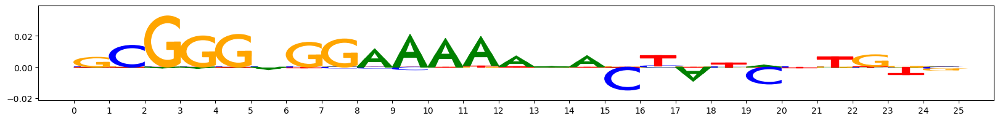

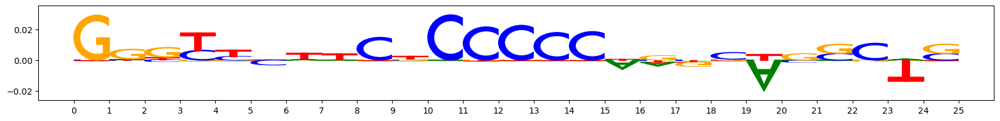

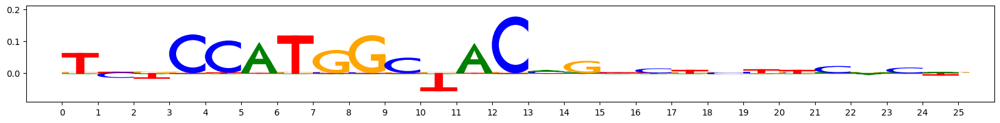

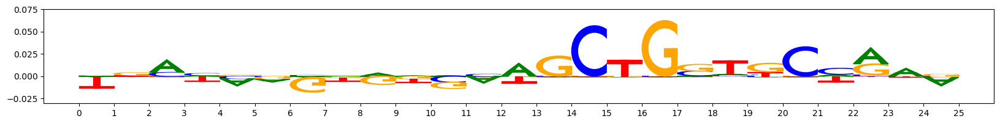

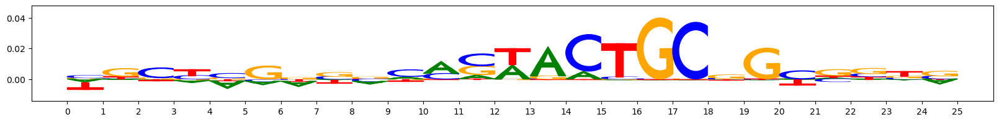

In [48]:
print("Starting Metaclustering!")
mc_idx = len(tfmodisco_results.metacluster_idx_to_submetacluster_results)
SAVE_PATH="../figures/"
trial_name=task
for metacluster_idx in range(mc_idx):

    print(f"Metacluster {metacluster_idx} for task {task}")

    patterns = (tfmodisco_results.metacluster_idx_to_submetacluster_results[
        metacluster_idx
    ].seqlets_to_patterns_result.patterns)

    for pattern_idx, pattern in enumerate(patterns):

        print(f"Pattern idx {pattern_idx} with {len(pattern.seqlets)} seqlets")
        fig = plt.figure(figsize=(20, 2))
        ax = plt.subplot(111)
        viz_sequence.plot_weights_given_ax(
            ax=ax,
            array=pattern[f"{task}_contrib_scores"].fwd,
            height_padding_factor=0.2,
            length_padding=1.0,
            subticks_frequency=1.0,
            highlight={},
        )
        outfile = os.path.join(SAVE_PATH, f"modisco_class_{marker}_{metacluster_idx}_{pattern_idx}_{len(pattern.seqlets)}_5k.pdf")
        print(f"Saving figure at {outfile}")
        fig.savefig(outfile, format='pdf', dpi=200, bbox_inches='tight')

# ==============================================================================
# Save Results
# ==============================================================================

#os.rename('../figures/scoredist_0.png', f'../figures/scoredist_{trial_name}_{marker}.png')
results_file = os.path.join(SAVE_PATH, f"modisco_{marker}_results_5k.hdf5")
tfmodisco_results.save_hdf5(h5py.File(results_file, 'w'))
#del tfmodisco_results


print(f"Finished modisco analysis!\nTook {(end_time-start_time)} seconds.")



Plotting attribution scores...


  0%|          | 0/50 [00:00<?, ?it/s]

Saving Selected Attribution Scores...
Done!


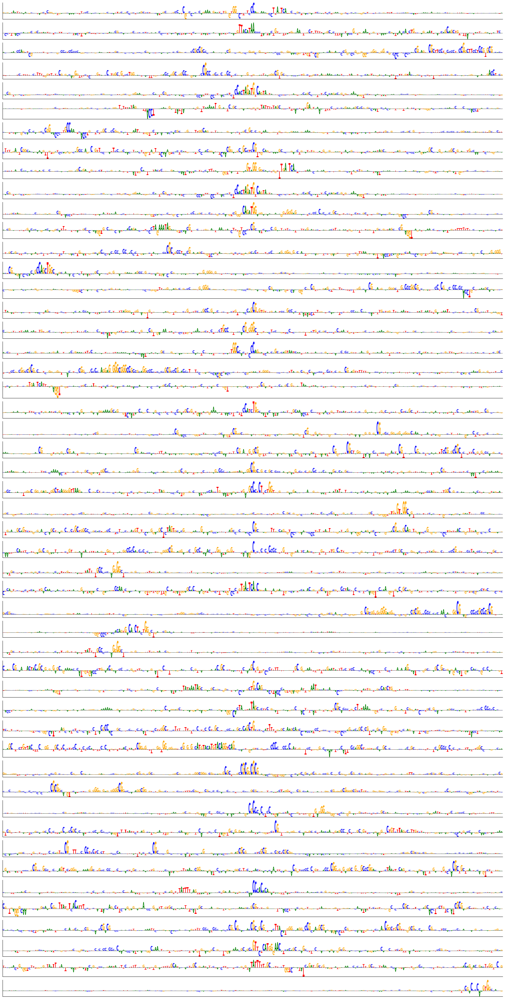

In [51]:
# ==============================================================================
# Plot attribution scores for sequences with top predictions
# ==============================================================================
print(f"Plotting attribution scores...")
idx = np.random.randint(0, len(onehot_data), 50)
attr_scores = task_to_scores[task][idx]

plot_size = 250
num_plots = 50
alphabet = 'ACGT'
N, L, A = attr_scores.shape

fig = plt.figure(figsize=(25, num_plots))

for k in tqdm(range(N)):

    score = np.max(attr_scores[k], axis=1)
    index = np.argmax(score)
    start = np.maximum(0, index-int(plot_size/2))
    end = start + plot_size

    if end > L:
        start = L - plot_size
        end = L
    plot_range = range(start,end)

    counts_df = pd.DataFrame(data=0.0, columns=list(alphabet), index=list(range(plot_size)))
    for a in range(A):
        for l in range(plot_size):
            counts_df.iloc[l, a] = attr_scores[k, plot_range[l], a]

    ax = plt.subplot(num_plots, 1, k+1)
    logomaker.Logo(counts_df, ax=ax)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_ticks_position('none')
    ax.xaxis.set_ticks_position('none')
    plt.xticks([])
    plt.yticks([])

outfile = os.path.join(SAVE_PATH, f"{marker}_examples_5k.pdf")
fig.savefig(outfile, format='pdf', dpi=200, bbox_inches='tight')


# ==============================================================================
# Save attribution scores to h5 file
# ==============================================================================
print("Saving Selected Attribution Scores...")

scores_file = os.path.join(SAVE_PATH, f"{marker}_sampled_scores.h5")
if (os.path.isfile(scores_file)):
    cmd = 'rm ' + scores_file
    subprocess.call(cmd, shell=True)

with h5py.File(scores_file, "a") as f:

    f.create_dataset(
      f"scores",
      data=attr_scores,
      compression='gzip'
    )
print("Done!")